In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import matplotlib.gridspec as gridspec
import os
pd.set_option('display.max_columns',None)
from IPython.display import Image
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
# !pip3 install spacy --quiet 
# from spacy.lang.en.stop_words import STOP_WORDS
# import string
# from PIL import Image
# !pip3 install nltk --quiet 
# !pip3 install wordcloud --quiet
# import nltk
# from wordcloud import WordCloud,STOPWORDS
# from nltk.corpus import stopwords
# from nltk.tokenize import word_tokenize,TweetTokenizer
# from sklearn.feature_extraction.text import TfidfVectorizer
# nltk.download('wordnet')
from sklearn.decomposition import PCA,LatentDirichletAllocation
from sklearn import metrics
from scipy.spatial.distance import cdist
from tqdm import tqdm
from sklearn.manifold import TSNE
plt.style.use('fivethirtyeight')
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score,cross_val_predict
from sklearn.linear_model import SGDClassifier
!pip3 install umap-learn --quiet
import umap
from sklearn.model_selection import StratifiedShuffleSplit,cross_val_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error,roc_auc_score,auc,plot_confusion_matrix,plot_roc_curve,confusion_matrix,precision_recall_curve,f1_score,recall_score
from sklearn.inspection import permutation_importance
!pip3 install pdpbox --quiet
from pdpbox import pdp
five_thirty_eight = [
    "#30a2da",
    "#fc4f30",
    "#e5ae38",
    "#6d904f",
    "#8b8b8b",
]

sns.set_palette(five_thirty_eight)

In [2]:
df1=pd.read_csv(os.path.join(os.getcwd(),'3079UTW-QNT responses 09-11 - Utilities survey.csv'),header=[0,1])
codebook=df1.columns.to_frame(index=0,name=['Questions','Options'])
data=pd.read_csv(os.path.join(os.getcwd(),'3079UTW-QNT responses 09-11 - Utilities survey.csv'),header=0).iloc[1:]
tmp=pd.read_csv(os.path.join(os.getcwd(),'3079UTW-QNT responses 09-11 - Utilities survey.csv'),header=None,prefix='Q').iloc[2:]

In [4]:
df1.head()

,Respondent ID,Collector ID,Start Date,End Date,IP Address,Email Address,First Name,Last Name,Custom Data 1,"Are you involved in decisions about the household bills in your property? (Energy, Broadband & mobile at a minimum)",What is your age?,What gender are you?,Unnamed: 12_level_0,Which of the following anuual income brackets do you fall in to?,Which part of the UK do you live in?,Do you own or rent the property you live in?,Do you have gas or electric heating,"Including yourself, how many people live in your home?",How many children aged under 18 years live with you?,Which of the following do you currently have?,Unnamed: 20_level_0,Unnamed: 21_level_0,Unnamed: 22_level_0,Unnamed: 23_level_0,Unnamed: 24_level_0,Unnamed: 25_level_0,Unnamed: 26_level_0,Unnamed: 27_level_0,Unnamed: 28_level_0,Unnamed: 29_level_0,Unnamed: 30_level_0,Unnamed: 31_level_0,Unnamed: 32_level_0,Unnamed: 33_level_0,Which of the following do you think of as a 'home service'?,Unnamed: 35_level_0,Unnamed: 36_level_0,Unnamed: 37_level_0,Unnamed: 38_level_0,Unnamed: 39_level_0,Unnamed: 40_level_0,Unnamed: 41_level_0,Unnamed: 42_level_0,Unnamed: 43_level_0,Unnamed: 44_level_0,Unnamed: 45_level_0,Unnamed: 46_level_0,How much do you agree or disagree with this statement: I would find value in receiving all my home services from one provider via a single monthly bill?,If you were to have a single monthly bill for your home services. Which of the following would you find most appealing about it? Please pick up to 3,Unnamed: 49_level_0,Unnamed: 50_level_0,Unnamed: 51_level_0,Unnamed: 52_level_0,Unnamed: 53_level_0,Unnamed: 54_level_0,Unnamed: 55_level_0,And what would you likely find least appealing about it? Please pick up to 3,Unnamed: 57_level_0,Unnamed: 58_level_0,Unnamed: 59_level_0,Unnamed: 60_level_0,Unnamed: 61_level_0,Unnamed: 62_level_0,When did you last switch your energy provider?,What prompted the switch in energy provider? Please pick up to 2,Unnamed: 65_level_0,Unnamed: 66_level_0,Unnamed: 67_level_0,Unnamed: 68_level_0,Unnamed: 69_level_0,Unnamed: 70_level_0,How much do you agree or disagree with the following statement: I would value a long term relationship with an energy provider where prices were stable?,How long-term would you ideally want this relationship to last?,"How much do you agree or disagree with the following statement: I generally try to stay away from long-term contracts (over a year), and look for shorter term contracts with more flexibility","How much do you agree or disagree with the following statement: I feel relatively savvy when it's comes to understanding Energy Tariffs, Standing Charges, and Unit Rates","Assuming no change in the price you pay, which of these would prompt you to consider switching from your current Energy provider?..... please pick up to 3 reasons to switch",Unnamed: 76_level_0,Unnamed: 77_level_0,Unnamed: 78_level_0,Unnamed: 79_level_0,Unnamed: 80_level_0,Unnamed: 81_level_0,Unnamed: 82_level_0,When did you last switch your mobile phone service provider?,What was the main reason for the switch of your mobile service?Â Please pick up to 2,Unnamed: 85_level_0,Unnamed: 86_level_0,Unnamed: 87_level_0,Unnamed: 88_level_0,Unnamed: 89_level_0,Unnamed: 90_level_0,Unnamed: 91_level_0,Unnamed: 92_level_0,"Assuming no change in the price you pay, which of these would prompt you to consider switching from your current Mobile service provider? Please pick up to 3 reasons to switch",Unnamed: 94_level_0,Unnamed: 95_level_0,Unnamed: 96_level_0,Unnamed: 97_level_0,Unnamed: 98_level_0,Unnamed: 99_level_0,Unnamed: 100_level_0,Unnamed: 101_level_0,When did you last switch your broadband provider?,What was the main reason for your broadband switch? Please pick up to 2 reasons,Unnamed: 104_level_0,Unnamed: 105_level_0,Unnamed: 106_level_0,Unnamed: 107_level_0,Unnamed: 108_level_0,Unnamed: 109_level_0,Unnamed: 110_level_0,Unnamed: 111_level_0,Unnamed: 112_level_0,How much do you agree or disagree with the following statement:

In [3]:
class Preprocessing:
    data =data
#     punctuations=string.punctuation
#     stopwords=list(STOP_WORDS)
    def __init__(self,df):
        self.df = df 
    
    def clean_df(self):
        self.df.loc[~(self.df['Q11']=='Female')&~(self.df['Q11']=='Male'),'Q11']='Female'
        self.df.loc[self.df['Q10']=='T','Q10']=self.df['Q10'].mode()[0]
        self.df.loc[self.df['Q10']=='550','Q10']='55'
        self.df.loc[self.df['Q10']=='67l','Q10']='67'
        self.df['Q10']=self.df['Q10'].astype(int)
        self.df.loc[(self.df['Q10'])>18 & (self.df['Q10']<=35),'Age_Band']='17-35'
        self.df.loc[(self.df['Q10']>35)&(self.df['Q10']<=46),'Age_Band']='35-55'
        self.df.loc[(self.df['Q10'])>55,'Age_Band']='55-91'
        self.df['Q13']=self.df['Q13'].apply(lambda x:str(x).replace('Â',''))
        return self.df 
    
    def check_null(self):
        
        self.df=self.clean_df()
        flag=self.df.isnull().sum().any()
        if flag==True:
            total=self.df.isnull().sum().sort_values(ascending=False)
            percent = (self.df.isnull().sum()/self.df.isnull().count()).sort_values(ascending=False)
            missing=pd.concat([total,percent],keys=['total','percent'],axis=1)

            data_type=[]
            for col in self.df.columns:
                dtypes=self.df[col].dtype
                data_type.append(dtypes)
            missing['dtype']=data_type
            return missing
        else:
            return False

    def print_df(self):
        return print(f'{self.df.shape}')

    def dict_df(self):
        return dict(zip(data,self.df))  


In [4]:
"""
Shape of df has changed after Subprocessing, how could I preserve the orginal df 
"""

# class Subprocessing(Preprocessing):
#     def __init__(self,df):
#         Preprocessing.__init__(self,df)

#     def drop_missing(self):
        
#         missing=self.check_null()
#         self.df.drop(missing[missing.percent>0.998].index,axis=1,inplace=True)
#         self.df.fillna(0,inplace=True)
#         return self.df 
# df=Subprocessing(tmp).drop_missing()

'\nShape of df has changed after Subprocessing, how could I preserve the orginal df \n'

In [4]:
preprocessing=Preprocessing(tmp)
tmp=preprocessing.clean_df() ## tmp for visualisation, as DF fillna(0), count will be the same
missing=preprocessing.check_null()
df=tmp.drop(missing[missing.percent>0.998].index,axis=1)
df.fillna(0,inplace=True)

In [5]:
preprocessing.dict_df()

{'Respondent ID': 'Q0',
 'Collector ID': 'Q1',
 'Start Date': 'Q2',
 'End Date': 'Q3',
 'IP Address': 'Q4',
 'Email Address': 'Q5',
 'First Name': 'Q6',
 'Last Name': 'Q7',
 'Custom Data 1': 'Q8',
 'Are you involved in decisions about the household bills in your property? (Energy, Broadband & mobile at a minimum)': 'Q9',
 'What is your age?': 'Q10',
 'What gender are you?': 'Q11',
 'Unnamed: 12': 'Q12',
 'Which of the following anuual income brackets do you fall in to?': 'Q13',
 'Which part of the UK do you live in?': 'Q14',
 'Do you own or rent the property you live in?': 'Q15',
 'Do you have gas or electric heating': 'Q16',
 'Including yourself, how many people live in your home?': 'Q17',
 'How many children aged under 18 years live with you?': 'Q18',
 'Which of the following do you currently have?': 'Q19',
 'Unnamed: 20': 'Q20',
 'Unnamed: 21': 'Q21',
 'Unnamed: 22': 'Q22',
 'Unnamed: 23': 'Q23',
 'Unnamed: 24': 'Q24',
 'Unnamed: 25': 'Q25',
 'Unnamed: 26': 'Q26',
 'Unnamed: 27': 'Q

In [6]:
def train_columns(exclu_columns):
    columns=[]
    for col in df.columns:       
        if col not in exclu_columns:
            columns.append(col)
    return df[columns]
train=train_columns(['Q0', 'Q1','Q2','Q3','Q4','Q10'])
train.Q17.replace({'1':1,'2':2,'3':3,'4':3,'5 or more':3},inplace=True)
train.Q18.replace({'None':0,'0':0,'1':1,'2':1,'3':2,'4':2,'5 or more':2},inplace=True)
[data.columns.to_list().index(i) for i in [col for col in data.columns if 'agree or disagree' in col]]

ordinals={'Q13':['Under £15k','£15-25k','£25-35k','£35-50k','£50k+'],
 'Q47':['Strongly disagree','Disagree','Neither disagree nor agree','Agree','Strongly agree'],
 'Q71':['Strongly disagree','Disagree','Neither disagree nor agree','Agree','Strongly agree'],
 'Q73':['Strongly disagree','Disagree','Neither disagree nor agree','Agree','Strongly agree'],
 'Q74':['Strongly disagree','Disagree','Neither disagree nor agree','Agree','Strongly agree'],
 'Q113':['Strongly disagree','Disagree','Neither disagree nor agree','Agree','Strongly agree'],
 'Q114':['Strongly disagree','Disagree','Neither disagree nor agree','Agree','Strongly agree'],
 'Q115':['Strongly disagree','Disagree','Neither disagree nor agree','Agree','Strongly agree'],
 'Q128':['Strongly disagree','Disagree','Neither disagree nor agree','Agree','Strongly agree'],
 'Q72':['12 months','12-18 months','18-24 months','2 - 5 years','Indefinitely'],
 'Q83':['Never','Within the last year','Within the last 3 years','Over 3 years ago'],
 'Q102':['Never','Within the last year','Within the last 3 years','Over 3 years ago'],
 'Age_Band':['17-35','35-55','55-91']}
def categorise_cat(df,ordinals):
    cat_dicts={}
    for c in df.columns:
        categories=ordinals.get(c)
        df[c]=pd.Categorical(df[c],categories=categories,ordered=categories is not None)
        cats=df[c].cat.categories
        cat_dicts[c]=cats
    return cat_dicts
cat_dicts=categorise_cat(train,ordinals)

def encoding_cat(df,ordinals):
    for col in df.columns:
        if col not in ordinals.keys():
            df[col]=df[col].cat.codes
        else:
            df[col]=df[col].cat.codes+1
    return df


In [7]:
class Encoding:
    ordinals={'Q13':['Under £15k','£15-25k','£25-35k','£35-50k','£50k+'],
 'Q47':['Strongly disagree','Disagree','Neither disagree nor agree','Agree','Strongly agree'],
 'Q71':['Strongly disagree','Disagree','Neither disagree nor agree','Agree','Strongly agree'],
 'Q73':['Strongly disagree','Disagree','Neither disagree nor agree','Agree','Strongly agree'],
 'Q74':['Strongly disagree','Disagree','Neither disagree nor agree','Agree','Strongly agree'],
 'Q113':['Strongly disagree','Disagree','Neither disagree nor agree','Agree','Strongly agree'],
 'Q114':['Strongly disagree','Disagree','Neither disagree nor agree','Agree','Strongly agree'],
 'Q115':['Strongly disagree','Disagree','Neither disagree nor agree','Agree','Strongly agree'],
 'Q128':['Strongly disagree','Disagree','Neither disagree nor agree','Agree','Strongly agree'],
 'Q72':['12 months','12-18 months','18-24 months','2 - 5 years','Indefinitely'],
 'Q83':['Never','Within the last year','Within the last 3 years','Over 3 years ago'],
 'Q102':['Never','Within the last year','Within the last 3 years','Over 3 years ago'],
 'Age_Band':['17-35','35-55','55-91']}
    def __init__(self,df):
        self.df=df
    def categorise_cat(self):
        cat_dicts={}
        for c in self.df.columns:
            categories=ordinals.get(c)
            self.df[c]=pd.Categorical(self.df[c],categories=categories,ordered=categories is not None)
            cats=self.df[c].cat.categories
            cat_dicts[c]=cats
        return cat_dicts
    def encoding_cat(self):

        for col in self.df.columns:
            if col not in ordinals.keys():
                self.df[col]=self.df[col].cat.codes
            else:
                self.df[col]=self.df[col].cat.codes+1
        return self.df



In [8]:
encoding=Encoding(train)
encoding.encoding_cat()

,Q9,Q11,Q13,Q14,Q15,Q16,Q17,Q18,Q19,Q20,Q21,Q22,Q23,Q24,Q25,Q26,Q27,Q28,Q29,Q30,Q31,Q32,Q33,Q34,Q35,Q36,Q37,Q38,Q39,Q40,Q41,Q42,Q43,Q44,Q45,Q46,Q47,Q48,Q49,Q50,Q51,Q52,Q53,Q54,Q55,Q56,Q57,Q58,Q59,Q60,Q61,Q62,Q63,Q64,Q65,Q66,Q67,Q68,Q69,Q70,Q71,Q72,Q73,Q74,Q75,Q76,Q77,Q78,Q79,Q80,Q81,Q82,Q83,Q84,Q85,Q86,Q87,Q88,Q89,Q90,Q91,Q92,Q93,Q94,Q95,Q96,Q97,Q98,Q99,Q100,Q101,Q102,Q103,Q104,Q105,Q106,Q107,Q108,Q109,Q110,Q111,Q112,Q113,Q114,Q115,Q116,Q117,Q118,Q119,Q120,Q121,Q122,Q123,Q124,Q125,Q126,Q127,Q128,Q129,Age_Band
2,0,1,2,10,0,0,1,0,1,1,1,1,1,1,0,0,0,0,1,1,1,0,0,1,1,1,1,1,0,1,0,1,0,0,0,0,2,0,0,1,0,0,1,1,0,1,1,0,0,1,0,0,2,1,0,0,0,0,0,0,4,4,3,4,0,1,1,0,1,0,0,0,4,0,1,0,0,0,1,0,0,0,1,0,0,1,1,0,0,0,0,3,0,0,1,0,0,0,0,0,1,0,4,4,4,0,1,0,1,0,0,0,1,0,1,0,0,2,4,3
3,0,1,5,8,0,0,1,0,0,1,1,1,1,1,1,0,0,0,1,1,1,0,0,1,1,1,0,1,0,1,0,1,0,0,0,0,4,0,0,1,0,1,1,0,0,1,1,0,0,0,0,0,2,0,1,0,1,0,0,0,5,5,3,4,0,0,0,0,0,1,0,0,3,0,0,0,0,0,0,0,0,1,1,0,1,1,0,0,0,0,0,4,0,0,0,0,0,0,0,0,0,1,5,4,4,0,0,1,0,0,0,0,0,0,1,1,0,5,2,2
4,0,0,2,2,0,0,1,0,1,0,1,1,0,1,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,3,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,3,0,1,0,0,0,0,0,5,5,4,3,1,0,1,1,0,0,0,0,4,0,0,0,0,1,0,0,0,0,1,1,0,0,0,1,0,0,0,4,1,0,0,0,0,0,0,0,0,0,5,4,4,1,1,1,0,0,0,0,0,1,1,1,0,5,3,3
5,0,0,4,11,0,1,1,0,1,1,1,0,1,0,0,0,0,0,1,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,3,1,0,0,0,0,0,0,4,4,3,5,0,0,0,0,0,0,0,1,4,1,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,2,3,4,0,0,0,0,0,1,0,0,1,1,1,0,1,0,3
6,0,0,4,12,0,1,0,0,1,1,1,0,1,0,0,0,0,0,1,0,1,0,0,1,1,1,1,1,0,1,0,1,1,0,0,0,3,1,0,0,0,1,1,0,0,1,1,0,1,0,0,0,1,0,1,0,0,0,0,0,4,4,2,4,1,0,1,0,0,1,0,0,4,1,1,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,4,0,0,0,0,0,0,0,0,0,1,3,4,3,1,1,1,0,0,0,1,1,0,0,1,0,4,4,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4031,0,1,1,10,1,1,0,0,0,0,1,0,1,0,1,0,0,1,1,0,1,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,5,0,0,1,0,1,1,0,0,1,1,0,0,0,1,0,3,0,0,0,0,0,0,1,5,2,4,5,1,0,0,0,1,0,0,0,2,1,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,1,0,2,1,0,1,0,0,0,0,0,0,0,5,5,5,0,0,0,0,1,0,1,0,1,1,0,0,5,0,1
4032,0,1,1,4,0,1,1,0,1,0,1,1,1,1,0,0,0,0,1,0,1,0,0,1,1,1,1,0,0,0,0,1,1,1,1,0,3,0,0,0,1,0,1,0,0,1,1,0,0,1,0,0,2,0,1,0,0,0,0,1,5,5,2,2,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,3,0,0,0,0,0,0,0,0,0,1,5,5,5,0,1,1,0,0,0,1,1,1,0,0,0,4,1,1
4033,0,1,1,1,1,0,2,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,1,1,0,1,1,0,1,0,0,0,0,0,0,2,0,0,1,0,1,1,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,4,4,3,2,0,0,1,0,0,1,1,0,4,0,0,0,0,1,1,0,0,0,1,0,0,0,1,0,0,1,0,3,0,1,0,0,1,0,0,0,0,0,5,1,1,0,1,1,0,0,0,0,0,1,0,1,0,4,5,1
4034,0,1,2,4,0,1,1,0,1,1,0,1,1,0,0,0,0,0,1,1,0,1,0,1,1,1,1,1,1,1,0,1,0,0,0,0,4,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,2,0,0,0,1,0,1,0,5,2,3,5,0,1,1,0,0,1,0,0,3,1,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,3,1,0,0,0,0,0,0,0,0,0,5,4,5,1,1,1,0,0,0,0,0,0,1,0,0,3,1,1


In [9]:
train_tsne=train.loc[:,'Q19':]
train_tsne=train_tsne.iloc[:,:-1]

In [11]:
# pca=PCA(n_components=0.95,random_state=42)## keeping 95% variance
# X_pca=pca.fit_transform(train)
# print(f'Shape of train:{train.shape}, shape of PCA reduction:{X_pca.shape}')

In [28]:
column_list=list(range(19,34))
group_index=tmp.columns.to_list().index('Age_Band')
column_list.append(group_index)
series=tmp.iloc[:,column_list].groupby('Age_Band').count().unstack()
res=[]
for group in series.index.levels[1]:
    for val in series.index.levels[0]:
        res.append([((series[val][group]/tmp.Age_Band.value_counts()[group])*100).round(2),group,codebook.iloc[int(val[1:]),1]])
table=pd.DataFrame(res,columns=['%','group','option'])
ax=sns.barplot(x='%',y='option',data=table,hue='group')
ax.set(xlim=(0,100))
ax.set_ylabel('')

In [73]:
pd.crosstab(tmp.Age_Band,tmp.Q47).sum(axis=1)

Age_Band
17-35    1795
35-55    1081
55-91    1158
dtype: int64

<AxesSubplot:xlabel='Age_Band'>

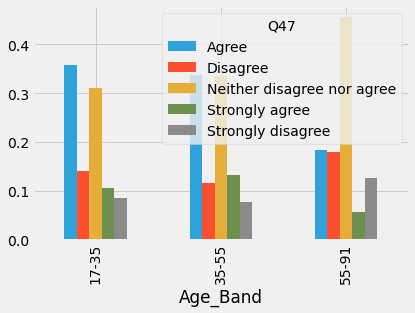

In [77]:
pd.crosstab(tmp.Age_Band,tmp.Q47).div(pd.crosstab(tmp.Age_Band,tmp.Q47).sum(axis=1),axis=0).plot(kind='bar')

## Q12 Regression
    - Turn the answers of Q12 to ordinals as target, using demographic features to predict Q12 

In [363]:
# Q47 : Q12
# Q71 :Q17
bar_columns=['Q9','Age_Band','Q11','Q13','Q14','Q15','Q16','Q17','Q18','Q63','Q72','Q83','Q102','Q129','Q47'] ## As demographic input
train_q47=train[bar_columns]
encoding_q47={1:-2,2:-1,3:0,4:1,5:2}
train_q47['Q47']=train_q47.Q47.map(encoding_q47)

In [364]:
def rmse(model):
    rmse=np.sqrt(-cross_val_score(model,X_test,y_test,scoring='neg_mean_squared_error',cv=2))
    return rmse

In [365]:
X,y = train_q47.iloc[:,:-1],train_q47['Q47']
sss=StratifiedShuffleSplit(n_splits=1,test_size=0.5,random_state=42)
for train_idx,test_idx in sss.split(X,y):
    X_train,X_test,y_train,y_test=X.iloc[train_idx],X.iloc[test_idx],y.iloc[train_idx],y.iloc[test_idx]
    model=RandomForestRegressor()
    model.fit(X_train,y_train)
    y_pred=model.predict(X_test)
    print(np.mean(rmse(model)))

1.0875161226666739


In [60]:
def check_parameters(parameters,values,fixed={},features=None):
    scores=[]
    mean_scores=[]
    print(f"Fitting {parameters}={values}")
    for p in values:
        feats=X_train.columns if features is None else features
        kw={parameters:p,**fixed}
        model=RandomForestRegressor(**kw)
        for label in y_train.unique():
            model.fit(X_train[feats],y_train==label)
            cv_score = np.mean(rmse(model))
            scores.append(cv_score)
        print(f'Mean RMSE ={np.mean(scores)}')
        mean_scores.append(np.mean(scores))
    plt.title(parameters)
    plt.plot(values,mean_scores)

Fitting n_estimators=[1, 5, 10, 30, 50]
Mean RMSE =1.5098481745900876
Mean RMSE =1.3436984406055519
Mean RMSE =1.2718189973394578
Mean RMSE =1.2281725710163596
Mean RMSE =1.200395325985623


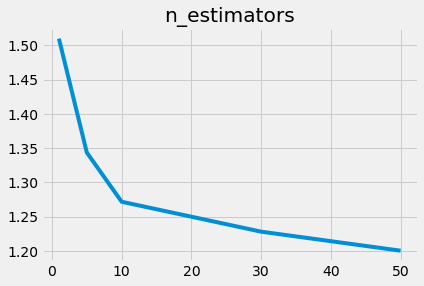

In [61]:
check_parameters('n_estimators',[1,5,10,30,50],{'n_jobs':-1})

Fitting min_samples_leaf=[1, 3, 5, 10, 25, 50]
Mean RMSE =1.1039520099329556
Mean RMSE =1.094937951889768
Mean RMSE =1.087798695438172
Mean RMSE =1.0805503365104716
Mean RMSE =1.0750196279682247
Mean RMSE =1.0714417812245052


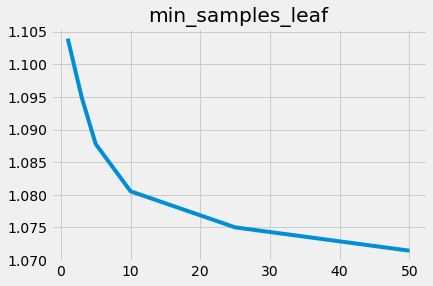

In [62]:
d={'n_estimators':20,'n_jobs':-1}
p='min_samples_leaf'
v=[1,3,5,10,25,50]
check_parameters(p,v,d)

Fitting max_features=['log2', 'sqrt', 'auto']
Mean RMSE =1.0550309757195562
Mean RMSE =1.0545442181397942
Mean RMSE =1.0532516614350889


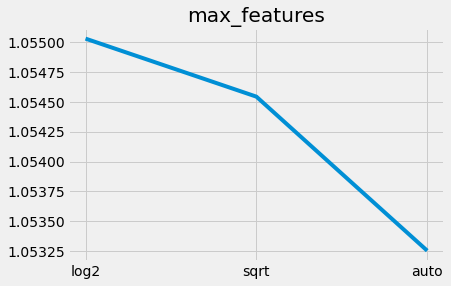

In [63]:
d={'n_estimators':20,'n_jobs':-1,'min_samples_leaf':25}
p='max_features'
v=['log2','sqrt','auto']
check_parameters(p,v,d)

In [20]:
# pres={label:[] for label in y_train.unique()}
# def print_report(model,features=None):
#     fts = X_train.columns if features is None else features
#     for label in y_train.unique():
#         model.fit(X_train[fts],y_train==label)
#         rf_probs=model.predict_proba(X_test[fts])[:,1]
#         pres[label]=roc_auc_score(y_test==label,rf_probs)
#         print(f'Validation Label {label} ROC_AUC={pres[label]}')
#     model.fit(X_train,y_train)
#     plot_confusion_matrix(model,X_test,y_test)    

In [64]:
def rmsle(y, y_pred):
    return np.sqrt(mean_squared_error(y, y_pred))


In [368]:
def print_report(model,features=None):
    fts= X_train.columns if features is None else features
    model.fit(X_train[fts],y_train)
    y_pred=model.predict(X_test[fts])
    print(f'RMSE of y_pred: {rmsle(y_test,y_pred)}')

In [366]:
d = {'n_estimators':20,'n_jobs':-1,'min_samples_leaf':25,'max_features':'sqrt','random_state':42}
%time model=RandomForestRegressor(**d)

CPU times: user 180 µs, sys: 15 µs, total: 195 µs
Wall time: 203 µs


In [90]:
# a measure of how spread out these residuals are, how concentrated the data is around the line of best fit
print_report(model)

RMSE of y_pred: 1.0610996762625136


In [ ]:
fi=pd.DataFrame({'features':X_train.columns,'importance':model.feature_importances_})
fi.set_index('features',inplace=True)

<AxesSubplot:ylabel='features'>

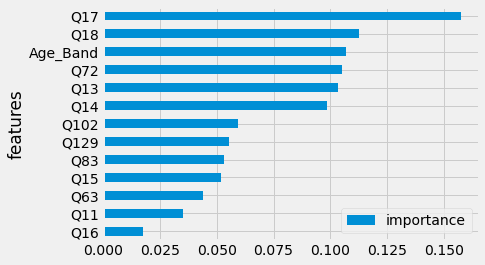

In [92]:
fi[fi.importance>0.001].sort_values(by=['importance']).plot(kind='barh')

In [93]:
new_features=fi[fi.importance>0.001].sort_values(by=['importance']).index.to_list()

In [94]:
def print_feature(features):
    def get_feature_names(q):
        d=preprocessing.dict_df()
        return {d[k]:k for k in d}.get(q)
    for n in features:
        print(n,get_feature_names(n))

In [95]:
model.fit(X_train[new_features],y_train)

RandomForestRegressor(max_features='sqrt', min_samples_leaf=25, n_estimators=20,
                      n_jobs=-1, random_state=42)

In [96]:
print_feature(new_features)

Q16 Do you have gas or electric heating
Q11 What gender are you?
Q63 When did you last switch your energy provider?
Q15 Do you own or rent the property you live in?
Q83 When did you last switch your mobile phone service provider?
Q129 When you have a specific question, or something's wrong with your service from any provider, what do you prefer to do?
Q102 When did you last switch your broadband provider?
Q14 Which part of the UK do you live in?
Q13 Which of the following anuual income brackets do you fall in to?
Q72 How long-term would you ideally want this relationship to last?
Age_Band None
Q18 How many children aged under 18 years live with you?
Q17 Including yourself, how many people live in your home?


In [75]:
dict(zip(df.Age_Band,train.Age_Band))
# dict(zip(df.Q18,train.Q18))
# dict(zip(df.Q17,train_q47.Q17))
# dict(zip(df.Q72,train_q47.Q72))
# dict(zip(df.Q14,train_q47.Q14))
# dict(zip(df.Q13,train_q47.Q13))
# dict(zip(df.Q15,train_q47.Q15))
# dict(zip(df.Q129,train_q47.Q129))
# dict(zip(df.Q83,train_q47.Q83))
# dict(zip(df.Q102,train_q47.Q102))
# dict(zip(df.Q63,train_q47.Q63))
# dict(zip(df.Q11,train_q47.Q11))
# dict(zip(df.Q16,train_q47.Q16))

{'55-91': 3, '35-55': 2, '17-35': 1}

(<Figure size 1080x684 with 2 Axes>,
 {'title_ax': <AxesSubplot:>, 'pdp_ax': <AxesSubplot:xlabel='Age_Band'>})

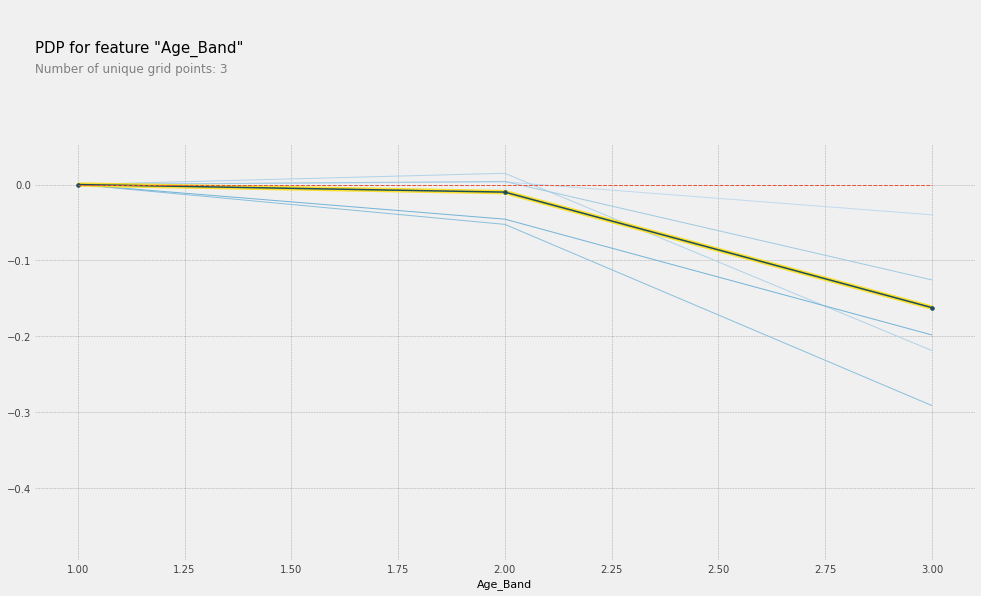

In [98]:
p=pdp.pdp_isolate(model,X_train.sample(500),new_features,'Age_Band')
pdp.pdp_plot(p,'Age_Band',plot_lines=True,cluster=True,n_cluster_centers=5)

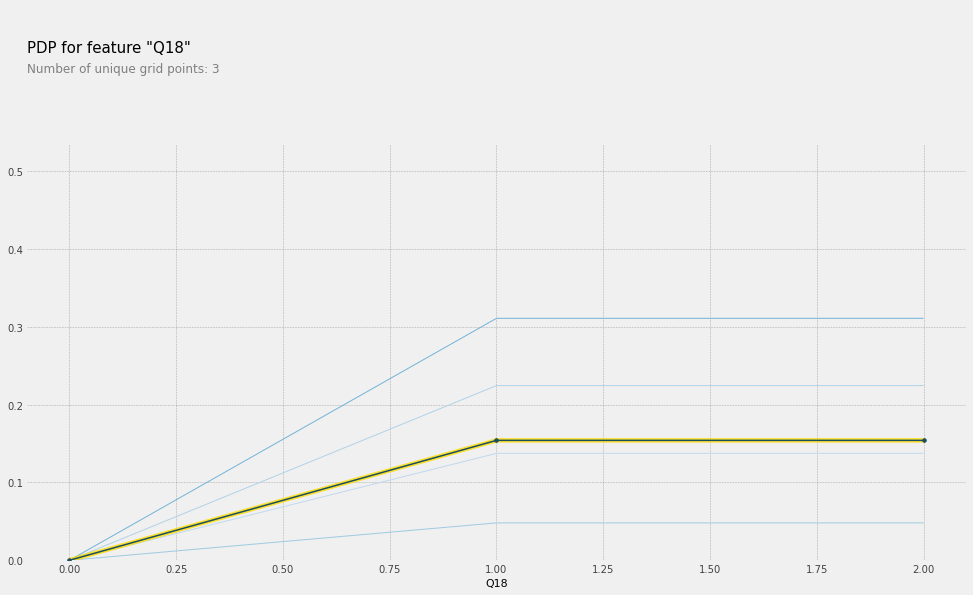

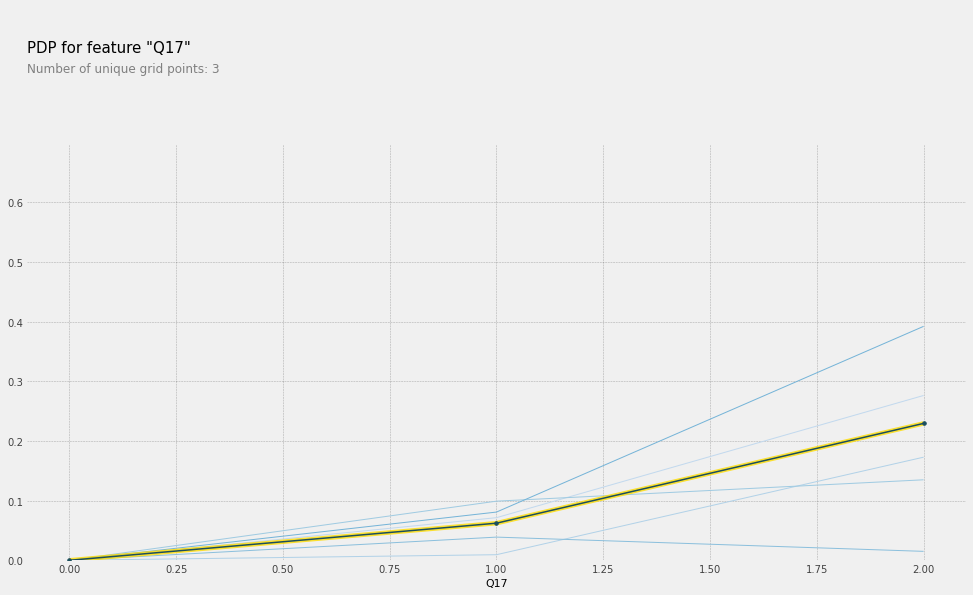

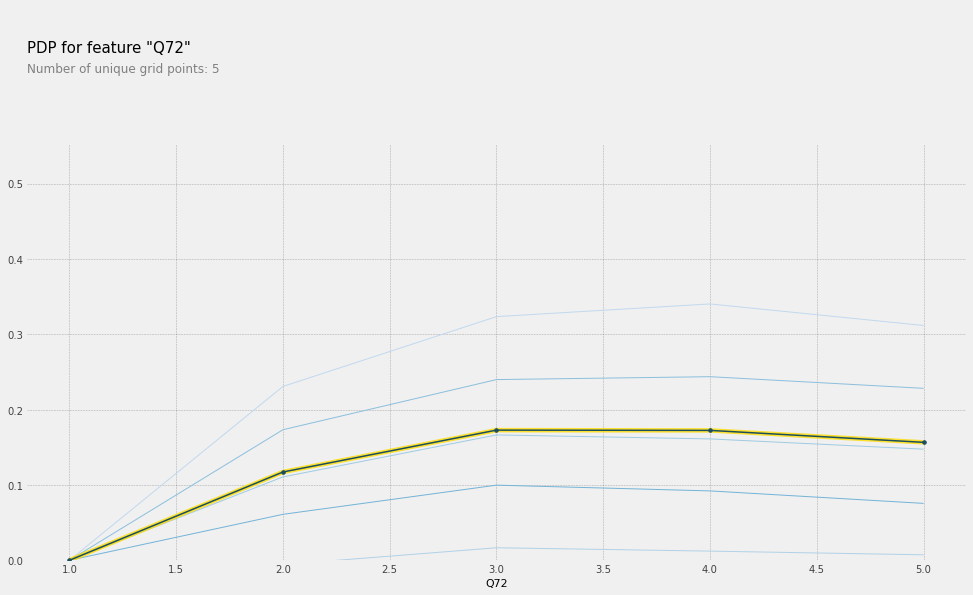

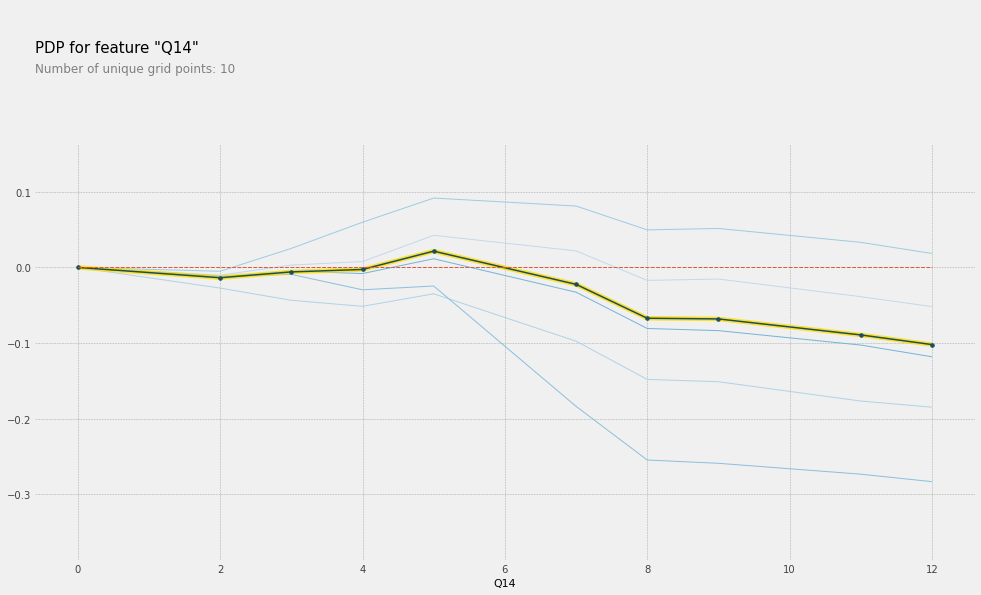

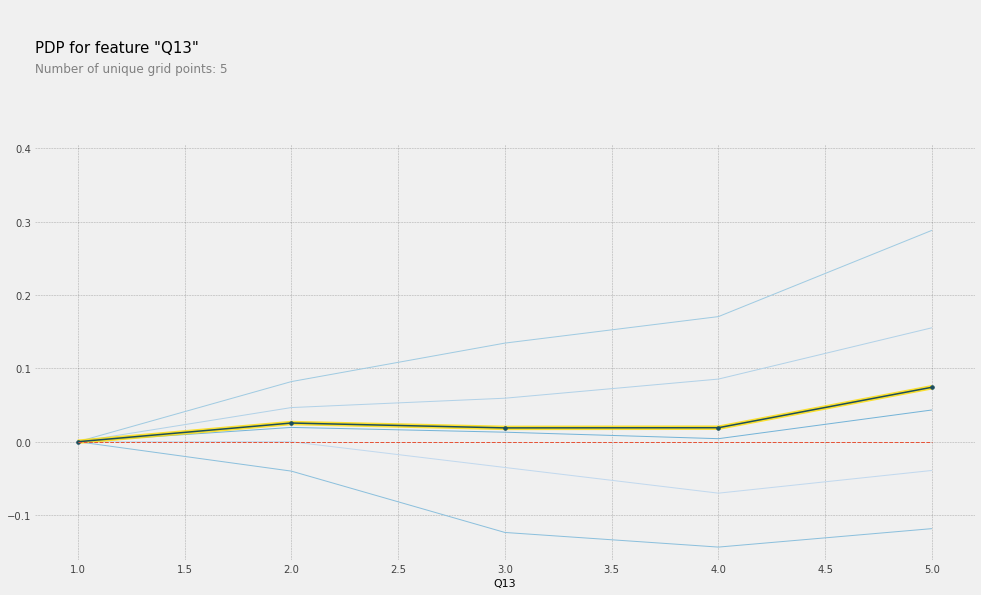

...

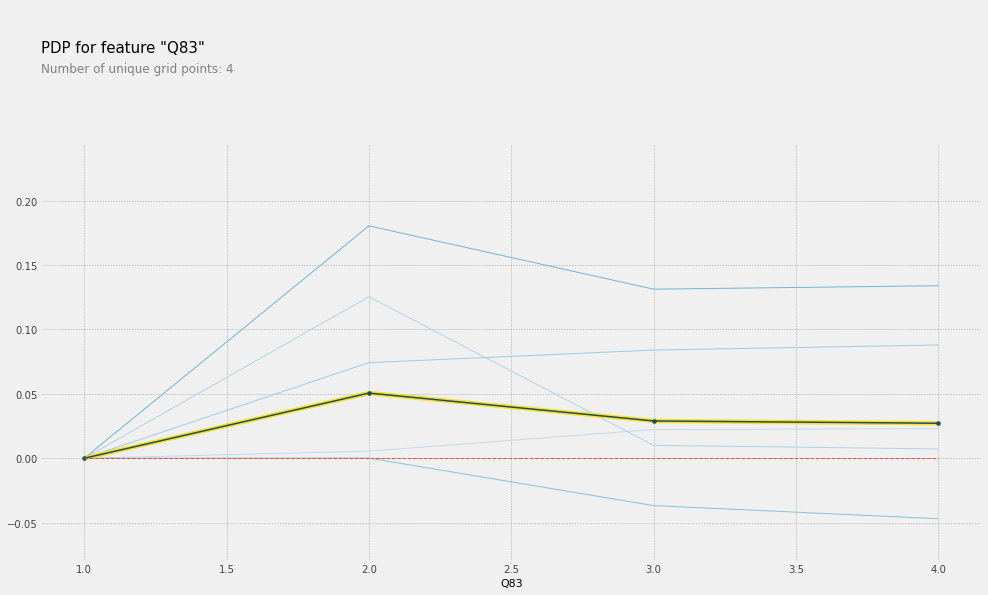

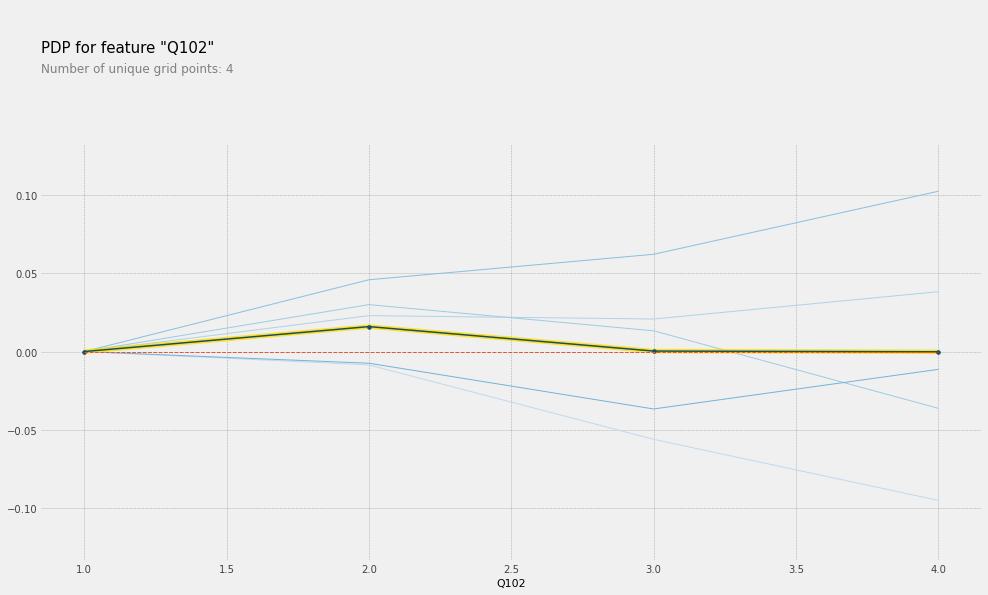

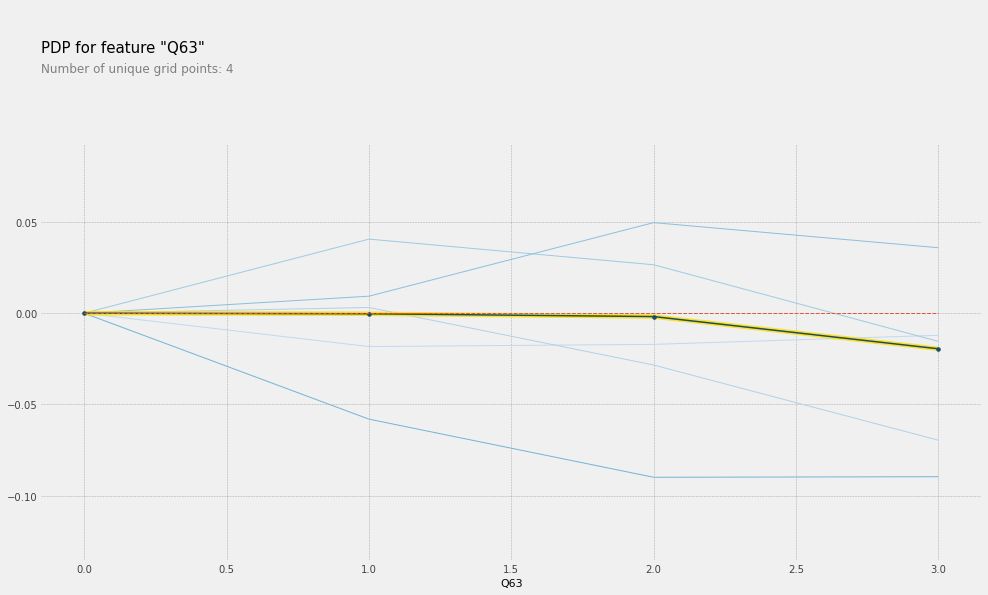

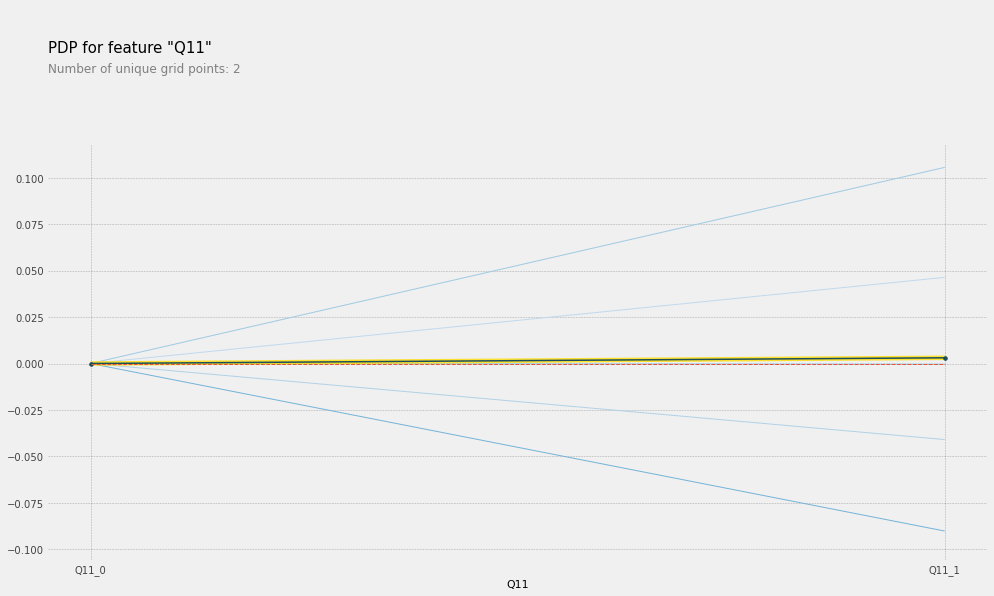

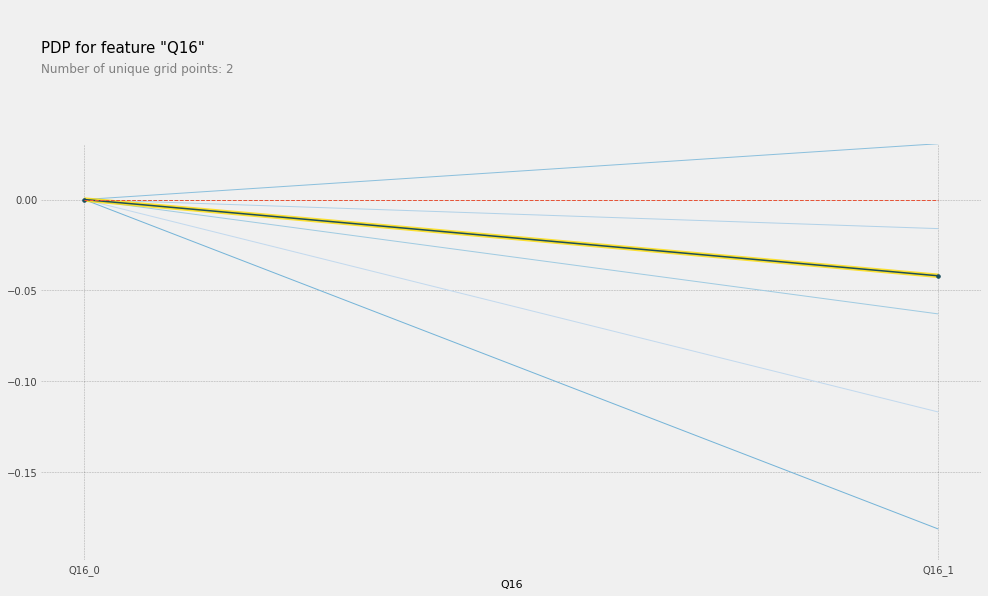

In [111]:
#Q18: When people have 1 and more kids live with them they tend to score higher
#Q17: When the household size is 3 and more,they score higher
#Age_Band: the older the people the more adverse they are and score lower
#Q72: the longer the relatioship to last(18-24 months), the higher they score
#Q14: people in North West(5) tend to score higher compared to people in Wales, West Midlands and Yorkshire
#Q13: the higher the income, the higher they tend to score higher 
#Q15: People who rent tend to score higher
#Q129: People who prefers to have a web chat with someone in support tend to score higher, weak indicator
#Q83: no massive diff
#Q102:no massive diff
#Q63: people who switched energy provider within the last year score the lowest 
#Q11
for f in reversed(new_features):
    p=pdp.pdp_isolate(model,X_train.sample(500),new_features,f)
    pdp.pdp_plot(p,f,plot_lines=True,cluster=True,n_cluster_centers=5)

(<Figure size 540x684 with 3 Axes>,
 {'title_ax': <AxesSubplot:>,
  'pdp_inter_ax': <AxesSubplot:xlabel='Q13', ylabel='Q14'>})

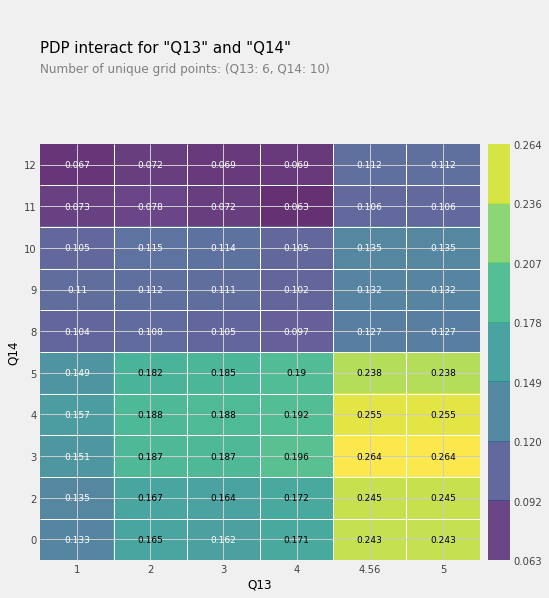

In [93]:
p=pdp.pdp_interact(model,X_train.sample(500),new_features,features=['Q13','Q14'],num_grid_points=[10,10],n_jobs=4,)
pdp.pdp_interact_plot(p,feature_names=['Q13','Q14'],x_quantile=True,ncols=2,plot_type='grid')
# Q13: income, Q14: location(3:London, 5:North West)

(<Figure size 540x684 with 3 Axes>,
 {'title_ax': <AxesSubplot:>,
  'pdp_inter_ax': <AxesSubplot:xlabel='Q15', ylabel='Q13'>})

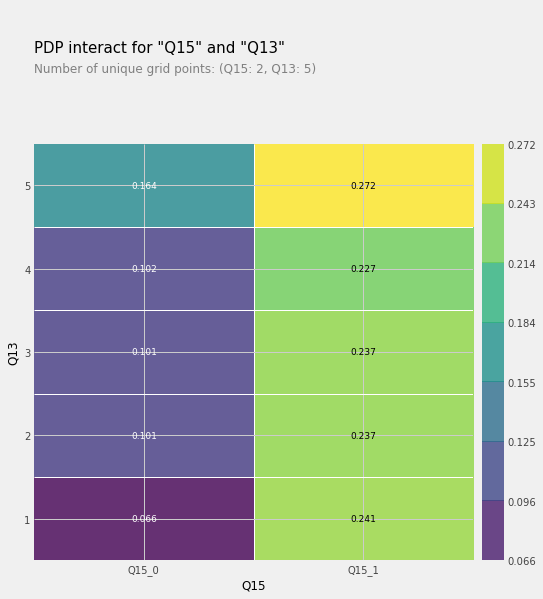

In [71]:
p=pdp.pdp_interact(model,X_train.sample(500),new_features,features=['Q15','Q13'],num_grid_points=[10,10],n_jobs=4)
pdp.pdp_interact_plot(p,feature_names=['Q15','Q13'],plot_type='grid',x_quantile=True,ncols=2)

In [ ]:
umap=umap.UMAP()
umap_embedding=umap.fit_transform(train_q47)

In [115]:
# k=8
# kmeans=KMeans(n_clusters=k,random_state=42)
# y_pred=kmeans.fit_predict(umap_embedding)
# columns=['Q11','Age_Band', 'Q13', 'Q14', 'Q15', 'Q16', 'Q17', 'Q18', 'Q63', 'Q72',
#        'Q83', 'Q102', 'Q129', 'Q47']
# X_copy=tmp[columns].copy()
# X_copy['umap_y']=y_pred
# X_copy.to_pickle('X_copy.pkl')

In [47]:
X_copy=pd.read_pickle('X_copy')
y_pred=np.array(X_copy.umap_y)

array([4, 2, 5, ..., 5, 1, 2], dtype=int32)

Text(0.5, 1.0, 'Umap for Demographic Data with K-means Labels')

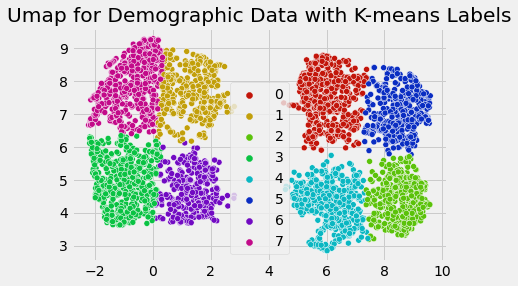

In [116]:

sns.scatterplot(umap_embedding[:,0],umap_embedding[:,1],palette=sns.hls_palette(k,l=.4,s=.9),hue=y_pred).set_title('Umap for Demographic Data with K-means Labels')

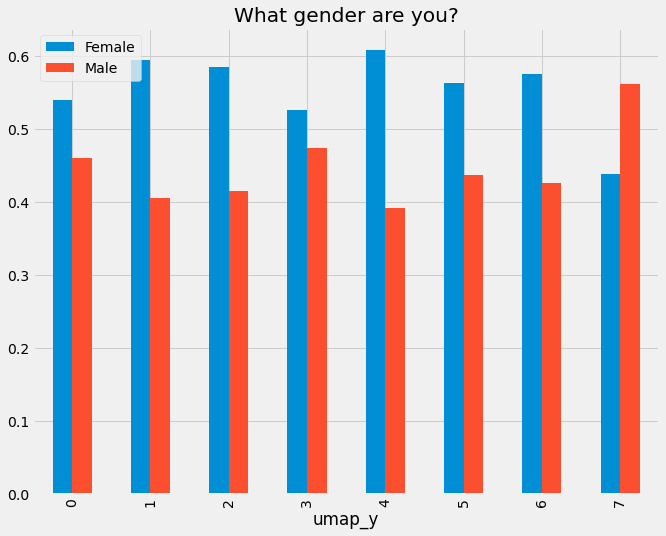

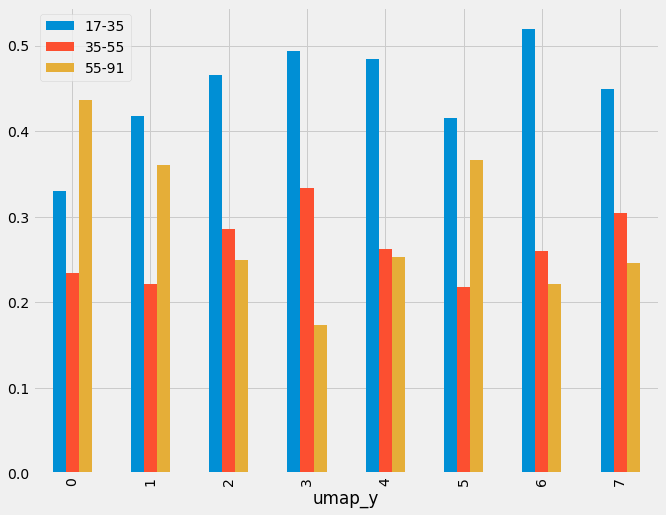

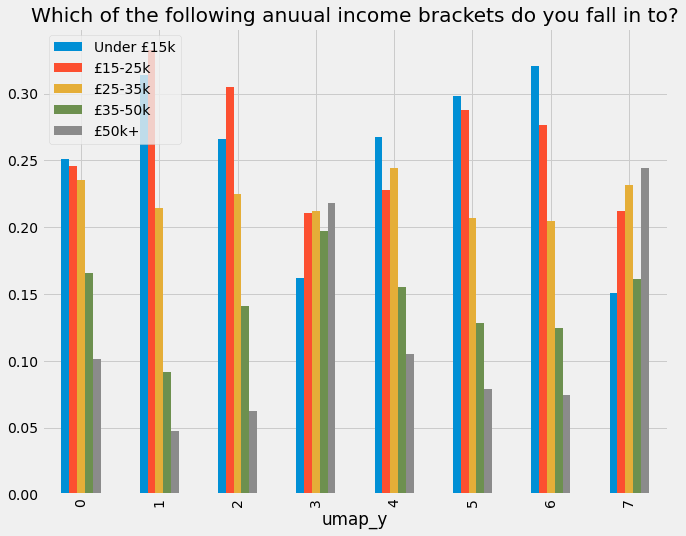

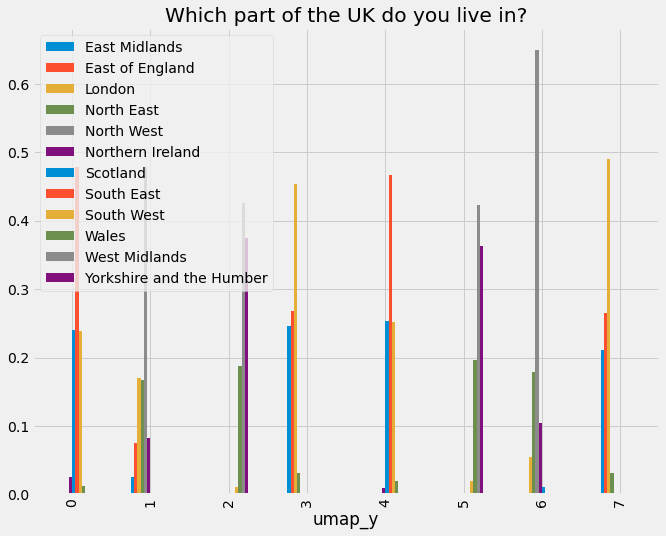

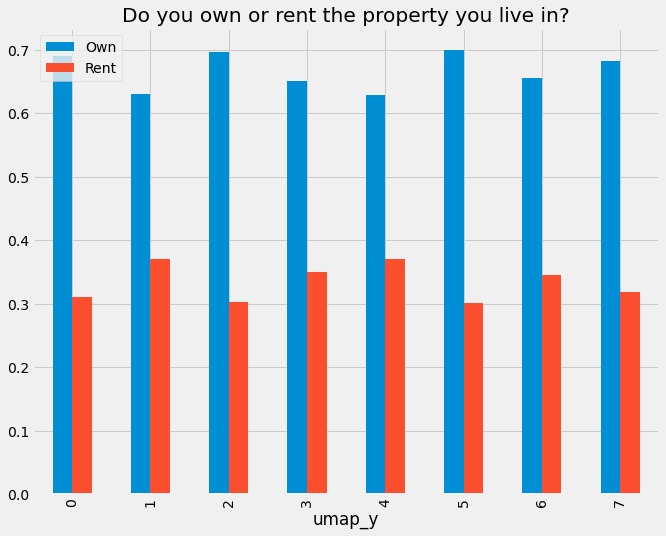

...

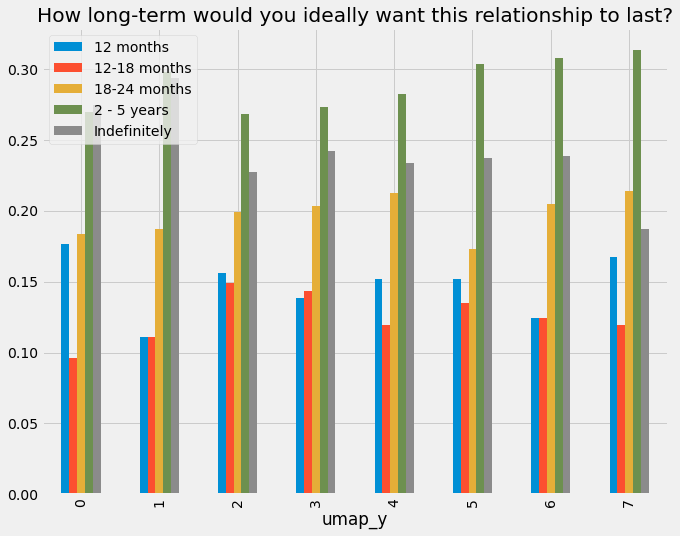

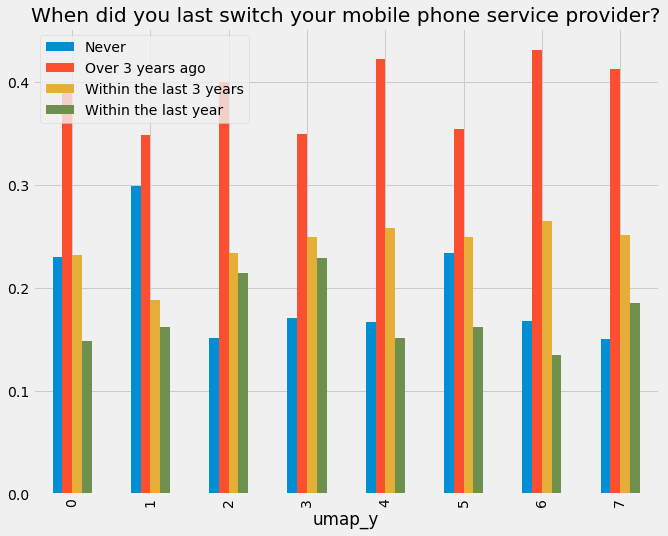

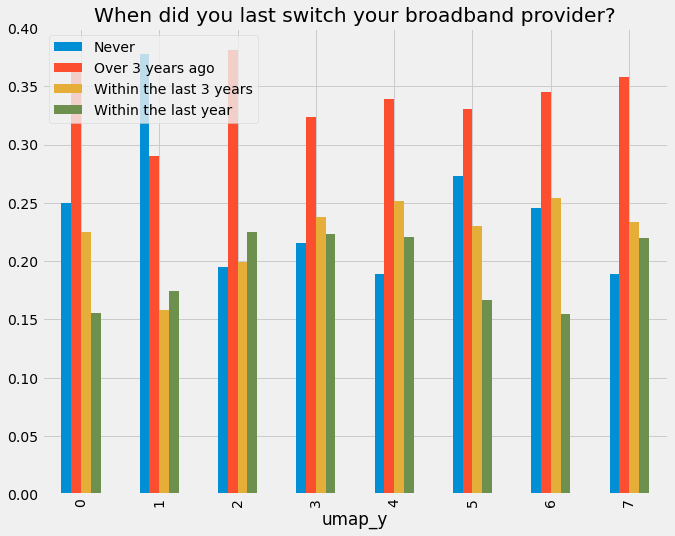

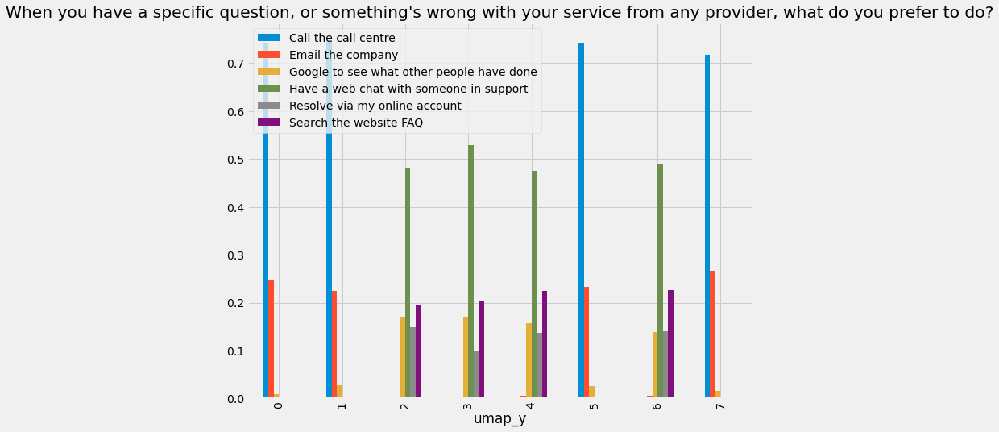

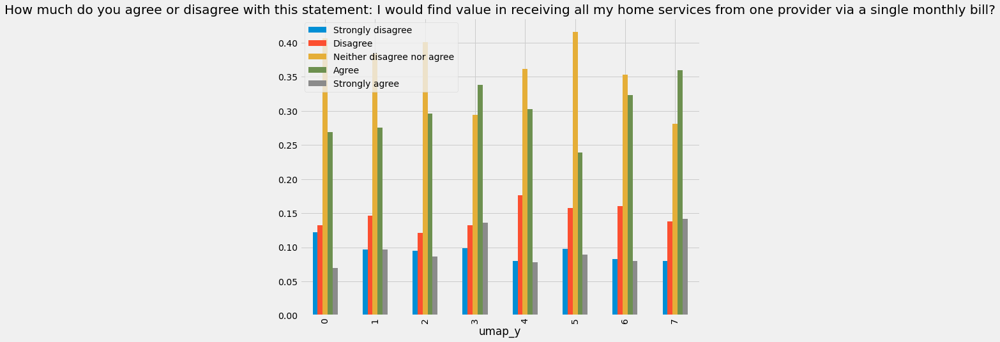

In [207]:
# The line that seperates upper and lower groups are based on how they'd like to contact when things went wrong,
# upper call the call center, lower web chat
# The middle line seperates two: location, left: london & North West, right: South East and West Midlands & Yorkshire
# The line seperates 3&7 and 1&6 : income level

# Group 3&7: wealthier(£50k+) and London based, 
# proportionaly more likely to live with 2 more children(none is most chosen choice),most agree with Q12 value proposition 
# 7 1): males>females(the only group), resort to call centers when it comes to problems
# 3: more people want the relationship to last forever compared to 7

# Group 1&6: more impoverished, live in North West & indifferent to Q12
# Group 6: Desite being indfferent but proportionally more people agree, largest proportion of 17-35
# Group 1: Most people never switches BB

# Group 1&0&5: Indifferent,call the call center, proportionally more never switch phone, 
# 55-91 more dominant,proportionaly want the r to last forever with group 0 the largest group of 55-91
# Across all age buckets, switch energy within last year

def get_feature_names(q):
    d=preprocessing.dict_df()
    return {d[k]:k for k in d}.get(q)

for q in columns:
    if q !='Q47':       
        f,ax=plt.subplots(figsize=(10,8))
        pd.crosstab(X_copy.umap_y,X_copy[q]).div(pd.crosstab(X_copy.umap_y,X_copy[q]).sum(axis=1),axis=0).plot(kind='bar',ax=ax)
        ax.set_title(get_feature_names(q))
        ax.legend(loc='upper left')
    else:        
        f,ax=plt.subplots(figsize=(10,8))
        pd.crosstab(X_copy.umap_y,X_copy[q]).div(pd.crosstab(X_copy.umap_y,X_copy[q]).sum(axis=1),axis=0)[['Strongly disagree','Disagree','Neither disagree nor agree','Agree','Strongly agree']].plot(kind='bar',ax=ax)
        ax.set_title(get_feature_names(q))
        ax.legend(loc='upper left')


In [279]:
pd.crosstab(X_copy.umap_y,X_copy['Q11']).div(pd.crosstab(X_copy.umap_y,X_copy['Q11']).sum(axis=1),axis=0)

Q11,Female,Male
umap_y,,
0,0.539267,0.460733
1,0.594340,0.405660
2,0.584416,0.415584
3,0.525890,0.474110
4,0.607843,0.392157
5,0.562900,0.437100
6,0.574586,0.425414
7,0.438938,0.561062


In [280]:
pd.crosstab(X_copy.umap_y,X_copy['Age_Band']).div(pd.crosstab(X_copy.umap_y,X_copy['Age_Band']).sum(axis=1),axis=0)

Age_Band,17-35,35-55,55-91
umap_y,,,
0,0.329843,0.233857,0.436300
1,0.417453,0.221698,0.360849
2,0.465368,0.285714,0.248918
3,0.493528,0.333333,0.173139
4,0.484848,0.262032,0.253119
5,0.415778,0.217484,0.366738
6,0.519337,0.259669,0.220994
7,0.449558,0.304425,0.246018


In [281]:
pd.crosstab(X_copy.umap_y,X_copy['Q13']).div(pd.crosstab(X_copy.umap_y,X_copy['Q13']).sum(axis=1),axis=0)

Q13,Under £15k,£15-25k,£25-35k,£35-50k,£50k+
umap_y,,,,,
0,0.251309,0.246073,0.235602,0.165794,0.101222
1,0.313679,0.332547,0.214623,0.091981,0.047170
2,0.266234,0.305195,0.225108,0.140693,0.062771
3,0.161812,0.210356,0.211974,0.197411,0.218447
4,0.267380,0.228164,0.244207,0.155080,0.105169
5,0.298507,0.287846,0.206823,0.127932,0.078891
6,0.320442,0.276243,0.204420,0.124309,0.074586
7,0.150442,0.212389,0.231858,0.161062,0.244248


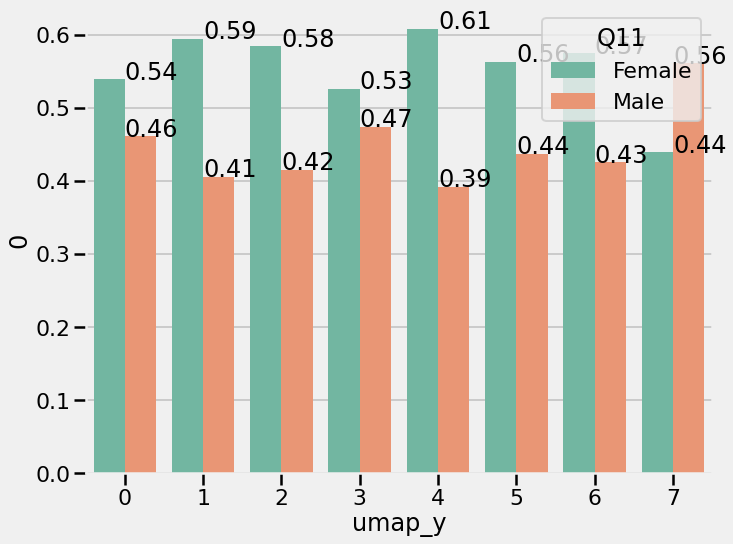

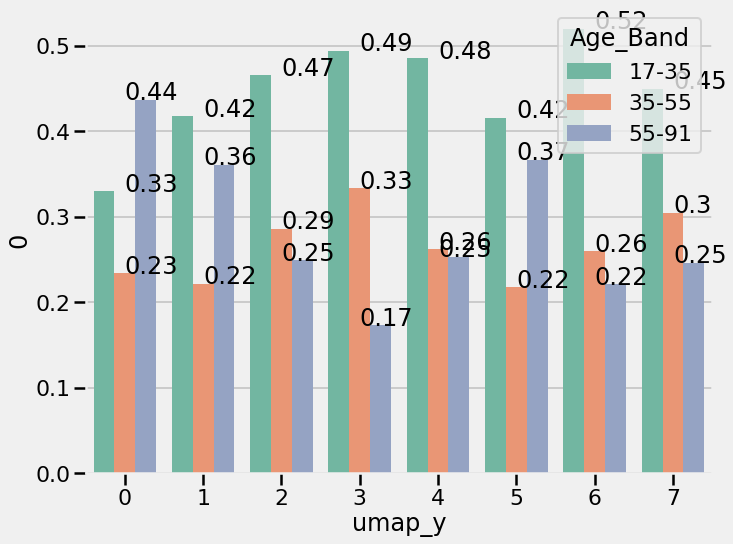

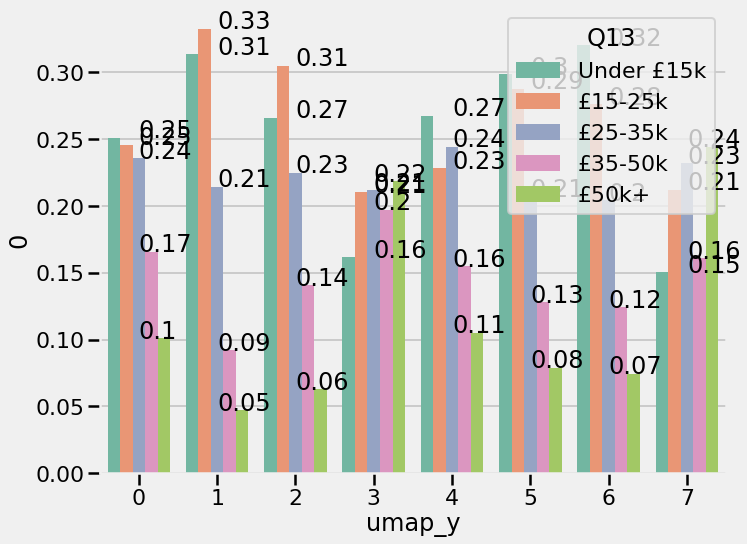

In [277]:
# demographics=['Q11','Age_Band', 'Q13']
# for q in demographics:
#     fig,ax=plt.subplots(figsize=(10,8))
#     tmp=pd.crosstab(X_copy.umap_y,X_copy[q]).div(pd.crosstab(X_copy.umap_y,X_copy[q]).sum(axis=1),axis=0).stack().reset_index()
# #     sns.barplot(tmp.umap_y,tmp[0],hue=tmp[q],palette='Set2')
    
#     for c,b in zip(tmp.umap_y,tmp[0]):
#         plt.text(c,b,str(round(b,2)))

## t-SNE Dimensionality Reduction

In [10]:
"""
Reduce high dimensional features vector to 2 dimensions

"""
tsne=TSNE(verbose=1,perplexity=50,random_state=42)

In [11]:
X_embedded=tsne.fit_transform(train_tsne)

[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 4034 samples in 0.096s...
[t-SNE] Computed neighbors for 4034 samples in 7.646s...
[t-SNE] Computed conditional probabilities for sample 1000 / 4034
[t-SNE] Computed conditional probabilities for sample 2000 / 4034
[t-SNE] Computed conditional probabilities for sample 3000 / 4034
[t-SNE] Computed conditional probabilities for sample 4000 / 4034
[t-SNE] Computed conditional probabilities for sample 4034 / 4034
[t-SNE] Mean sigma: 1.750082
[t-SNE] KL divergence after 250 iterations with early exaggeration: 77.502113
[t-SNE] KL divergence after 1000 iterations: 2.426030


In [12]:
distortions=[]
K=range(2,30)

In [13]:
for k in tqdm(K):
    """
    To find optimal k, we look at the distortion at different k values. Distortion computes 
    the sum of squared distances from each point to its centroid. We are looking for 
    a k value after which decreases in distortion are minimal
    
    """
    k_means=KMeans(n_clusters=k,random_state=42).fit(X_embedded)
    k_means.fit(X_embedded)
    distortions.append(sum(np.min(cdist(X_embedded,k_means.cluster_centers_,'euclidean'),axis=1))/train.shape[0])

100%|██████████| 28/28 [06:13<00:00, 13.35s/it]


Text(0.5, 1.0, 'The Elbow Curve of Optimal k')

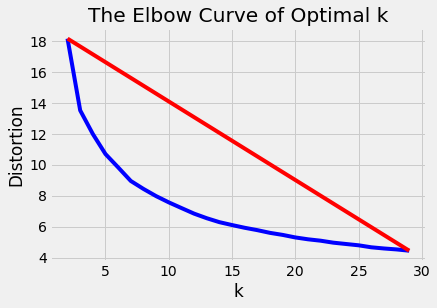

In [14]:
X_line=[K[0],K[-1]]
Y_line=[distortions[0],distortions[-1]]
plt.plot(K,distortions,'b-')
plt.plot(X_line,Y_line,'r')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Curve of Optimal k')    ## we will use k =10

In [15]:
k=2
kmeans=KMeans(n_clusters=k,random_state=42)
y_pred=kmeans.fit_predict(X_embedded)
df['y']=y_pred
tmp['y']=y_pred
clf_train=train.loc[:,['Q9','Q11','Q13','Q14','Q15','Q16','Q17','Q18','Age_Band']]

/opt/conda/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


Text(0.5, 1.0, 't_SNE with Kmeans Labels')

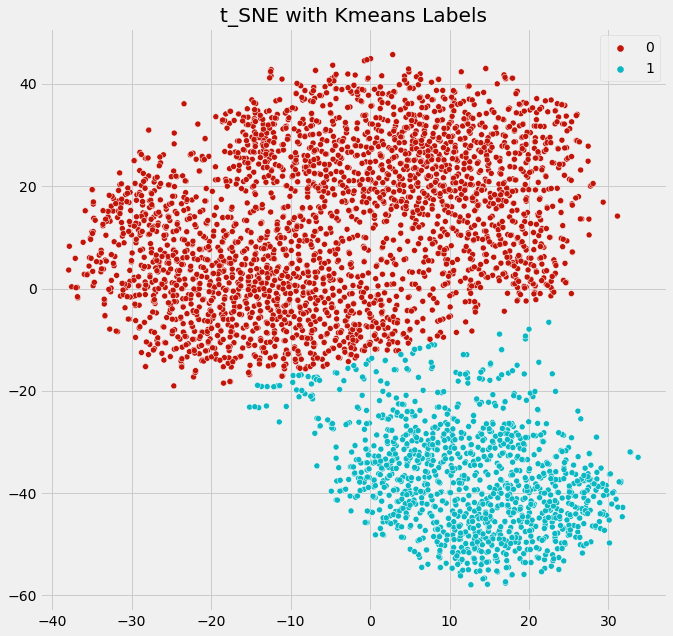

In [16]:
"""
t-SNE has grouped respodents forming a cluster, K-means is uniform in the labeling of the clusters
There are cases where the coloured labels (k-means) spread out on the plot(t-SNE), this is due to t-SNE and 
k-means finding different connections in the higher dimensional data( some respondents intersect)
These subclusters are a conglomeration of diffrent k-means labels 

The algos(clustering and dimentionality reduction) is performed on the mathematical similarities of the responds
"""
plt.figure(figsize=(10,10))  
sns.scatterplot(X_embedded[:,0],X_embedded[:,1],palette=sns.hls_palette(k, l=.4, s=.9),hue=y_pred).set_title('t_SNE with Kmeans Labels')

## UMAP

In [17]:
umap=umap.UMAP()

In [18]:
umap_embedding=umap.fit_transform(train_tsne)

In [19]:
k=2
kmeans=KMeans(n_clusters=k,random_state=42)
y_pred=kmeans.fit_predict(umap_embedding)
df['umap_y']=y_pred
tmp['umap_y']=y_pred

/opt/conda/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


Text(0.5, 1.0, 'UMAP with K-Means Labels')

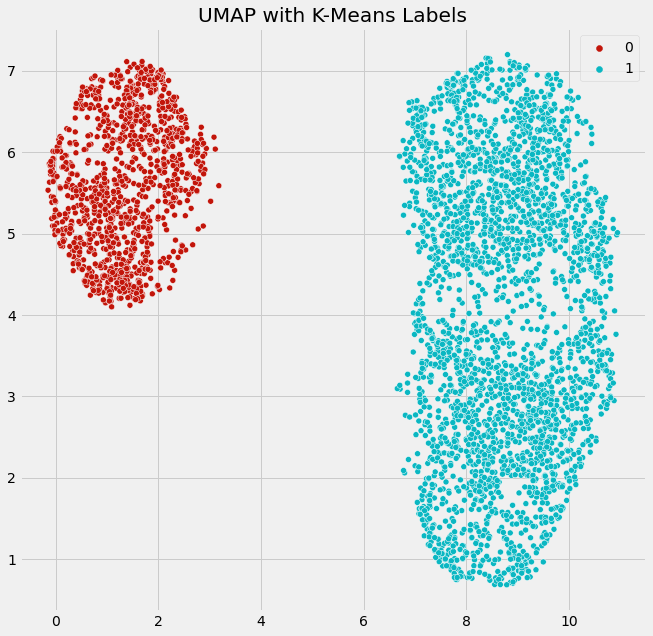

In [20]:
plt.figure(figsize=(10,10))  
sns.scatterplot(umap_embedding[:,0],umap_embedding[:,1],palette=sns.hls_palette(k, l=.4, s=.9),hue=y_pred).set_title('UMAP with K-Means Labels')

## Topic on Each Cluster

In [21]:
def check_cluster(df):
    df=train_columns(['Q0', 'Q1','Q2','Q3','Q4','Q10'])
    clusters=[]
    for i in range(0,10):
        c = df[df.y==i].mode()[0:1]
        clusters.append(c)
    clusters=pd.concat(clusters)
    return clusters

In [22]:
clusters=check_cluster(df)

In [23]:
clusters

,Q9,Q11,Q13,Q14,Q15,Q16,Q17,Q18,Q19,Q20,Q21,Q22,Q23,Q24,Q25,Q26,Q27,Q28,Q29,Q30,Q31,Q32,Q33,Q34,Q35,Q36,Q37,Q38,Q39,Q40,Q41,Q42,Q43,Q44,Q45,Q46,Q47,Q48,Q49,Q50,Q51,Q52,Q53,Q54,Q55,Q56,Q57,Q58,Q59,Q60,Q61,Q62,Q63,Q64,Q65,Q66,Q67,Q68,Q69,Q70,Q71,Q72,Q73,Q74,Q75,Q76,Q77,Q78,Q79,Q80,Q81,Q82,Q83,Q84,Q85,Q86,Q87,Q88,Q89,Q90,Q91,Q92,Q93,Q94,Q95,Q96,Q97,Q98,Q99,Q100,Q101,Q102,Q103,Q104,Q105,Q106,Q107,Q108,Q109,Q110,Q111,Q112,Q113,Q114,Q115,Q116,Q117,Q118,Q119,Q120,Q121,Q122,Q123,Q124,Q125,Q126,Q127,Q128,Q129,Age_Band,y,umap_y
0,Yes,Female,£15-25k,London,Own,Gas,2,None,A home phone attached to the landline,A fibre internet connection,A smart phone,Satellite or Cable TV,Netflix (or other streaming TV services),0,0,0,0,0,Home Insurance,Contents Insurance,Car Insurance,0,0,Energy,Water,0,Home Phone,Internet connection,0,Satellite or Cable TV,0,Home and/or contents insurance,0,0,0,0,Agree,0,0,0,0,Easier to see what I'm paying each month,0,0,0,It may be harder to tell if I'm paying a compe...,0,0,0,0,0,0,Within the last year,0,0,0,0,0,0,0,Agree,2 - 5 years,Neither disagree nor agree,Agree,0,0,Guaranteed fair pricing so I had to worry abou...,0,0,0,0,0,Over 3 years ago,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Over 3 years ago,0,0,0,0,0,0,0,0,0,0,Strongly agree,Agree,Agree,0,Guaranteed fair pricing so I had to worry abou...,The strongest wifi signal possible throughout ...,0,0,0,0,0,0,Guarantee that no claim means no price hike,0,0,Agree,Call the call centre,17-35,0,1
0,Yes,Female,£15-25k,London,Own,Gas,2,None,A home phone attached to the landline,A fibre internet connection,A smart phone,0,Netflix (or other streaming TV services),0,0,0,0,0,Home Insurance,Contents Insurance,Car Insurance,0,0,Energy,Water,0,Home Phone,Internet connection,0,0,0,0,0,0,0,0,Neither disagree nor agree,0,0,0,0,0,0,0,0,It may be harder to tell if I'm paying a compe...,0,0,0,0,0,0,Within the last year,0,0,0,0,0,0,0,Neither agree nor disagree,12 months,Neither disagree nor agree,Neither disagree nor agree,0,0,Guaranteed fair pricing so I had to worry abou...,0,0,0,0,0,Over 3 years ago,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Over 3 years ago,0,0,0,0,0,0,0,0,0,0,Strongly agree,Agree,Agree,0,0,The strongest wifi signal possible throughout ...,0,0,0,0,0,0,0,0,0,Neither disagree nor agree,Call the call centre,17-35,1,0


In [ ]:
result=np.where((X_embedded>40))
list(zip(result[0],result[1]))

In [133]:
## Identify the highest point for the coordinate
np.sort(X_embedded)[::-1]
np.where(X_embedded== 47.587925)
df.iloc[result[0],:]

,Q0,Q1,Q2,Q3,Q4,Q9,Q10,Q11,Q13,Q14,Q15,Q16,Q17,Q18,Q19,Q20,Q21,Q22,Q23,Q24,Q25,Q26,Q27,Q28,Q29,Q30,Q31,Q32,Q33,Q34,Q35,Q36,Q37,Q38,Q39,Q40,Q41,Q42,Q43,Q44,Q45,Q46,Q47,Q48,Q49,Q50,Q51,Q52,Q53,Q54,Q55,Q56,Q57,Q58,Q59,Q60,Q61,Q62,Q63,Q64,Q65,Q66,Q67,Q68,Q69,Q70,Q71,Q72,Q73,Q74,Q75,Q76,Q77,Q78,Q79,Q80,Q81,Q82,Q83,Q84,Q85,Q86,Q87,Q88,Q89,Q90,Q91,Q92,Q93,Q94,Q95,Q96,Q97,Q98,Q99,Q100,Q101,Q102,Q103,Q104,Q105,Q106,Q107,Q108,Q109,Q110,Q111,Q112,Q113,Q114,Q115,Q116,Q117,Q118,Q119,Q120,Q121,Q122,Q123,Q124,Q125,Q126,Q127,Q128,Q129,Age_Band,y
118,12140480129,395175561,5/11/20 11:07,5/11/20 11:12,31.132.7.4,Yes,35,Male,£50k+,London,Own,Electric,4,2,A home phone attached to the landline,A fibre internet connection,A smart phone,Satellite or Cable TV,Netflix (or other streaming TV services),Long term savings and investments (not includi...,Home Security and Alarm Systems,A Thermostat I can control from my phone,0,0,Home Insurance,0,Car Insurance,A regular home food delivery,0,Energy,Water,Council Tax,Home Phone,Internet connection,Mobile Phone,Satellite or Cable TV,Netflix (or other streaming TV services),Home and/or contents insurance,Boiler Insurance,Car Insurance,Savings and Investment services,Online grocery delivery service,Strongly agree,0,I would find value in the long term certainty ...,One app or website to use,I like the idea of having everything taken car...,0,0,0,0,0,0,0,0,0,0,None of the above / Other,Within the last 3 years,0,0,0,0,0,0,I was moving house,Strongly agree,Indefinitely,Strongly disagree,Strongly agree,The best customer support in the UK,Greener energy,0,0,A smart thermostat that helped me save energy ...,0,0,0,Within the last 3 years,0,0,0,I wanted more data,I wanted to upgrade my phone,0,0,0,0,Better signal coverage where I live,The best customer support in the UK,0,0,0,Warning notifications before I exceed and limi...,0,0,0,Within the last year,0,0,I wanted faster speeds,0,0,0,I wanted a better router,0,0,0,Strongly agree,Agree,Strongly agree,The best customer support in the UK,Guaranteed fair pricing so I had to worry abou...,0,A backup connection that guaranteed no interne...,0,0,0,Guaranteed fair pricing so I had to worry abou...,Simple and easy to understand guide to what is...,0,No worries that I would be caught out by a tec...,0,Strongly disagree,Call the call centre,17-35,8
131,12140384978,395175561,5/11/20 10:21,5/11/20 10:24,109.230.215.87,Yes,44,Male,£50k+,London,Own,Gas,5 or more,3,A home phone attached to the landline,0,A smart phone,Satellite or Cable TV,Netflix (or other streaming TV services),0,Home Security and Alarm Systems,A Thermostat I can control from my phone,0,0,Home Insurance,0,Car Insurance,A regular home food delivery,0,Energy,Water,0,Home Phone,Internet connection,Mobile Phone,Satellite or Cable TV,Netflix (or other streaming TV services),Home and/or contents insurance,0,Car Insurance,Savings and Investment services,Online grocery delivery service,Agree,0,I would find value in the long term certainty ...,0,0,Easier to see what I'm paying each month,0,0,0,0,0,0,0,0,I like some of my current services and wouldn'...,0,Within the last 3 years,0,0,0,Poor customer support experience,0,I wanted greener energy,0,Agree,18-24 months,Disagree,Strongly agree,The best customer support in the UK,0,0,0,A smart thermostat that helped me save energy ...,0,"Clearer, easier to understand bills",0,Within the last 3 years,I came out of a fixed tariff contract and was ...,0,0,I wanted more data,0,0,0,0,0,Better signal coverage where I live,The best customer support in the UK,0,Family plans with shared or unlimited data and...,0,0,0,0,0,Within the last 3 years,I was actively looking for a cheaper deal online,0,0,0,0,0,I wanted a better router,0,0,0,Neither disagree nor agree,Agree,Agree,The best customer support in the UK,Guaranteed fair pricing so I had to worry abou...,0,0,Easy to use child protection features,0,0,0,0,Guarantee that no claim means no price hike,0,0,Disagree,Call the call centre,35-55,8
142,1

## Classify

In [160]:
"""
Test how well the clustering generalizes to evaluate the algos. If K-means was able to find a meaningful split,
it should be able to train a classifier to predict which cluster a given instance belongs to
M
"""

def classification_report(model_name,test,pred):
    from sklearn.metrics import precision_score,recall_score
    from sklearn.metrics import accuracy_score
    from sklearn.metrics import f1_score
    print(model_name)
    print(f'Accuracy score: {float(accuracy_score(test,pred))*100} %' )
    print("Precision:{:,.3f}".format(float(precision_score(test,pred,average='macro'))*100 ),"%" )
    print("Recall:{:,.3f}".format(float(recall_score(test,pred,average='macro'))*100),"%")
    print('F1 score:{:,.3f}'.format(float(f1_score(test,pred,average='macro'))*100),'%')

In [602]:
X_train,X_test,y_train,y_test=train_test_split(clf_train,y_pred,test_size=0.2,random_state=42)

In [603]:
sgd_clf=SGDClassifier(loss='perceptron',max_iter=200000,random_state=42, n_jobs=-1)

In [604]:
sgd_clf.fit(X_train,y_train)

SGDClassifier(loss='perceptron', max_iter=200000, n_jobs=-1, random_state=42)

In [605]:
sgd_pred=cross_val_predict(sgd_clf,X_train,y_train,cv=3,n_jobs=4)

In [606]:
classification_report('SGD Report (Training Set)',y_train,sgd_pred)

SGD Report (Training Set)
Accuracy score: 35.01704369383328 %
Precision:34.473 %
Recall:33.760 %
F1 score:29.733 %


In [189]:
sgd_pred=cross_val_predict(sgd_clf,X_test,y_test,cv=3,n_jobs=4)

In [190]:
classification_report('SGD Report (Test Set)',y_test,sgd_pred)

SGD Report (Test Set)
Accuracy score: 54.0272614622057 %
Precision:50.490 %
Recall:50.590 %
F1 score:49.485 %


In [139]:
sgd_cv_score=cross_val_score(sgd_clf,clf_train,y_pred,cv=10)
print('Mean cv Score - SGD:{:,.3f}'.format(sgd_cv_score.mean()*100 ),'%')

Mean cv Score - SGD:35.423 %


In [11]:
"""
https://www.kaggle.com/maksimeren/covid-19-literature-clustering
"""
def rename_columns(df, new_names_list):
    
    """https://towardsdatascience.com/cleaning-analyzing-and-visualizing-survey-data-in-python-42747a13c713
    https://www.kaggle.com/colinmorris/visualizing-embeddings-with-t-sne
    https://www.kaggle.com/tanetboss/user-clustering-for-anime-recommendation
    
    """
    
    rename_dict = dict(zip(df.columns, new_names_list))
    df = df.rename(mapper=rename_dict, axis=1)
    
    return df
new_name_list=codebook[~(codebook.Options.str.contains('Unnamed')|(codebook.Options.str.contains('Response') ))].Options.values
dict(zip(df.loc[:,df.columns.str.contains('Unnamed')],new_name_list))

{}

In [413]:
def prepare_table(data, column_range, group_column_name):
    res = []
    col_range_index = list(column_range)
    group_index = data.columns.to_list().index(group_column_name)
    col_range_index.append(group_index)
    series = data.iloc[:, col_range_index].groupby(
      [group_column_name]).count().unstack()

    for group in series.index.levels[1]:
        for var in series.index.levels[0]:
            res.append(
                [
                    (series[var][group] / data[
                     group_column_name].value_counts()[group] * 100).round(2),
                    codebook.iloc[int(var[1:]), 1],
                    group,
                ]
            )

    return pd.DataFrame(columns=["percentage(%)", "options", 
                                 group_column_name], data=res)

# Generate the checkbox chart based on the summary table
def gen_chart_checkbox(data, column_range, group_column_name):
    listOfGroup = list(data.loc[:,group_column_name].unique())
    if listOfGroup ==['Disagree','Agree','Neither disagree nor agree','Strongly disagree','Strongly agree']:
        listOfGroup = ['Strongly disagree','Disagree','Neither disagree nor agree','Agree','Strongly agree']
    else:
        listOfGroup=sorted(listOfGroup)
    table_sum = prepare_table(data, column_range, group_column_name)
    print("Number of answers in each group: ")
    print(data.loc[:,group_column_name].value_counts())

    fig, ax = plt.subplots(figsize=(8, 6))
    ax = sns.barplot(
        x="percentage(%)",
        y="options",
        hue=group_column_name,
        hue_order=listOfGroup,
        data=table_sum,
    )

    ax.set(xlim=(0, 100))
    ax.set_ylabel("")
    plt.title(codebook.iloc[column_range[0], 0], fontsize=15)
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, 
               borderaxespad=0.0)
    return plt.show()

In [298]:
def plot_multiple_choices(df,group_name,column_name):
    d=((df.groupby([group_name])[column_name].value_counts(normalize=True)*100).rename('percentage(%)').reset_index()).round(2)
    listofGroup=sorted(df[group_name].unique())
    fig,ax=plt.subplots(figsize=(8,6))
    fig=sns.barplot(x='percentage(%)',y=column_name,hue=group_name,hue_order=listofGroup,data=d)
    plt.title(codebook.iloc[int(column_name[1:]),0])
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0)
    ax.set(xlim=(0,100))
    ax.set_ylabel('')
    return plt.show()

In [429]:
def gen_chart_radiobutton(data, question_name, index, group_column_name):
    print("Number of answers in each group: ")
    print(data[[question_name, group_column_name]].groupby(group_column_name).count())
    i_counts =data.groupby([group_column_name])[question_name].value_counts(normalize=True).rename("percentage(%)").mul(100).reset_index().round(2)
    

    listOfGroup = list(data.loc[:,group_column_name].unique())
    if listOfGroup ==['Disagree','Agree','Neither disagree nor agree','Strongly disagree','Strongly agree']:
        listOfGroup = ['Strongly disagree','Disagree','Neither disagree nor agree','Agree','Strongly agree']
    else:
        listOfGroup=sorted(listOfGroup)

    fig, ax = plt.subplots(figsize=(10, 8))

    fig = sns.barplot(
        x='percentage(%)',
        y=question_name,
        order=index,
        hue=group_column_name,
        hue_order=listOfGroup,
        data=i_counts,
    )

    plt.title(codebook.iloc[int(question_name[1:]), 0])
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0)
    ax.set(xlim=(0, 100))
    ax.set_ylabel("")
    return plt.show()

In [19]:
bar_columns=['Q9','Q11','Q13','Q14','Q15','Q16','Q17','Q18','Q63','Q72','Q83','Q102','Q129']
def plot_bar(columns,y):
    def what_question(q):
        d = preprocessing.dict_df()
        return {d[k]: k for k in d}.get(q)
    for q in columns:
        fig, ax =plt.subplots(figsize=(8,6))
        ax.set_title(what_question(q))
        questions=pd.crosstab(df[y],df[q])
        (questions.div(questions.sum(axis=1),axis=0)*100).plot(kind='bar',ax=ax)
        

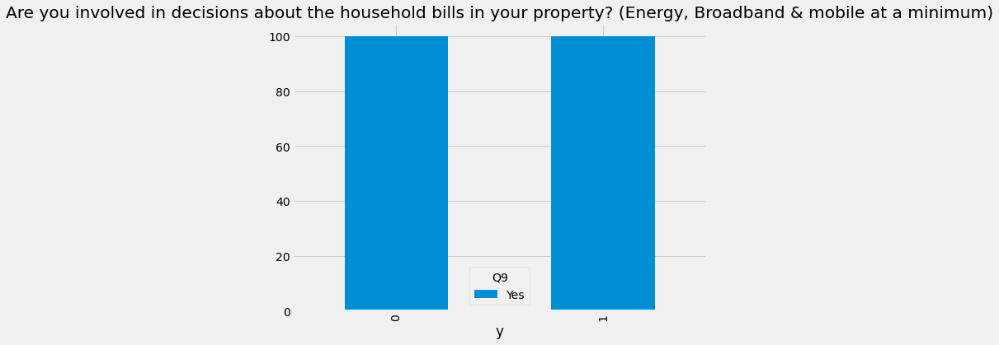

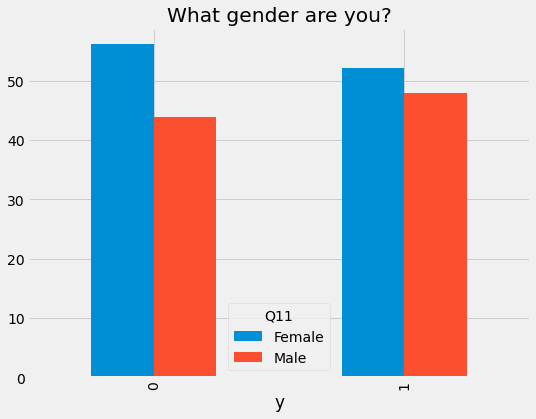

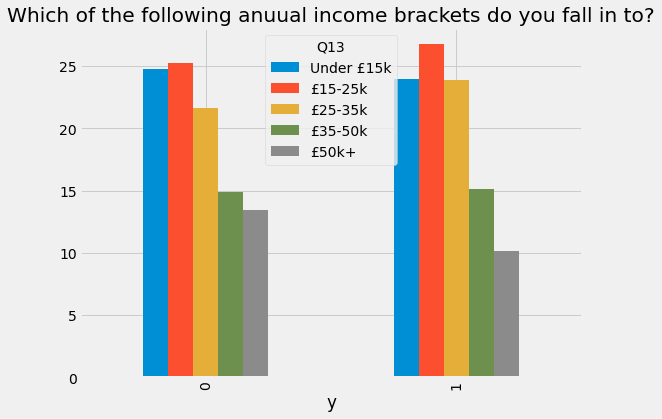

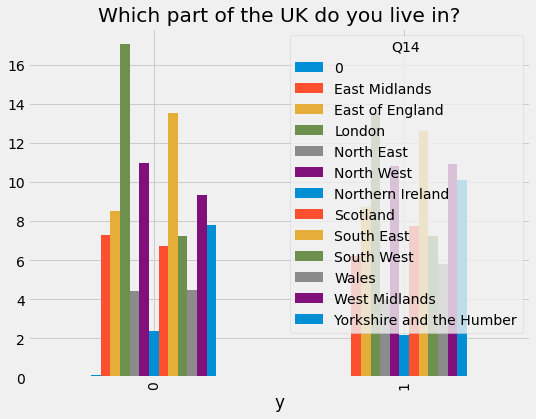

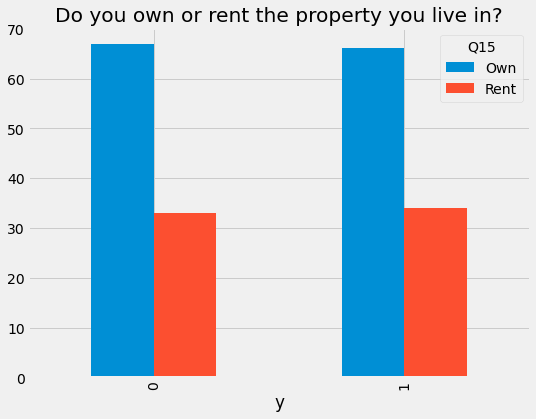

...

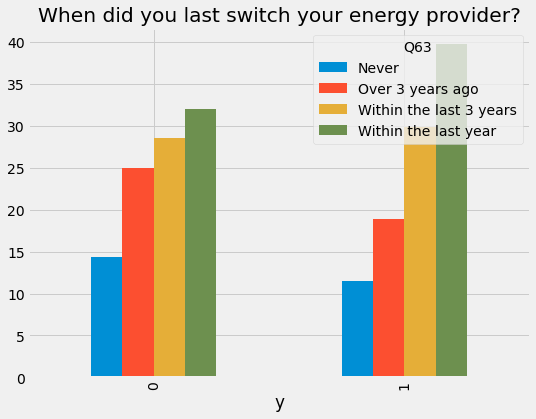

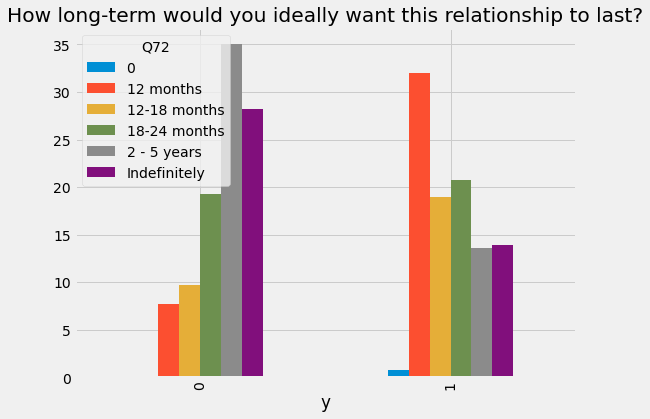

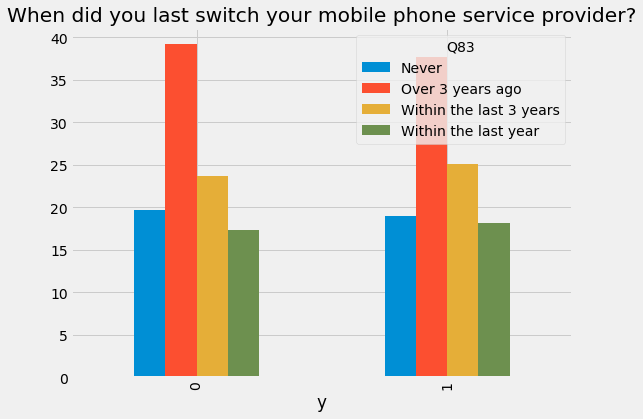

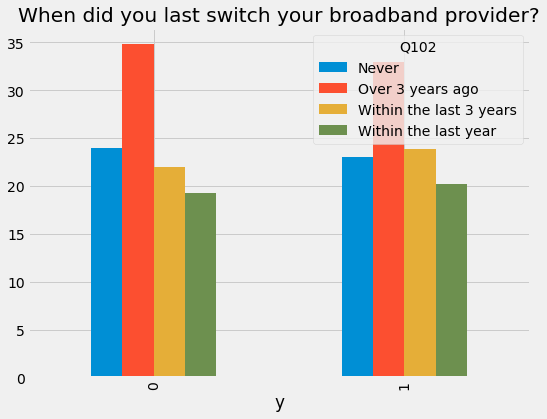

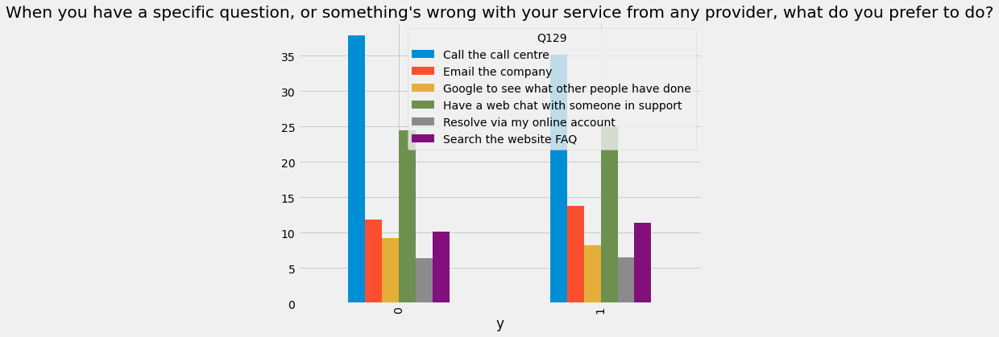

In [29]:
plot_bar(bar_columns,'y')

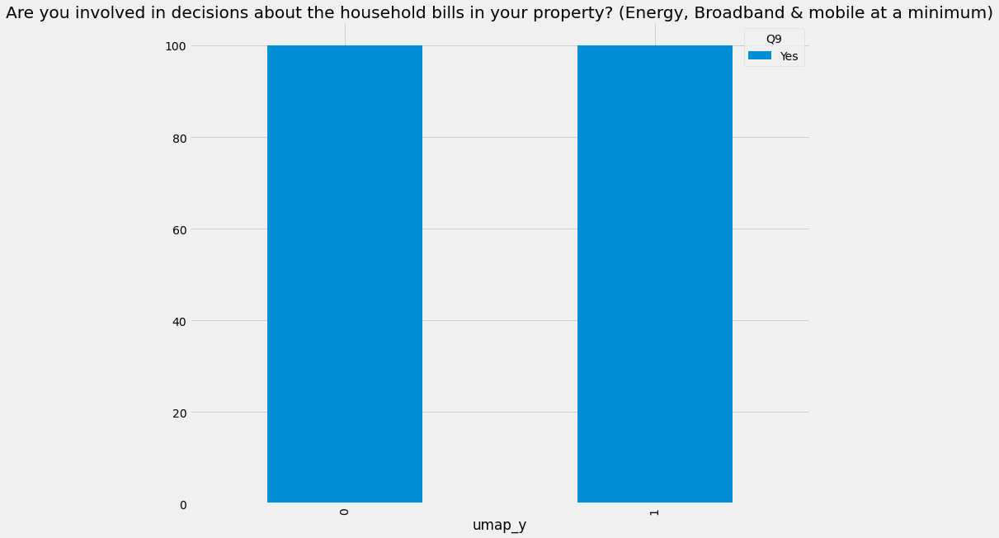

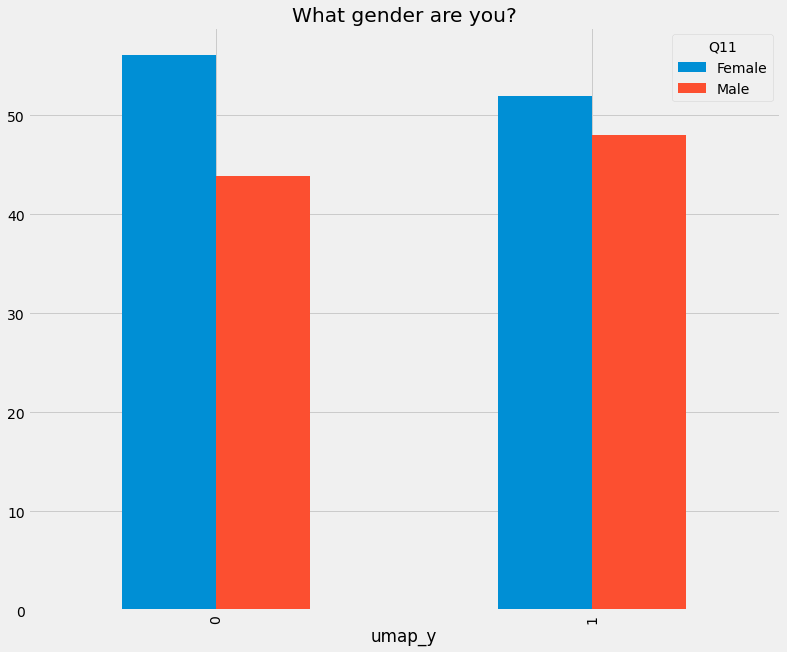

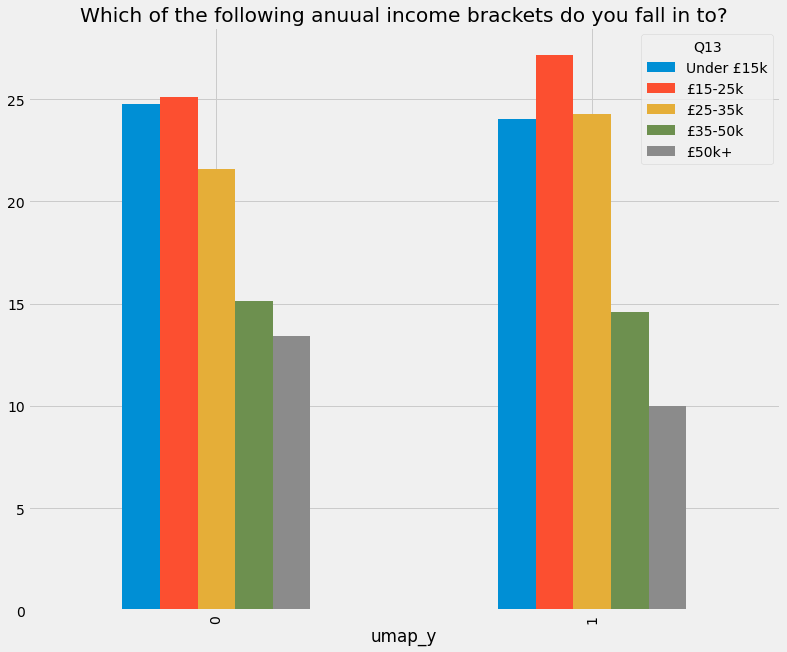

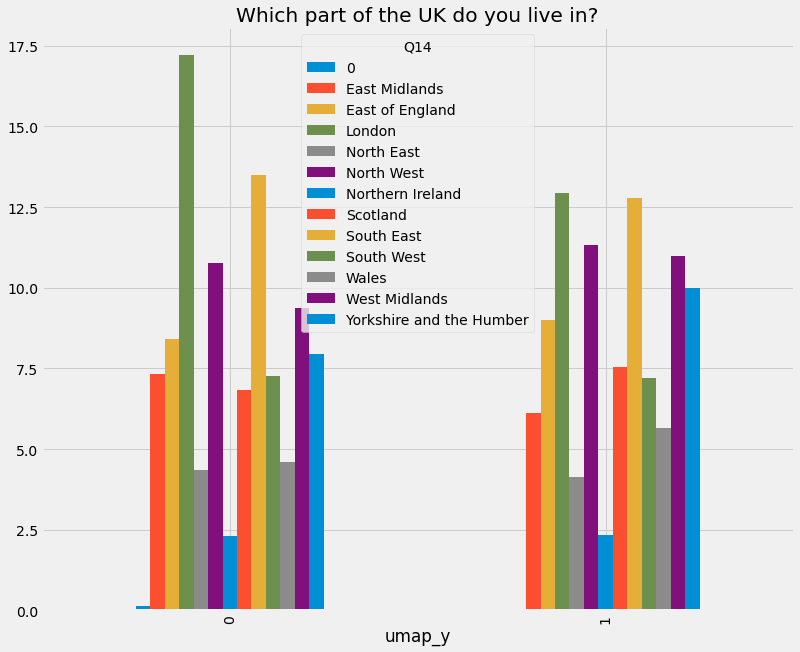

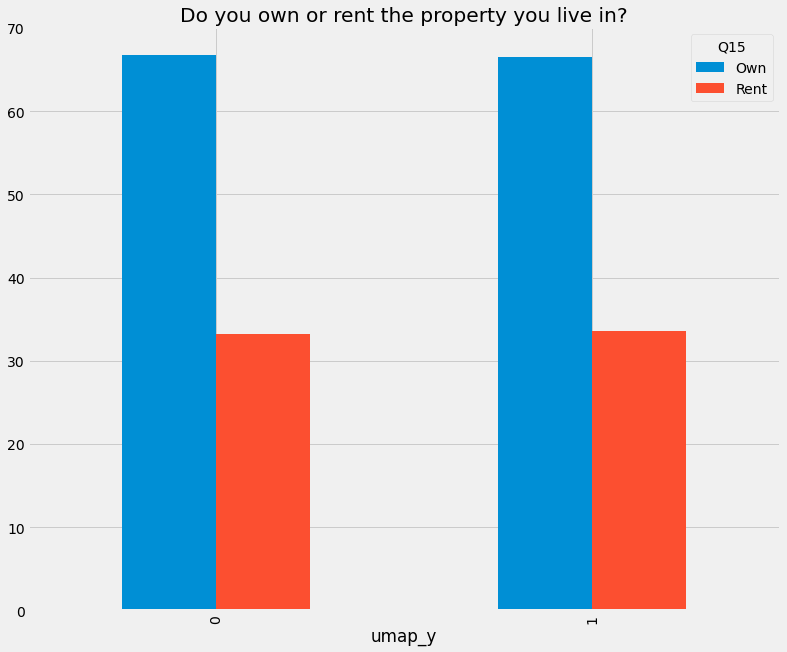

...

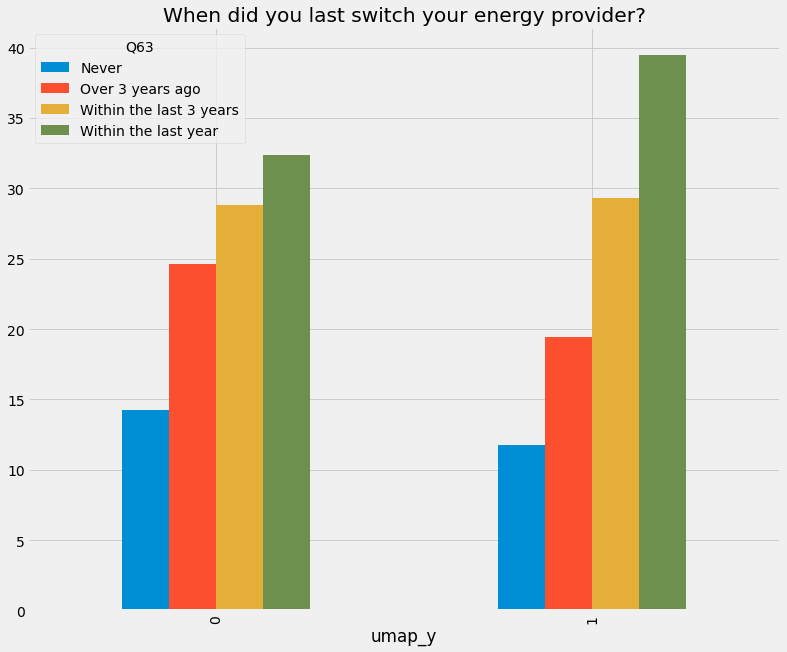

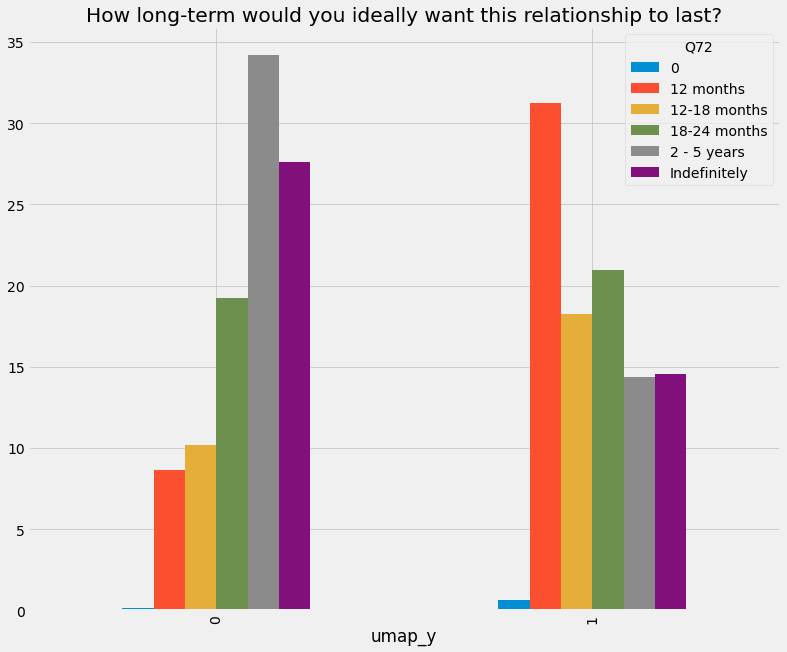

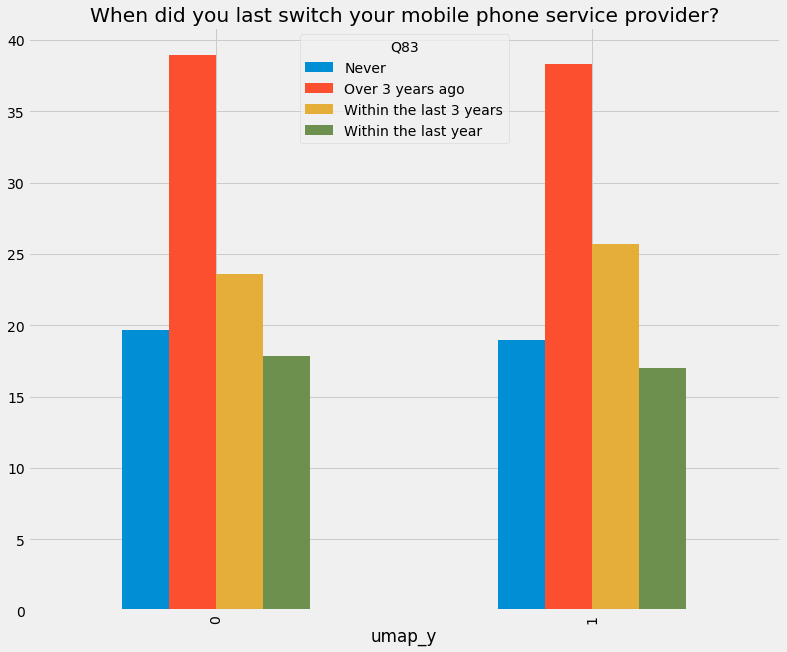

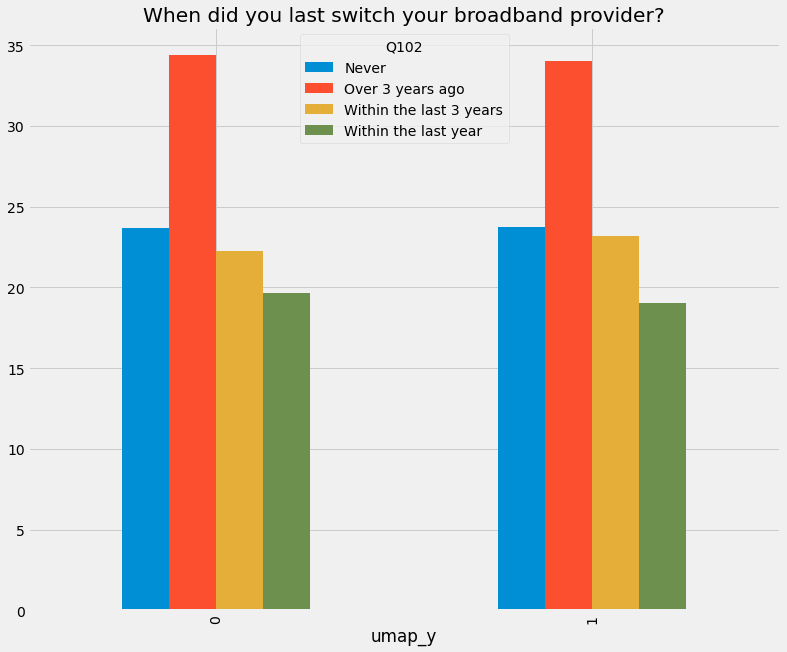

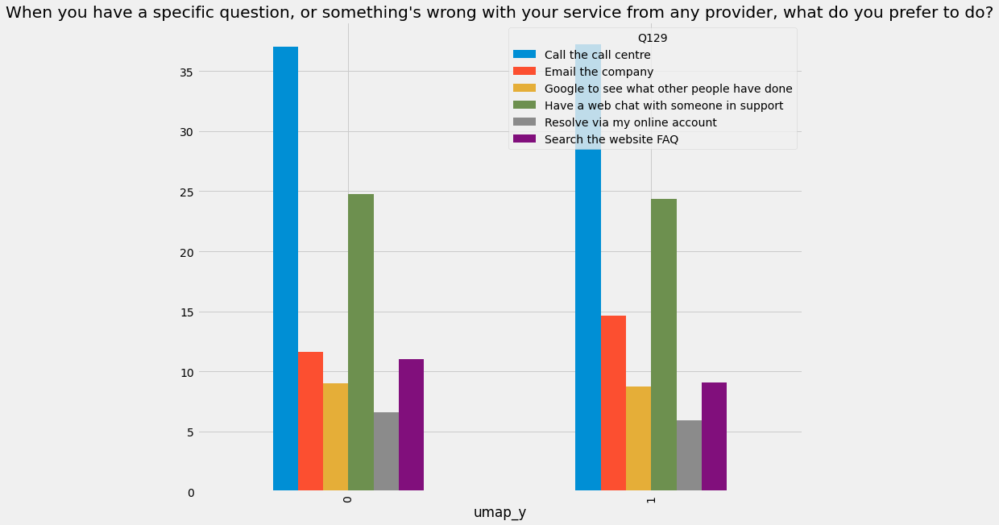

In [612]:
plot_bar(bar_columns,'umap_y')

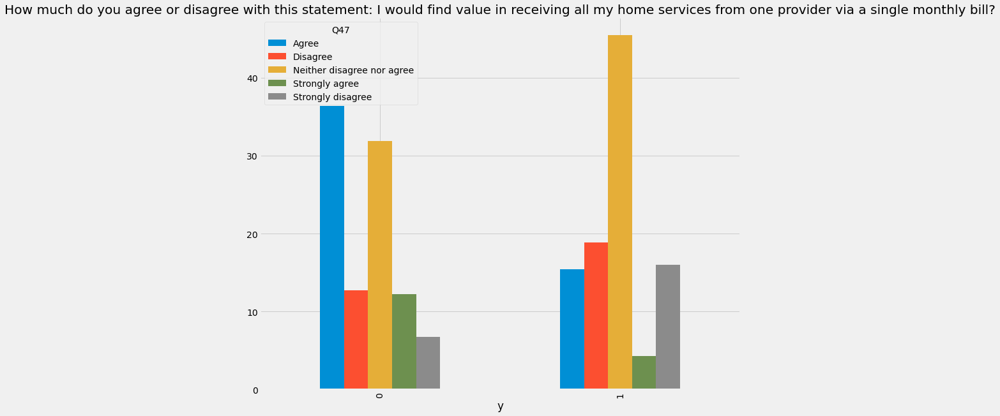

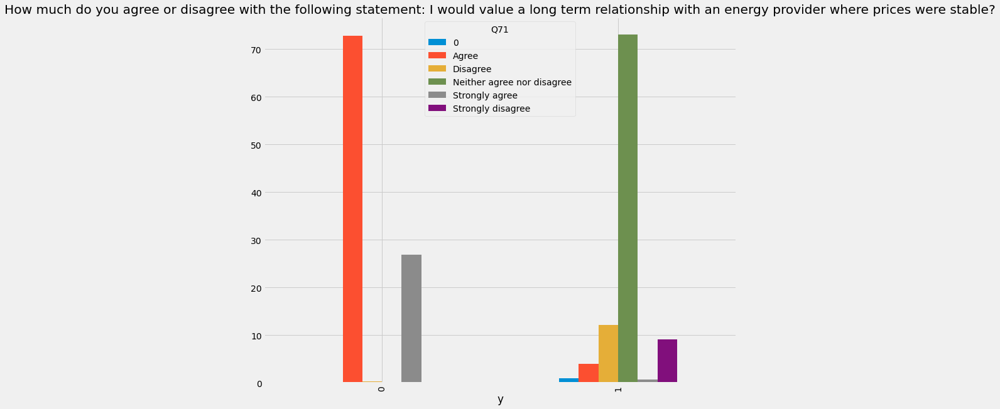

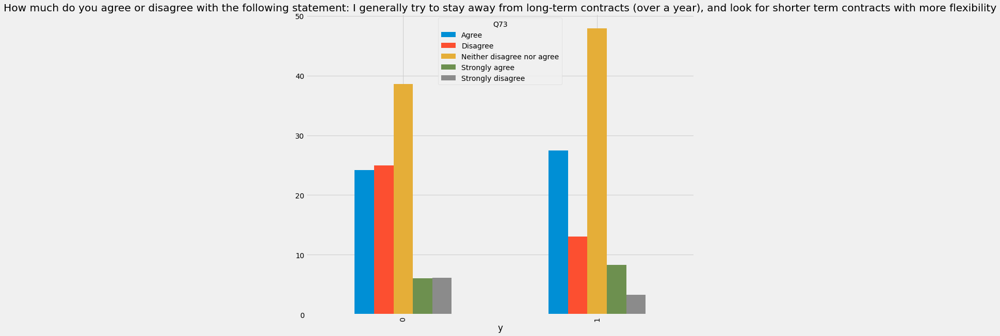

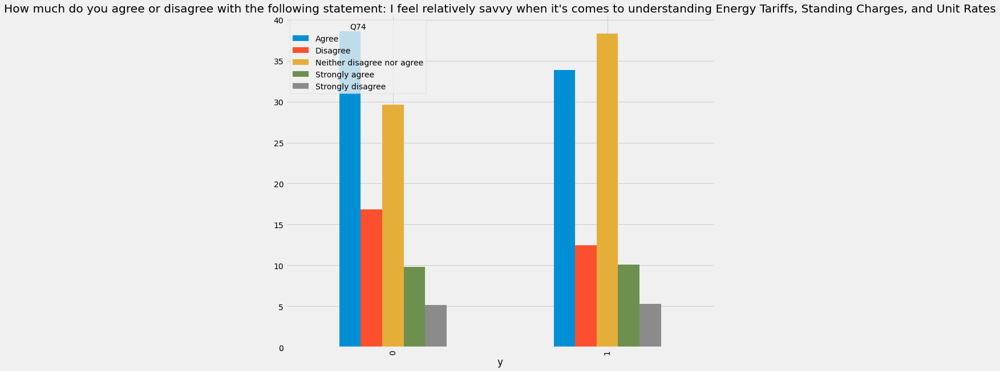

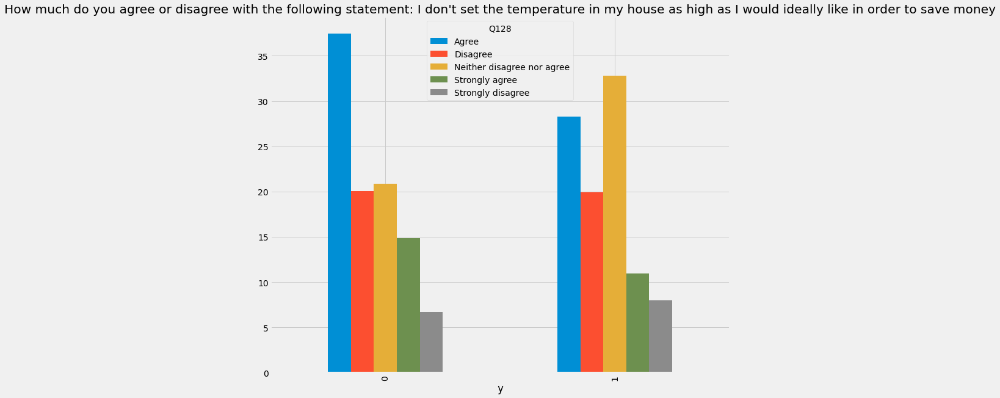

In [586]:
radiobutton_list=['Q47','Q71','Q73','Q74','Q128']
plot_bar(radiobutton_list,'y')

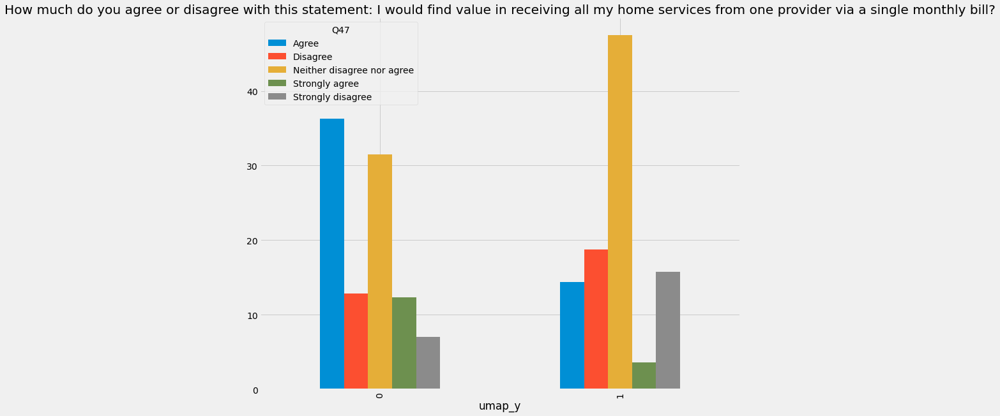

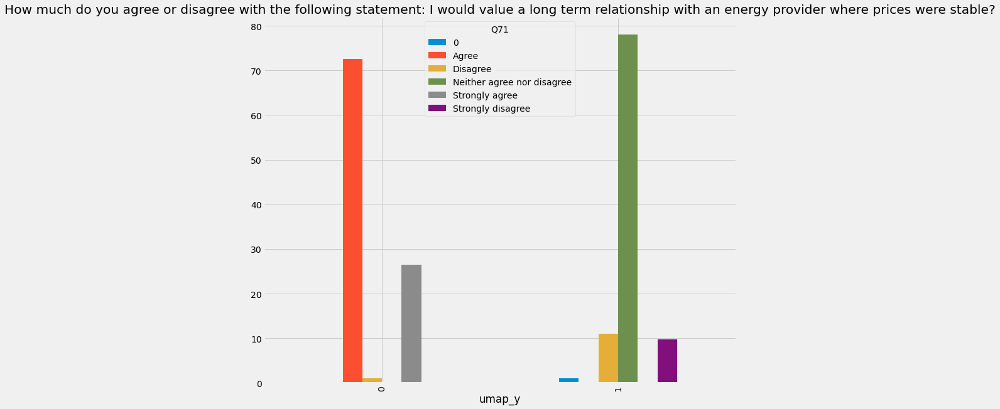

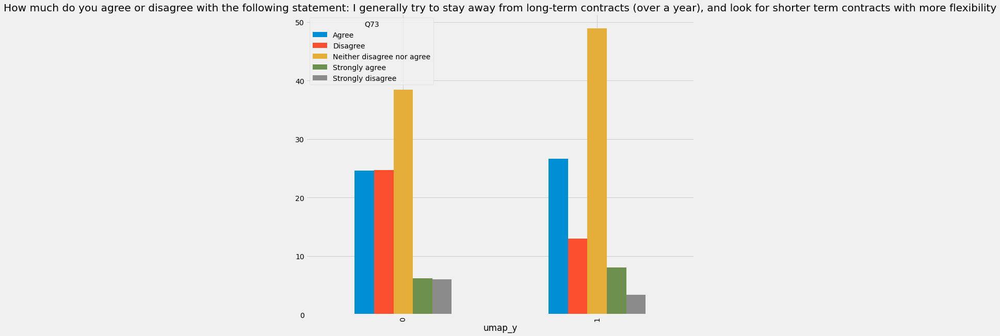

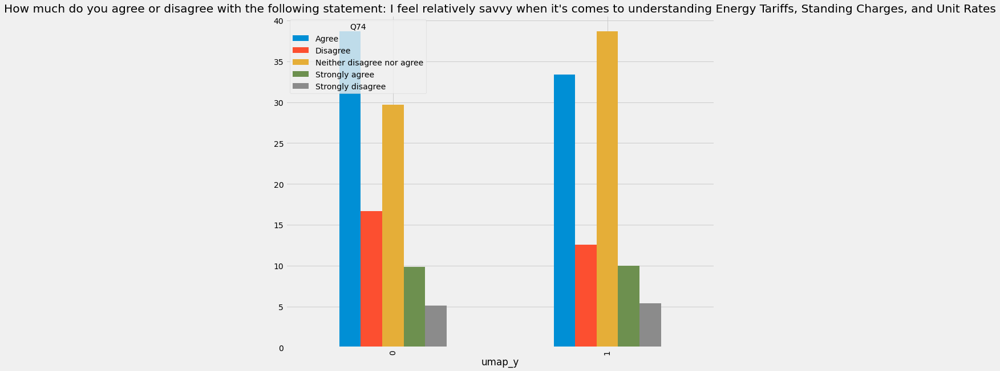

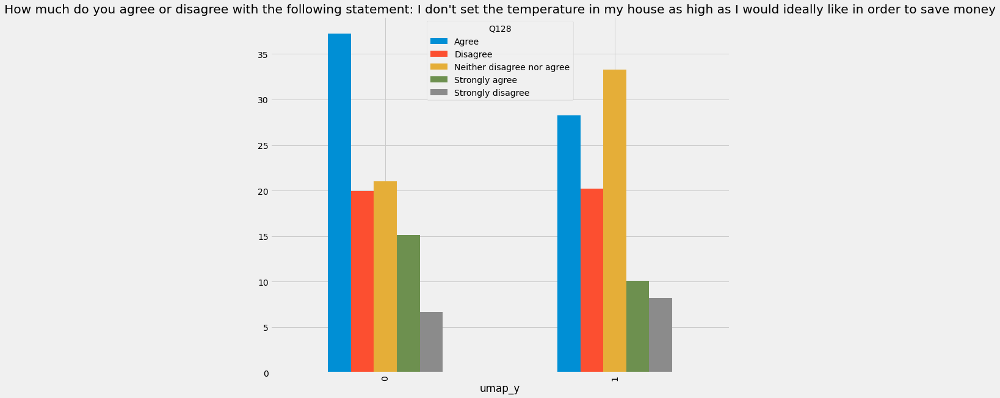

In [613]:
radiobutton_list=['Q47','Q71','Q73','Q74','Q128']
plot_bar(radiobutton_list,'umap_y')

In [ ]:
# radiobutton_list=['Q47','Q71','Q73','Q74','Q128']
# index=['Strongly disagree','Disagree','Neither disagree nor agree','Agree','Strongly agree']
# for col in radiobutton_list:
#     gen_chart_radiobutton(df,col,index,'y')

Number of answers in each group: 
1    1488
0    1412
2    1134
Name: y, dtype: int64


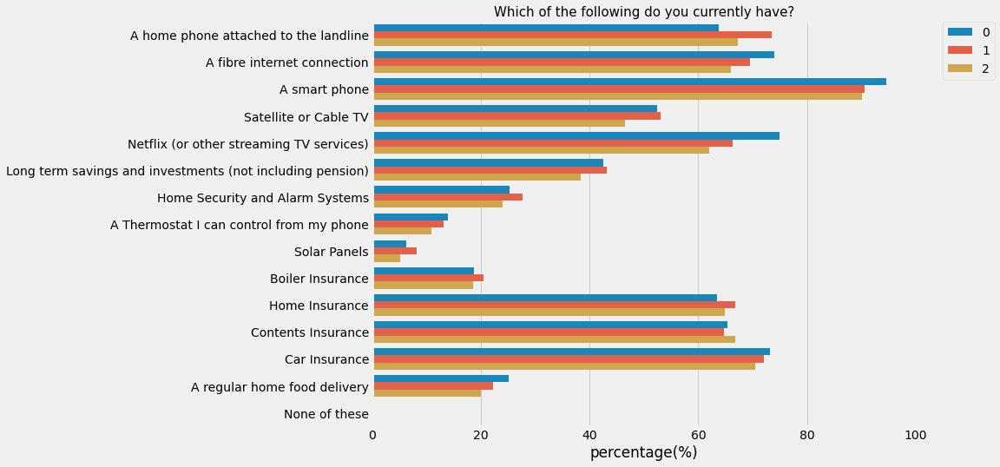

Number of answers in each group: 
1    1488
0    1412
2    1134
Name: y, dtype: int64


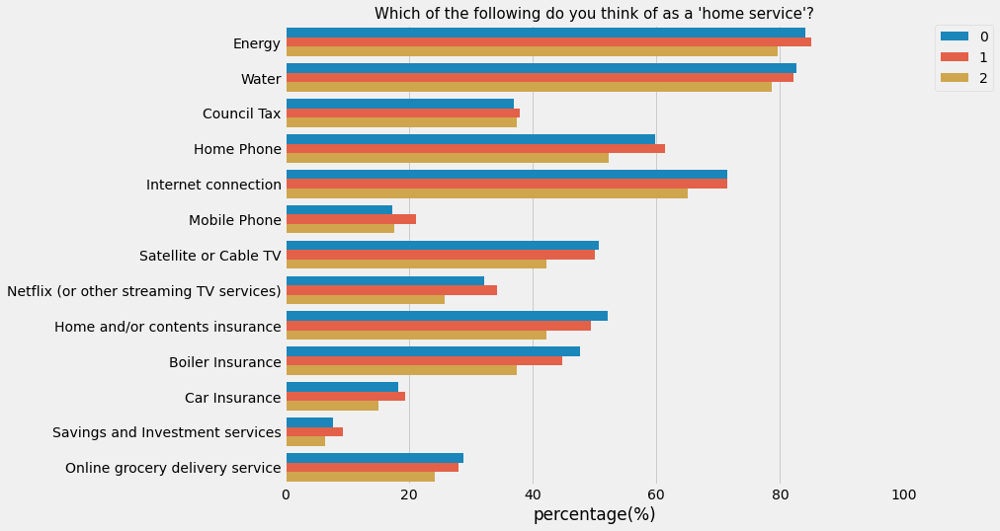

Number of answers in each group: 
1    1488
0    1412
2    1134
Name: y, dtype: int64


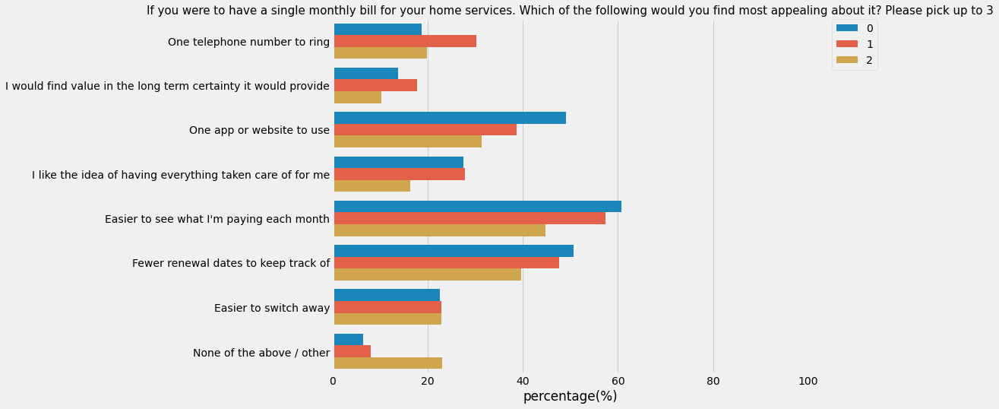

Number of answers in each group: 
1    1488
0    1412
2    1134
Name: y, dtype: int64


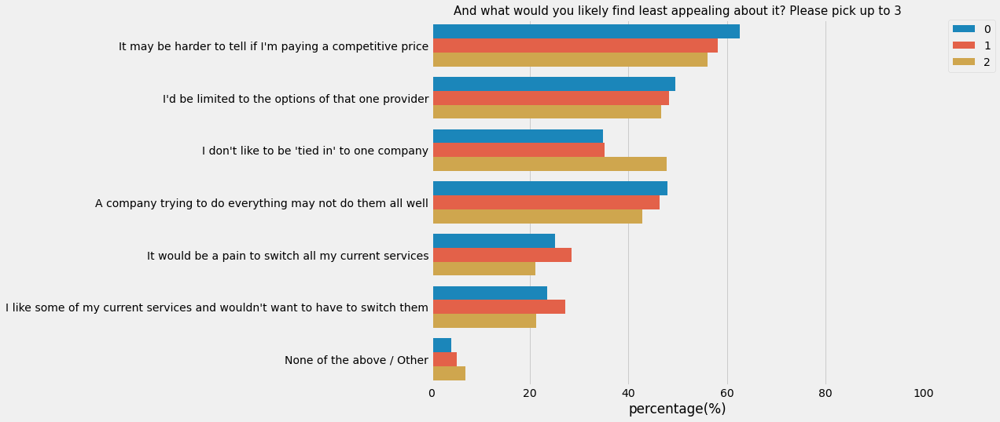

Number of answers in each group: 
1    1488
0    1412
2    1134
Name: y, dtype: int64


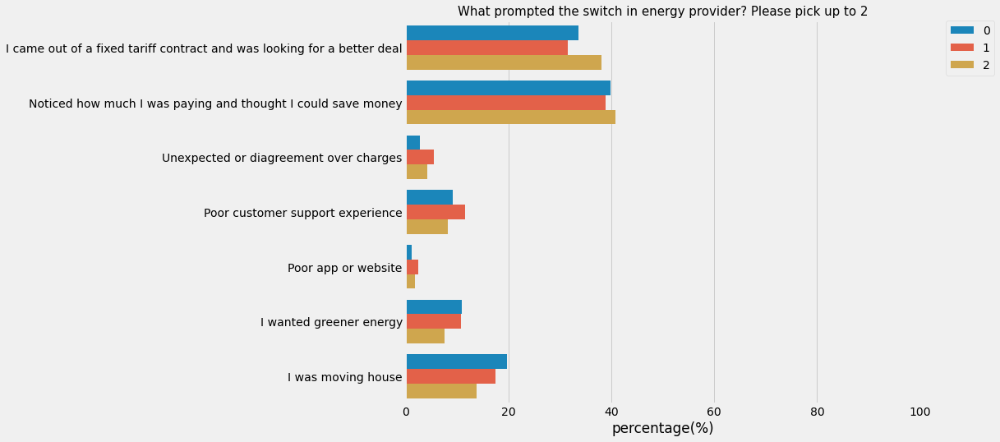

Number of answers in each group: 
1    1488
0    1412
2    1134
Name: y, dtype: int64


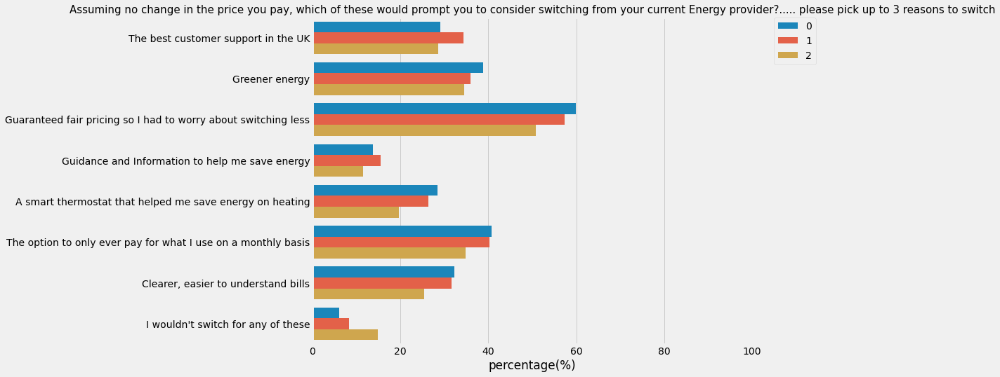

Number of answers in each group: 
1    1488
0    1412
2    1134
Name: y, dtype: int64


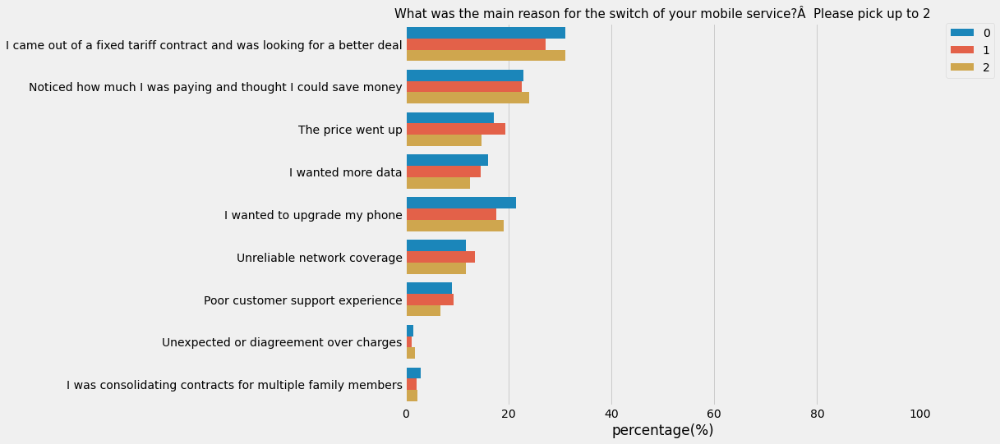

Number of answers in each group: 
1    1488
0    1412
2    1134
Name: y, dtype: int64


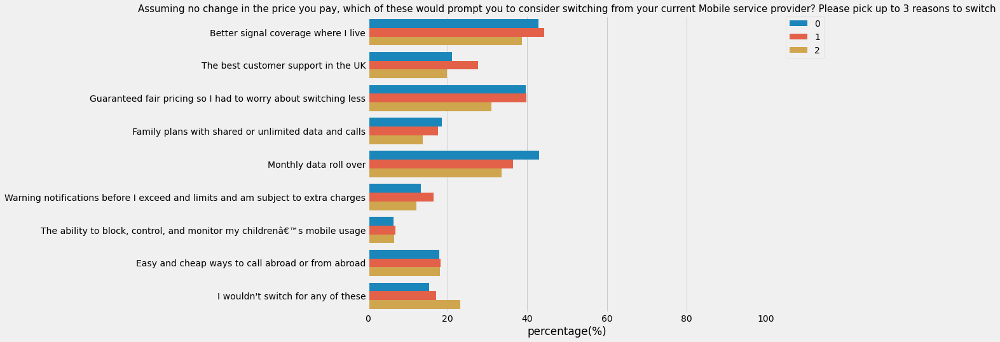

Number of answers in each group: 
1    1488
0    1412
2    1134
Name: y, dtype: int64


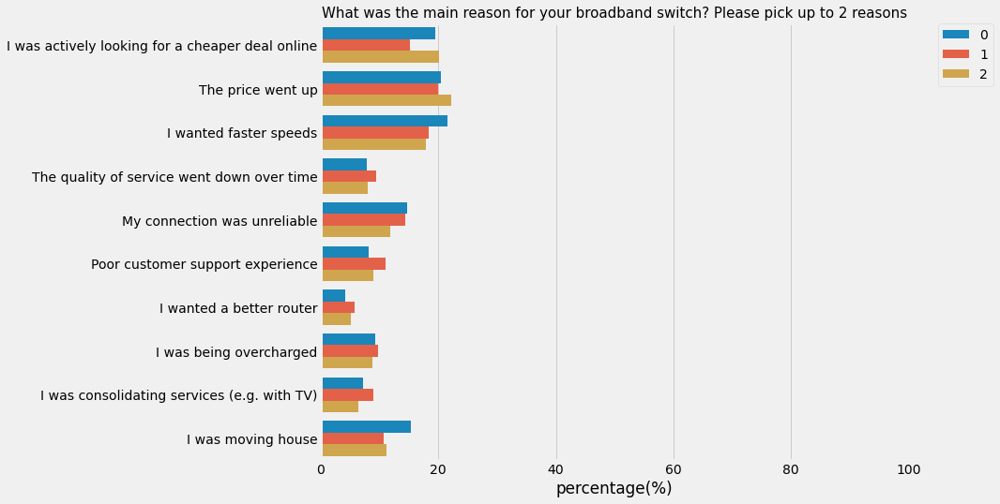

Number of answers in each group: 
1    1488
0    1412
2    1134
Name: y, dtype: int64


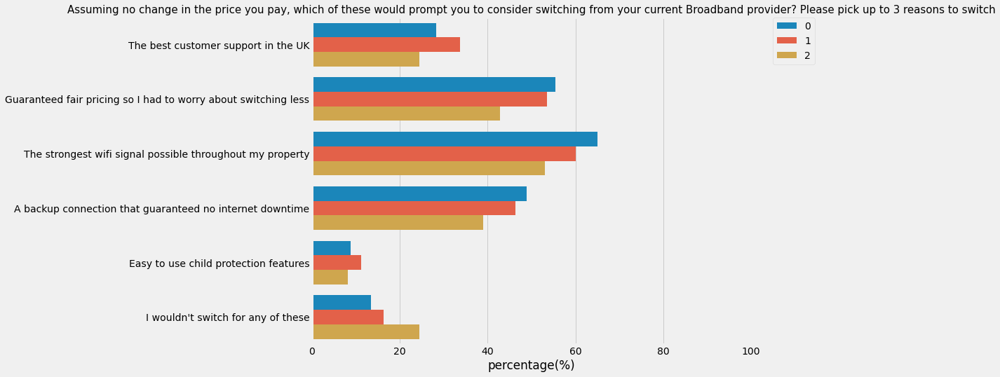

Number of answers in each group: 
1    1488
0    1412
2    1134
Name: y, dtype: int64


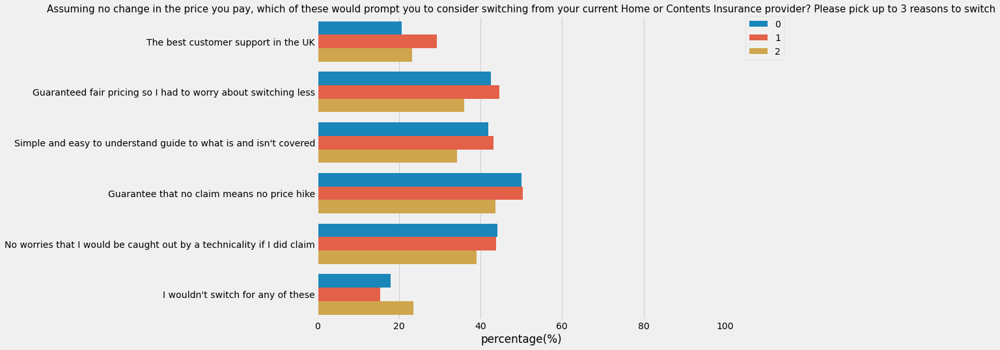

In [120]:

checkbox_list=[range(19,34),range(34,47),range(48,56),range(56,63),range(64,71),range(75,83),range(84,93),
               range(93,102),range(103,113),range(116,122),range(122,128)]

for col in checkbox_list:
    gen_chart_checkbox(tmp,col,'y')

## Let Bygones Be Bygones

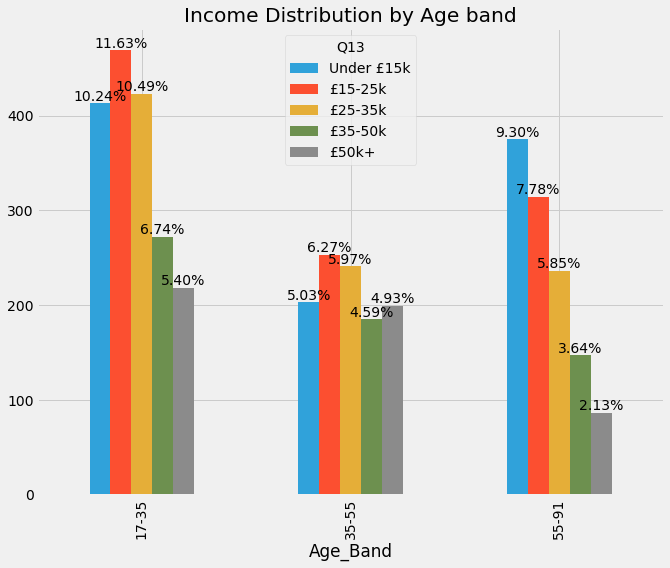

In [317]:
## Most respondents aged between 17-35 and 55-91 and only 13% of respondents fall into £50k income bracket across the board  
g=pd.crosstab(df['Age_Band'],df['Q13']).plot(kind='bar',figsize=(10,8),title='Income Distribution by Age band')
total=len(df)
for p in g.patches:
    height = p.get_height()
    g.text(p.get_x()+p.get_width()/2.,
            height + 3,
            '{:1.2f}%'.format(height/total*100),
            ha="center", fontsize=14) 


Number of answers in each group: 
         Q47
Q11         
Female  2217
Male    1817


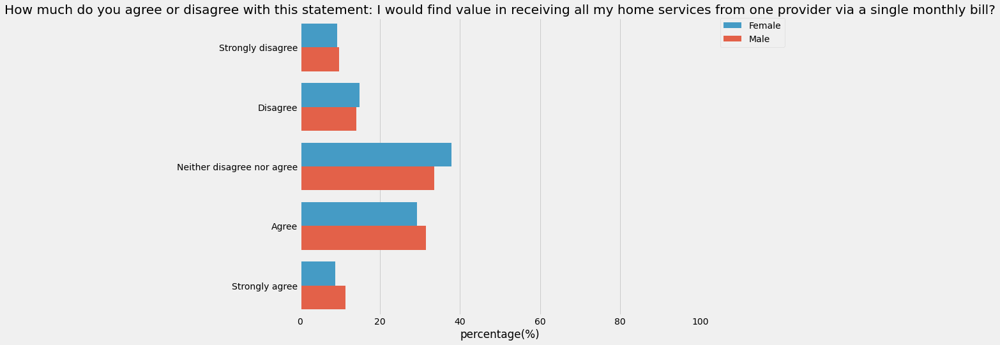

Number of answers in each group: 
             Q47
Q13             
Under £15k   991
£15-25k     1036
£25-35k      900
£35-50k      604
£50k+        503


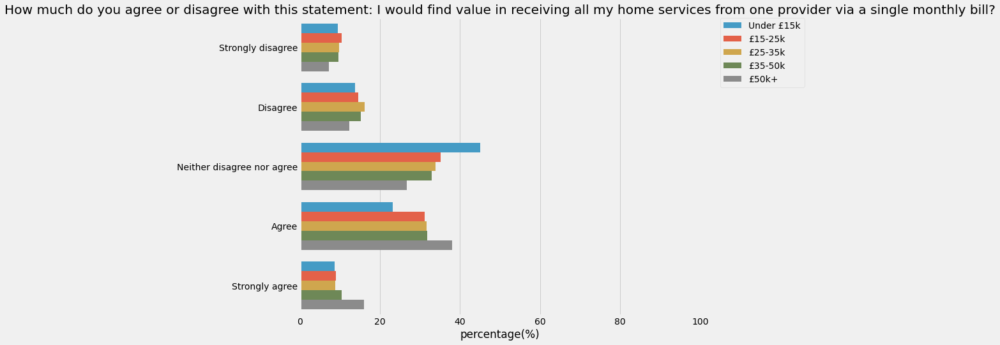

Number of answers in each group: 
       Q47
Q15       
Own   2689
Rent  1345


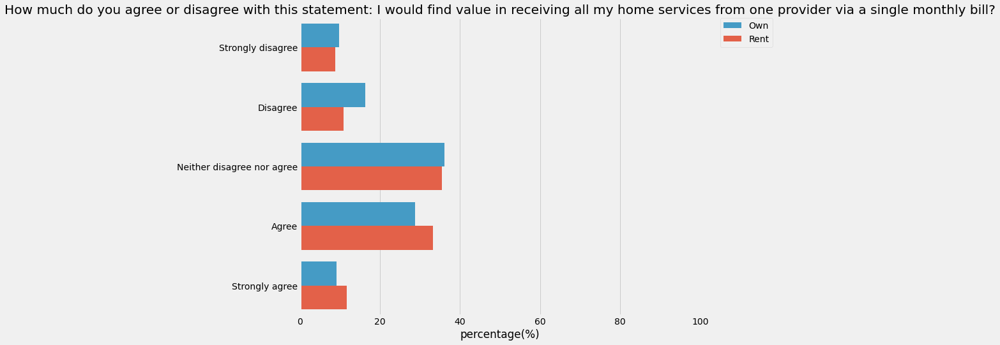

Number of answers in each group: 
            Q47
Q17            
1           754
2          1502
3           777
4           702
5 or more   299


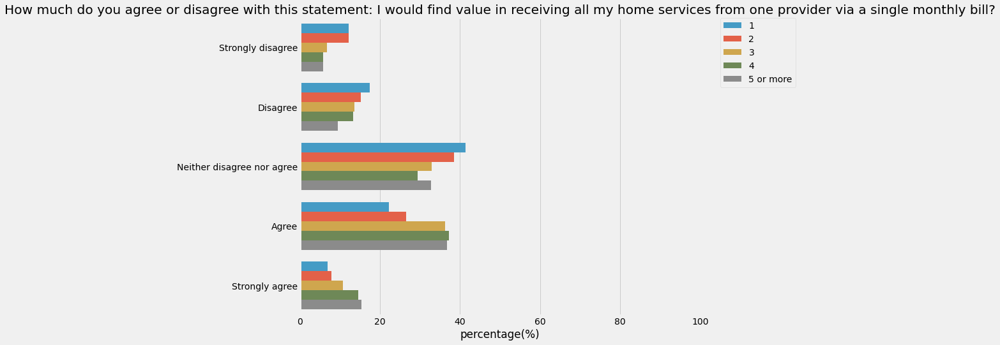

Number of answers in each group: 
           Q47
Age_Band      
17-35     1795
35-55     1081
55-91     1158


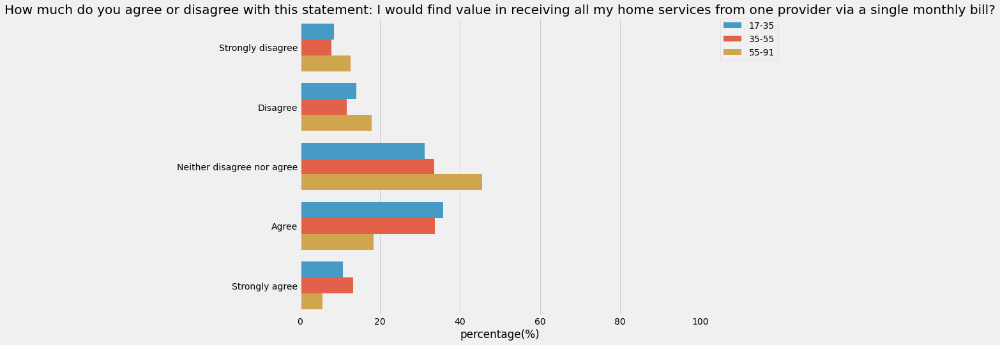

In [394]:
# Single Monthly Bill: male tends to agree more than females, females more netural 
# Income bucket of 50k values most of single monthly bill 
# Renter tend to agree more
# Family size of 3 and plus agree more
# 55+ tend to be more netural and 17-55 tend to agree more
for q in ['Q11','Q13','Q15','Q17','Age_Band']:
    gen_chart_radiobutton(df,'Q47',index,q)

Number of answers in each group: 
Female    2217
Male      1817
Name: Q11, dtype: int64


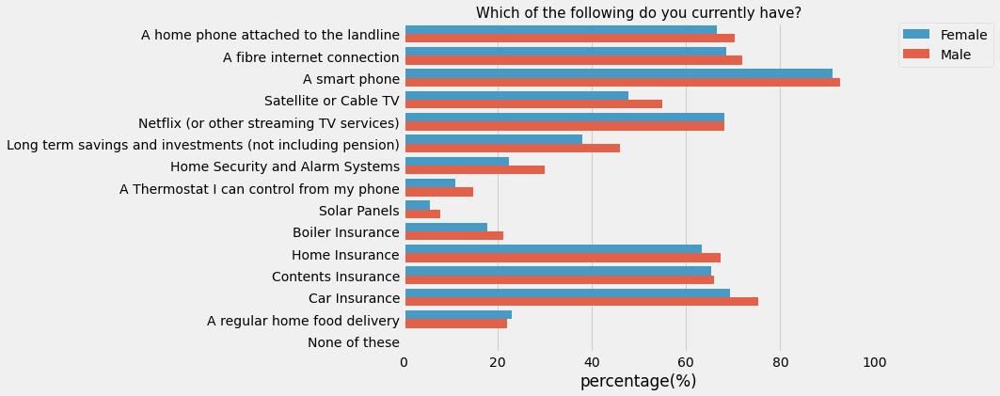

Number of answers in each group: 
£15-25k       1036
Under £15k     991
£25-35k        900
£35-50k        604
£50k+          503
Name: Q13, dtype: int64


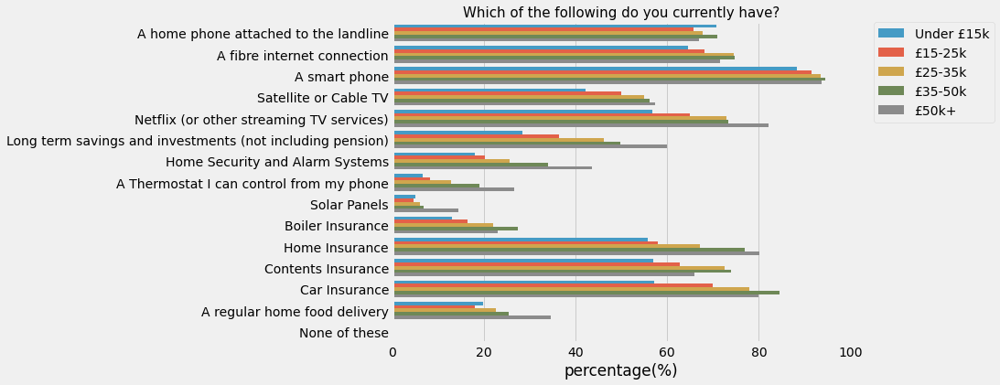

Number of answers in each group: 
Own     2689
Rent    1345
Name: Q15, dtype: int64


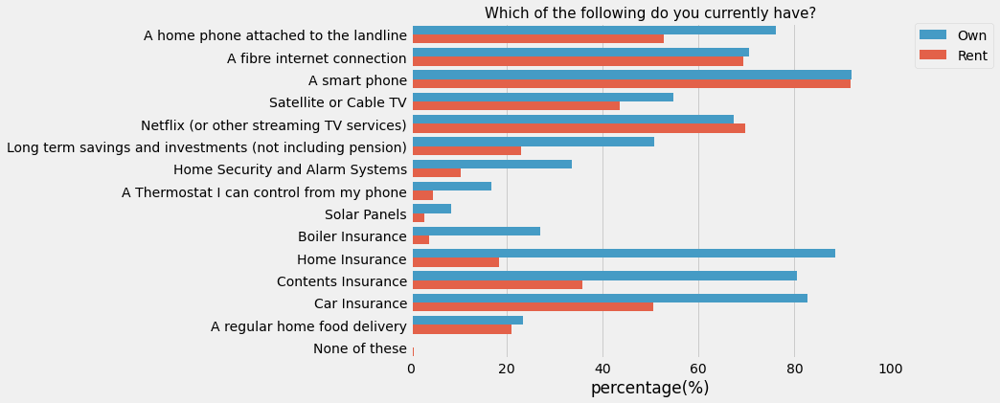

Number of answers in each group: 
2            1502
3             777
1             754
4             702
5 or more     299
Name: Q17, dtype: int64


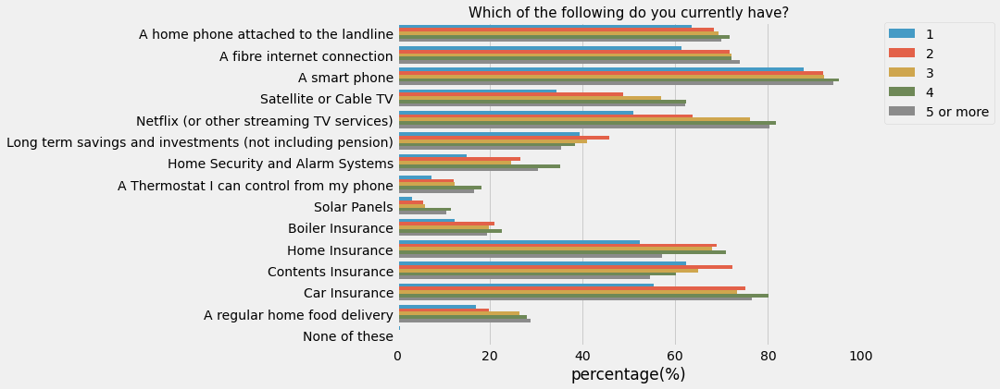

Number of answers in each group: 
17-35    1795
55-91    1158
35-55    1081
Name: Age_Band, dtype: int64


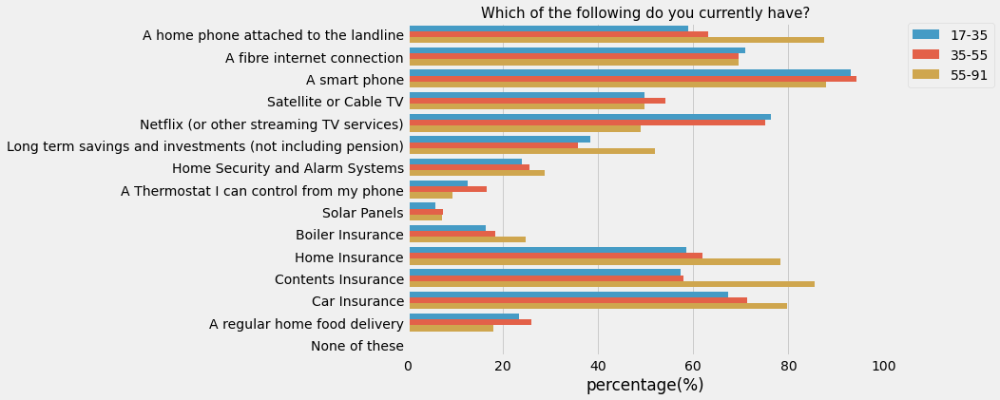

Number of answers in each group: 
Neither disagree nor agree    1448
Agree                         1219
Disagree                       585
Strongly agree                 400
Strongly disagree              382
Name: Q47, dtype: int64


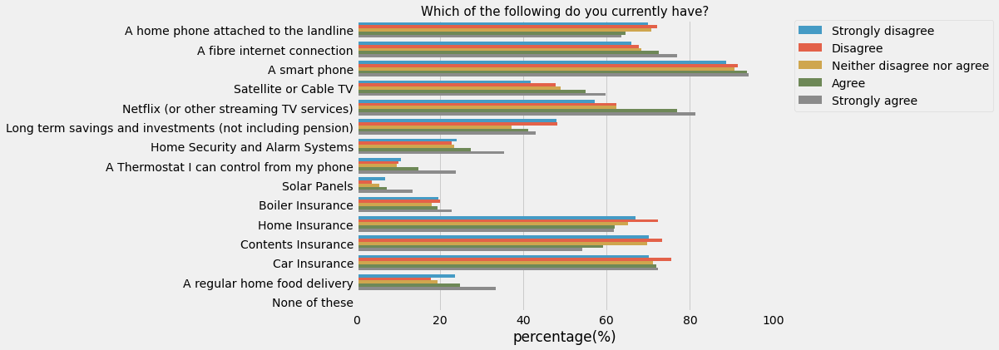

In [414]:
# Which service you currently have: male tend to have more of insurance products and long term investments
# income of 50k+ tend to have more of Netflix, long term investment, regular food dilivery and insurance 
# Owners significanly have more of insurance and home products 
# 55+ significantly have more of insurance, landline and long term investments
for q in ['Q11','Q13','Q15','Q17','Age_Band','Q47']:
    gen_chart_checkbox(tmp,range(19,34),q)

Number of answers in each group: 
Female    2217
Male      1817
Name: Q11, dtype: int64


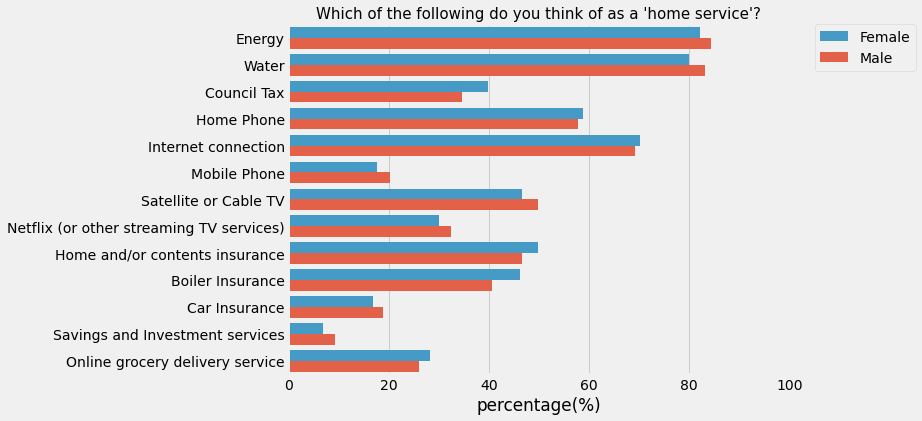

Number of answers in each group: 
£15-25k       1036
Under £15k     991
£25-35k        900
£35-50k        604
£50k+          503
Name: Q13, dtype: int64


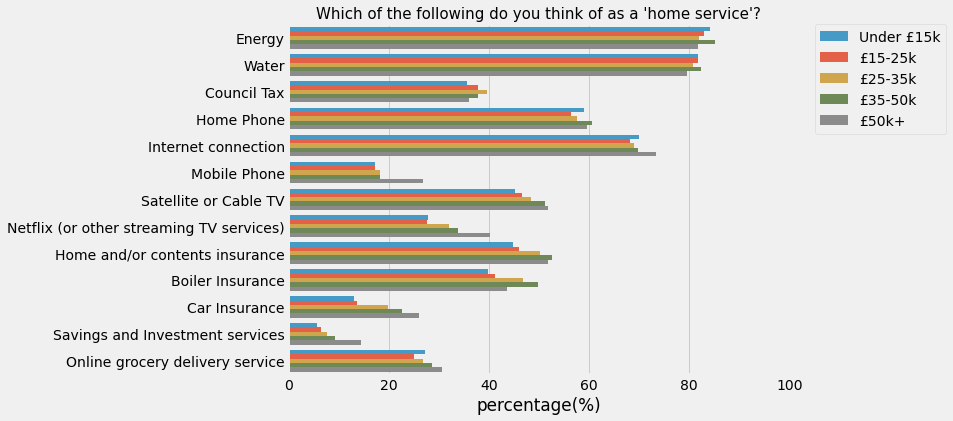

Number of answers in each group: 
Own     2689
Rent    1345
Name: Q15, dtype: int64


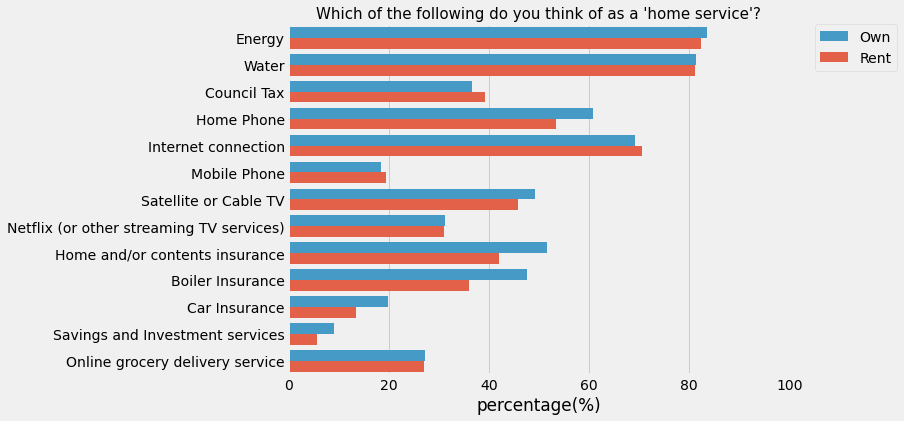

Number of answers in each group: 
2            1502
3             777
1             754
4             702
5 or more     299
Name: Q17, dtype: int64


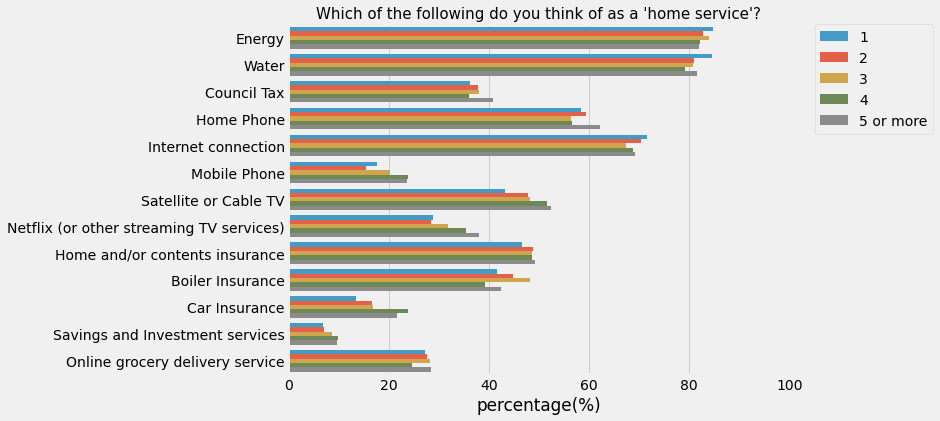

Number of answers in each group: 
17-35    1795
55-91    1158
35-55    1081
Name: Age_Band, dtype: int64


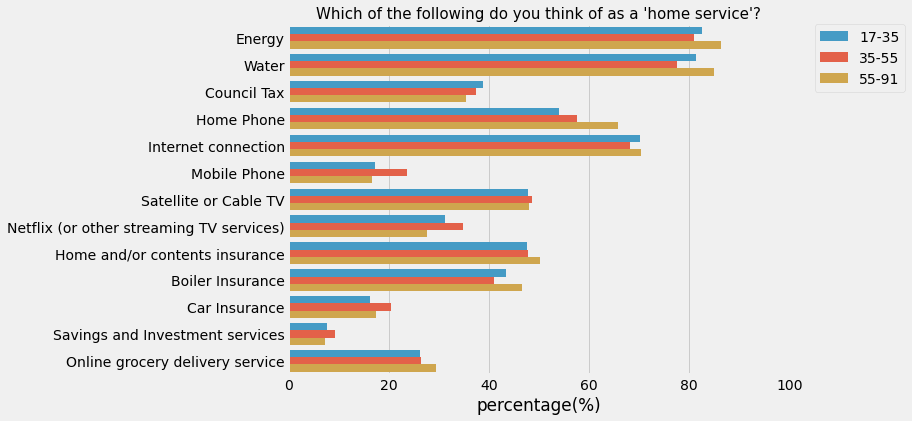

Number of answers in each group: 
Neither disagree nor agree    1448
Agree                         1219
Disagree                       585
Strongly agree                 400
Strongly disagree              382
Name: Q47, dtype: int64


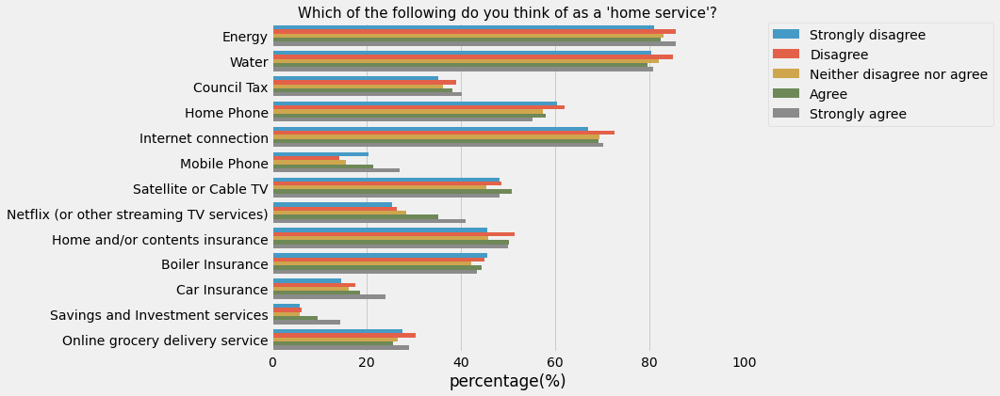

In [415]:
# Home Service: income of 50k+ values more of internet connection, mobile phone, netflix and investment services 
# Home owners values more of insurance products
# 55-91 values more of home phone as home service, for 35-55 values more of mobile phones and car insurance 
for q in ['Q11','Q13','Q15','Q17','Age_Band','Q47']:
    gen_chart_checkbox(tmp,range(34,47),q)

Number of answers in each group: 
Female    2217
Male      1817
Name: Q11, dtype: int64


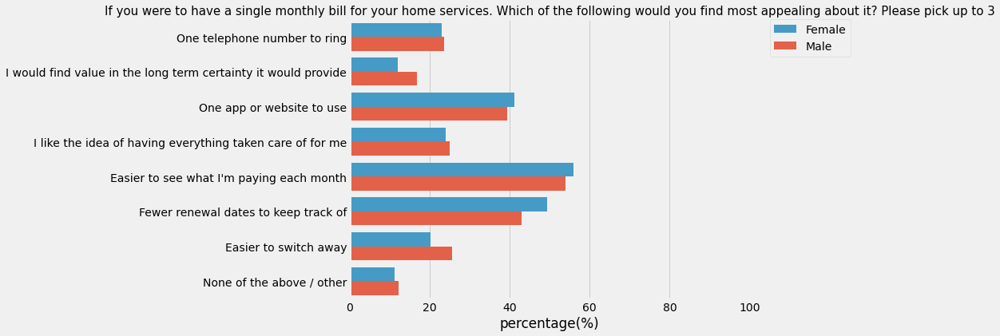

Number of answers in each group: 
£15-25k       1036
Under £15k     991
£25-35k        900
£35-50k        604
£50k+          503
Name: Q13, dtype: int64


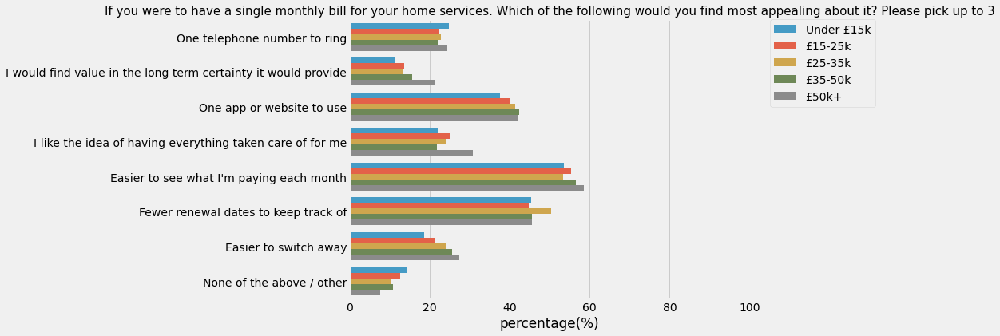

Number of answers in each group: 
Own     2689
Rent    1345
Name: Q15, dtype: int64


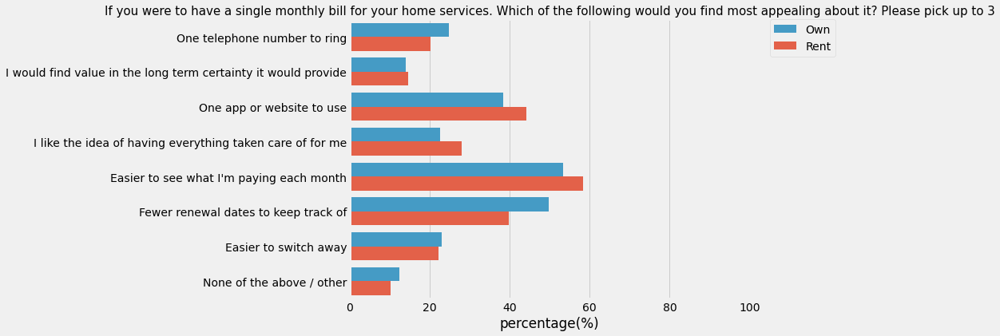

Number of answers in each group: 
2            1502
3             777
1             754
4             702
5 or more     299
Name: Q17, dtype: int64


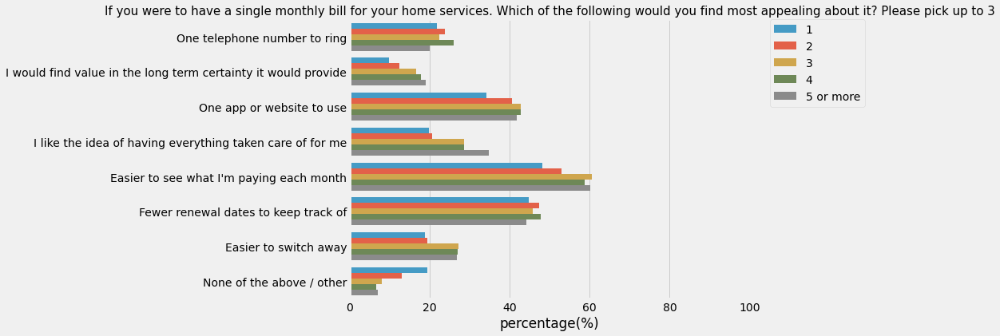

Number of answers in each group: 
17-35    1795
55-91    1158
35-55    1081
Name: Age_Band, dtype: int64


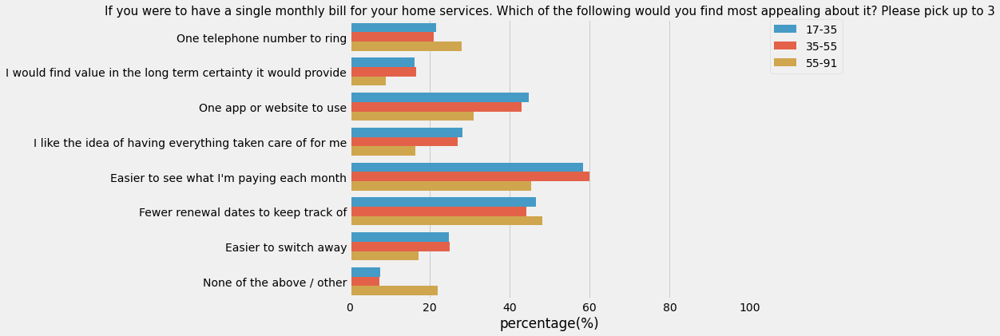

Number of answers in each group: 
Neither disagree nor agree    1448
Agree                         1219
Disagree                       585
Strongly agree                 400
Strongly disagree              382
Name: Q47, dtype: int64


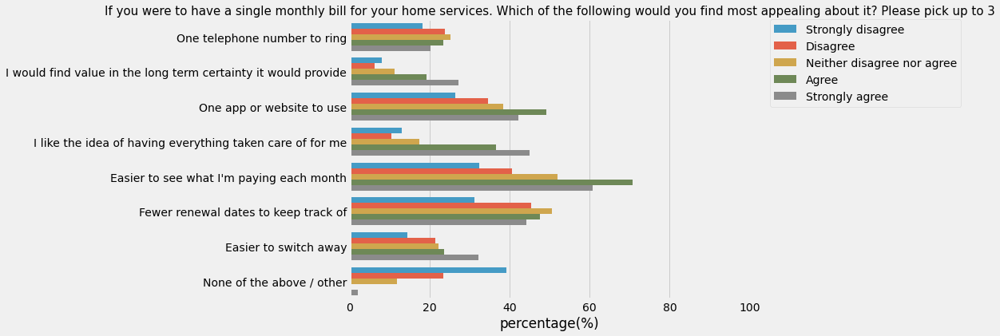

In [417]:
# most appealing about Single Bill: income of 50k extremely like the idea of having everything taken care of and find value in the long term centainty
# Renters value more of one app to use and easier to see payment each month
# 55 below values much more of easier to see payment each month and  one app to use as opposed to 55+ values more of fewer renewal dates to keep track and one telephone number to ring 
# People agree values significantly more of easier to see payment each month and  one app to use
for q in ['Q11','Q13','Q15','Q17','Age_Band','Q47']:
    gen_chart_checkbox(tmp,range(48,56),q)

Number of answers in each group: 
Female    2217
Male      1817
Name: Q11, dtype: int64


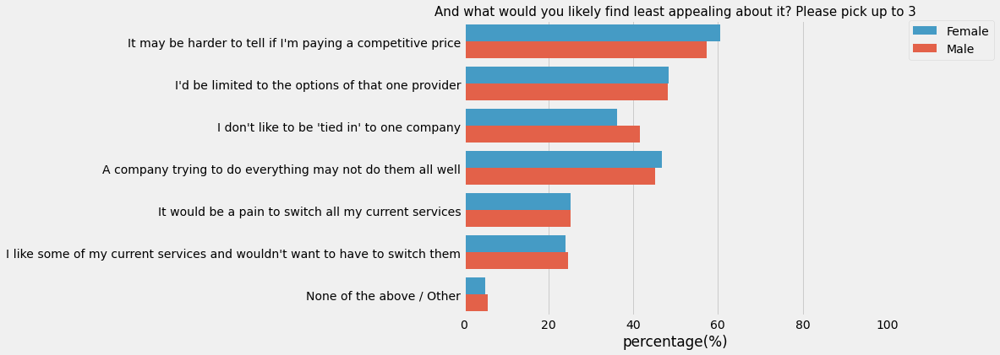

Number of answers in each group: 
£15-25k       1036
Under £15k     991
£25-35k        900
£35-50k        604
£50k+          503
Name: Q13, dtype: int64


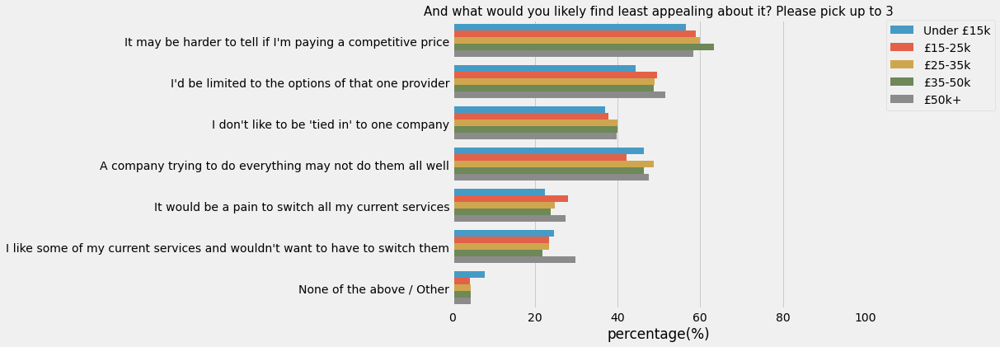

Number of answers in each group: 
Own     2689
Rent    1345
Name: Q15, dtype: int64


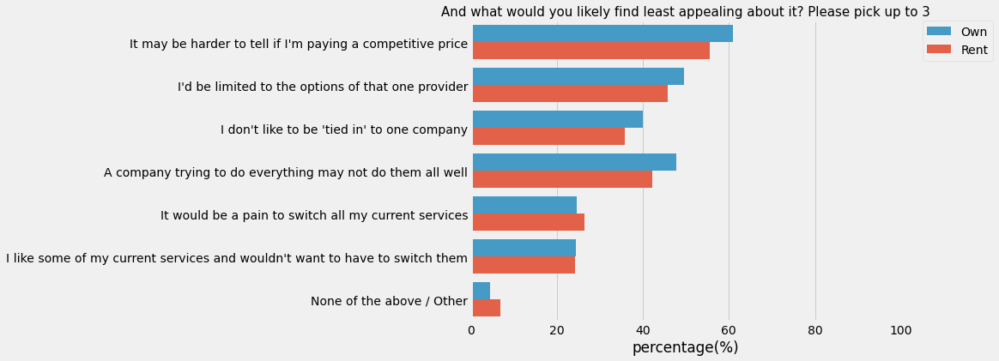

Number of answers in each group: 
2            1502
3             777
1             754
4             702
5 or more     299
Name: Q17, dtype: int64


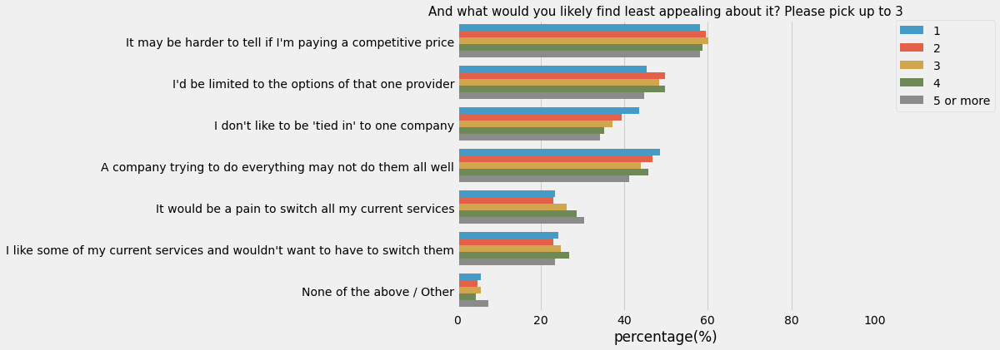

Number of answers in each group: 
17-35    1795
55-91    1158
35-55    1081
Name: Age_Band, dtype: int64


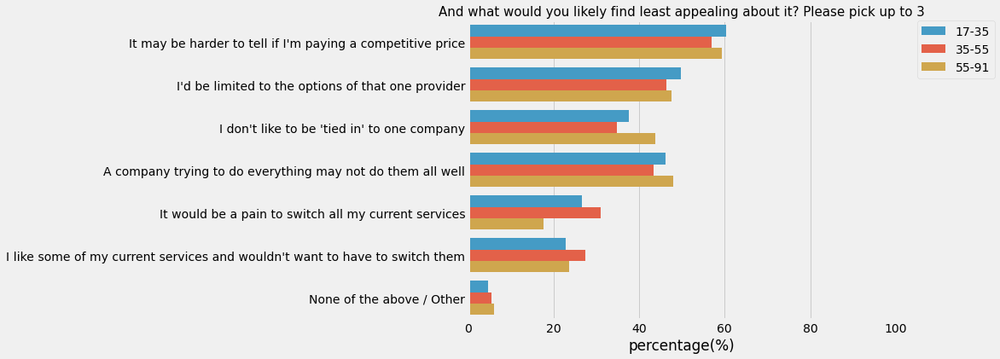

Number of answers in each group: 
Neither disagree nor agree    1448
Agree                         1219
Disagree                       585
Strongly agree                 400
Strongly disagree              382
Name: Q47, dtype: int64


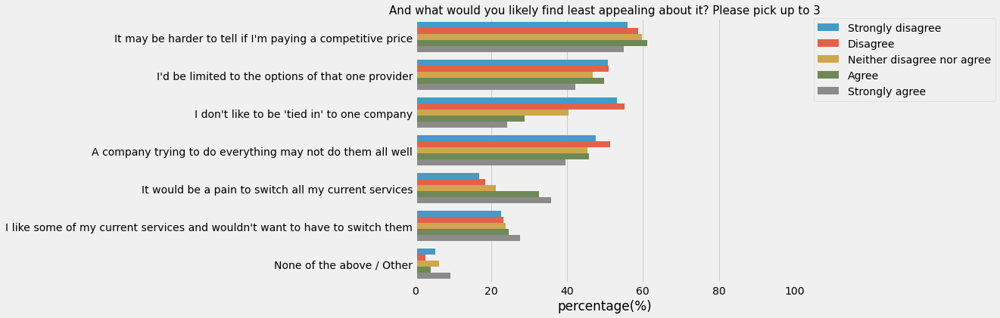

In [418]:
# Least appealing of single bill: income of 50k significantly values more of appreciating current service and wouldn't want to switch and values more of more options 
# People agree(or strongly) especially concerns it would be pain to switch 
# people who strongly disagree significantly don't like to be tied in to one company
for q in ['Q11','Q13','Q15','Q17','Age_Band','Q47']:
    gen_chart_checkbox(tmp,range(56,63),q)

Number of answers in each group: 
Female    2217
Male      1817
Name: Q11, dtype: int64


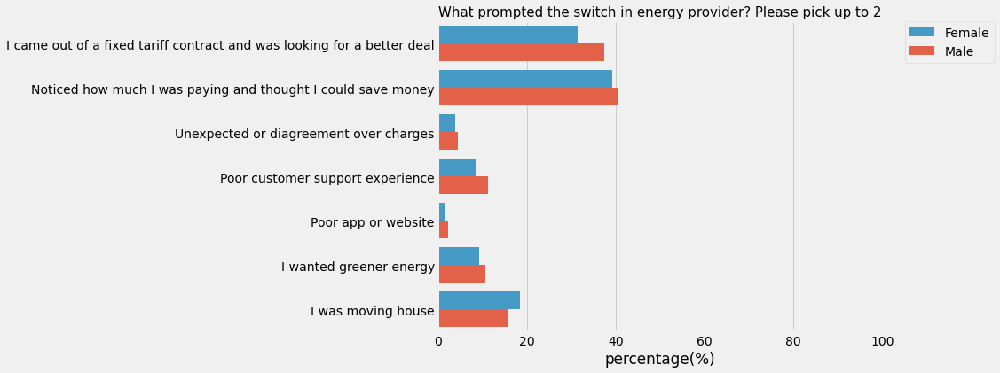

Number of answers in each group: 
£15-25k       1036
Under £15k     991
£25-35k        900
£35-50k        604
£50k+          503
Name: Q13, dtype: int64


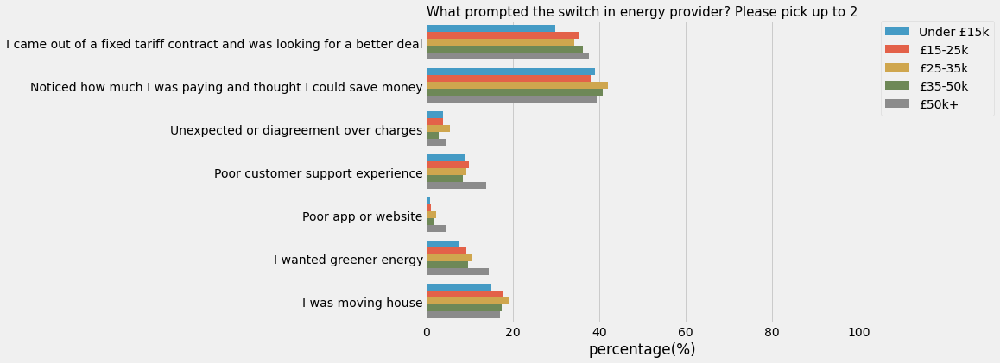

Number of answers in each group: 
Own     2689
Rent    1345
Name: Q15, dtype: int64


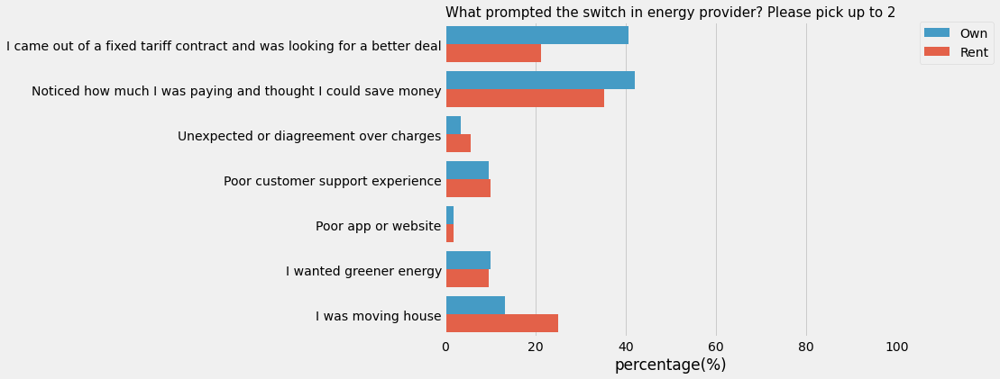

Number of answers in each group: 
2            1502
3             777
1             754
4             702
5 or more     299
Name: Q17, dtype: int64


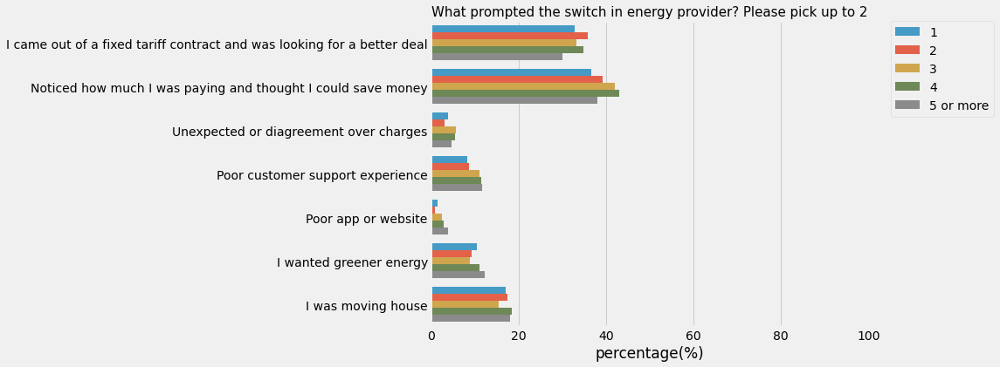

Number of answers in each group: 
17-35    1795
55-91    1158
35-55    1081
Name: Age_Band, dtype: int64


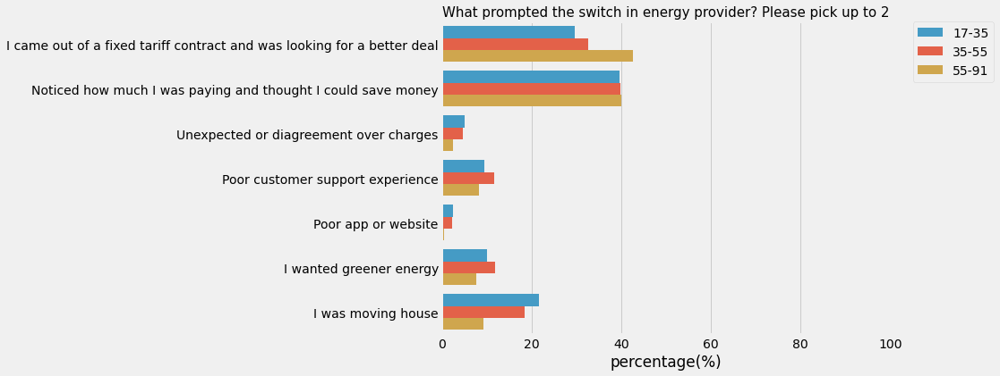

Number of answers in each group: 
Neither disagree nor agree    1448
Agree                         1219
Disagree                       585
Strongly agree                 400
Strongly disagree              382
Name: Q47, dtype: int64


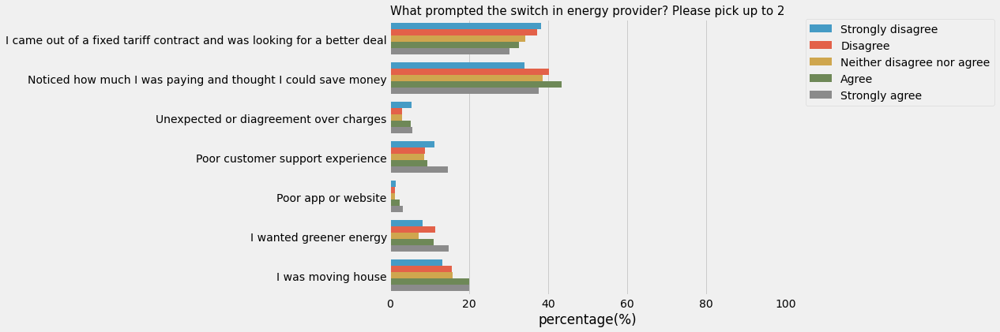

In [419]:
#Energy provider switch: income of 50k+ switch more due to poor customer serivce and wanted greenr energy
# Renters switch significantly more due to moving house 
#55+ switch significantly more due to look for a better deal
# people who agree( and strongly) switch more due to moeny saving, poor customer serivce and moving house  
for q in ['Q11','Q13','Q15','Q17','Age_Band','Q47']:
    gen_chart_checkbox(tmp,range(64,71),q)

Number of answers in each group: 
Female    2217
Male      1817
Name: Q11, dtype: int64


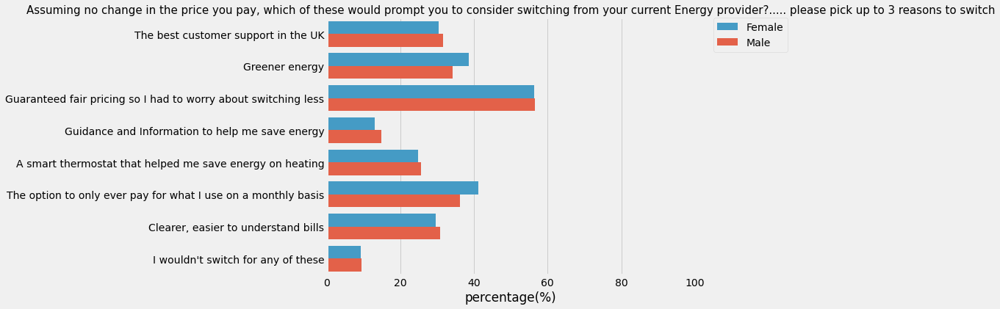

Number of answers in each group: 
£15-25k       1036
Under £15k     991
£25-35k        900
£35-50k        604
£50k+          503
Name: Q13, dtype: int64


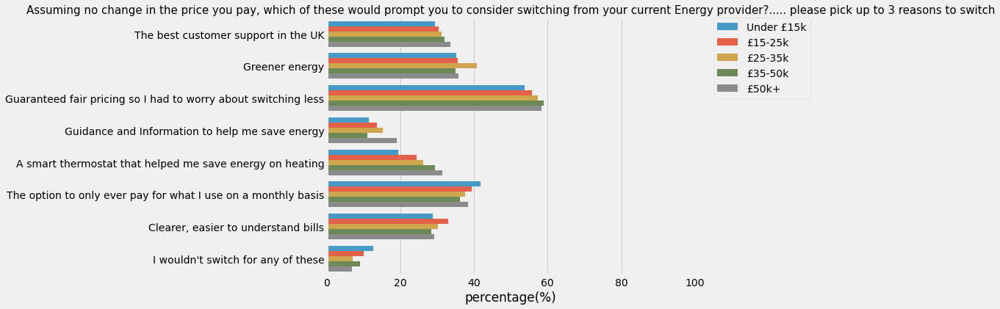

Number of answers in each group: 
Own     2689
Rent    1345
Name: Q15, dtype: int64


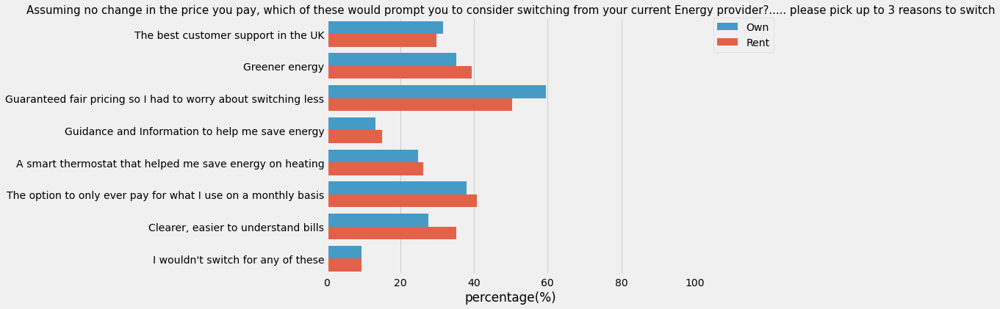

Number of answers in each group: 
2            1502
3             777
1             754
4             702
5 or more     299
Name: Q17, dtype: int64


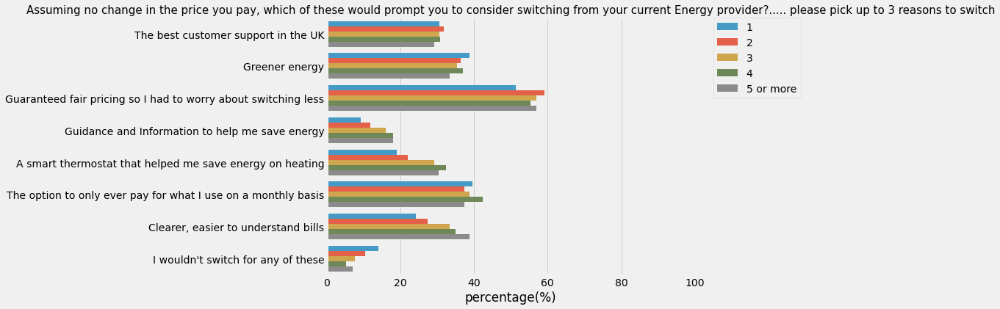

Number of answers in each group: 
17-35    1795
55-91    1158
35-55    1081
Name: Age_Band, dtype: int64


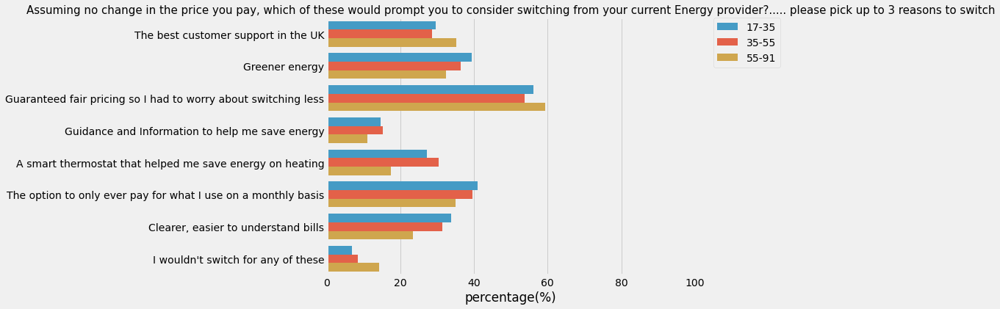

Number of answers in each group: 
Neither disagree nor agree    1448
Agree                         1219
Disagree                       585
Strongly agree                 400
Strongly disagree              382
Name: Q47, dtype: int64


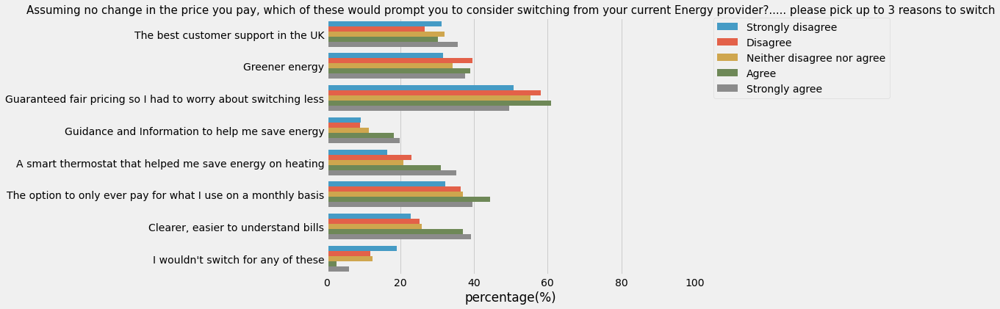

In [420]:
# Assuming no price change, peopple who agree(or strongly) switch more due to a smart thermostat that helped save energy and clearer bills
for q in ['Q11','Q13','Q15','Q17','Age_Band','Q47']:
    gen_chart_checkbox(tmp,range(75,83),q)

Number of answers in each group: 
Female    2217
Male      1817
Name: Q11, dtype: int64


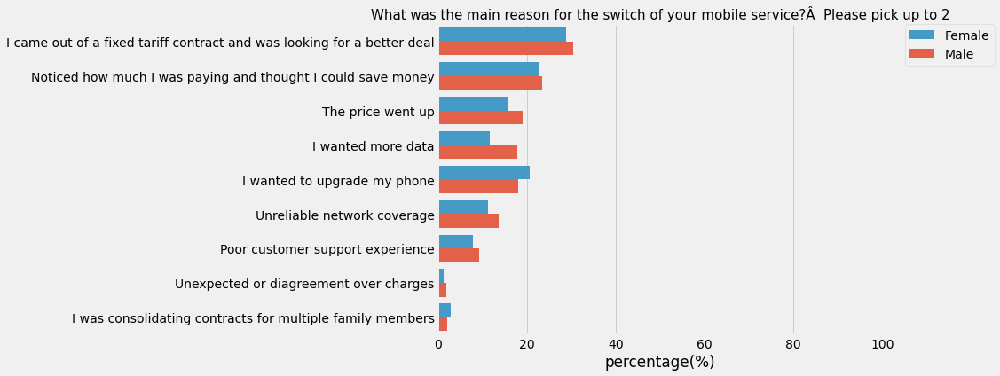

Number of answers in each group: 
£15-25k       1036
Under £15k     991
£25-35k        900
£35-50k        604
£50k+          503
Name: Q13, dtype: int64


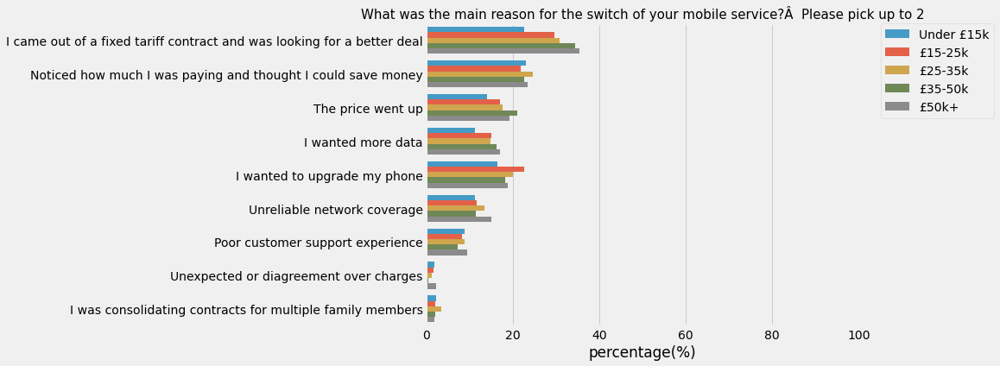

Number of answers in each group: 
Own     2689
Rent    1345
Name: Q15, dtype: int64


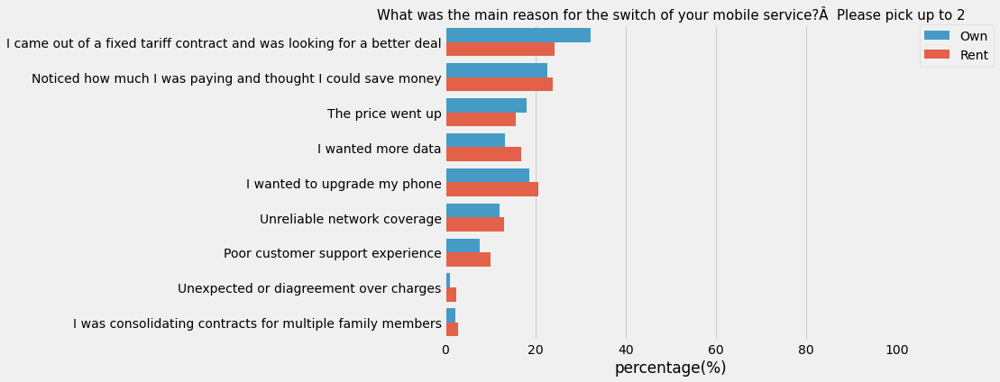

Number of answers in each group: 
2            1502
3             777
1             754
4             702
5 or more     299
Name: Q17, dtype: int64


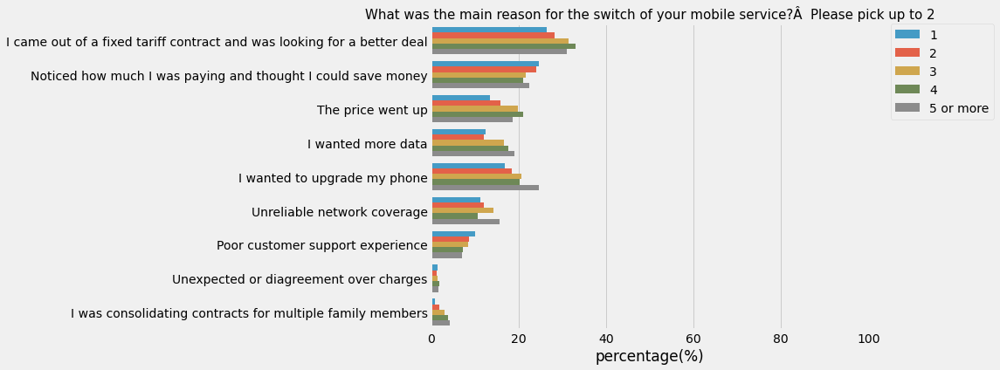

Number of answers in each group: 
17-35    1795
55-91    1158
35-55    1081
Name: Age_Band, dtype: int64


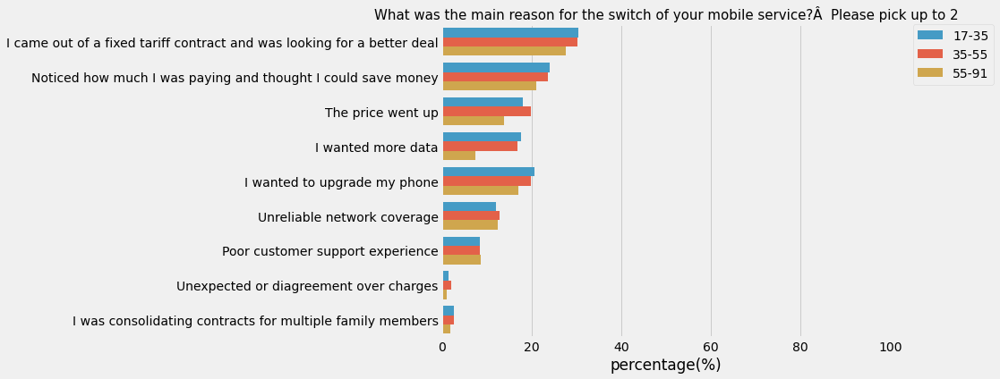

Number of answers in each group: 
Neither disagree nor agree    1448
Agree                         1219
Disagree                       585
Strongly agree                 400
Strongly disagree              382
Name: Q47, dtype: int64


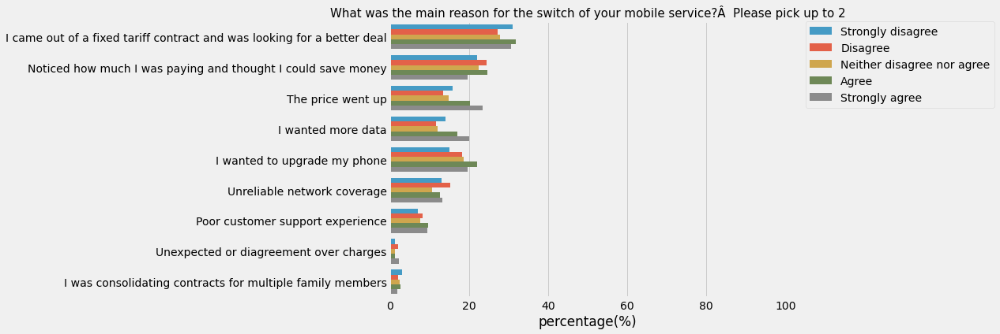

In [421]:
# mobile phone switch: people who agree(or strongly agree)switch more due to the price went up and wanted more data
for q in ['Q11','Q13','Q15','Q17','Age_Band','Q47']:
    gen_chart_checkbox(tmp,range(84,93),q)

Number of answers in each group: 
Female    2217
Male      1817
Name: Q11, dtype: int64


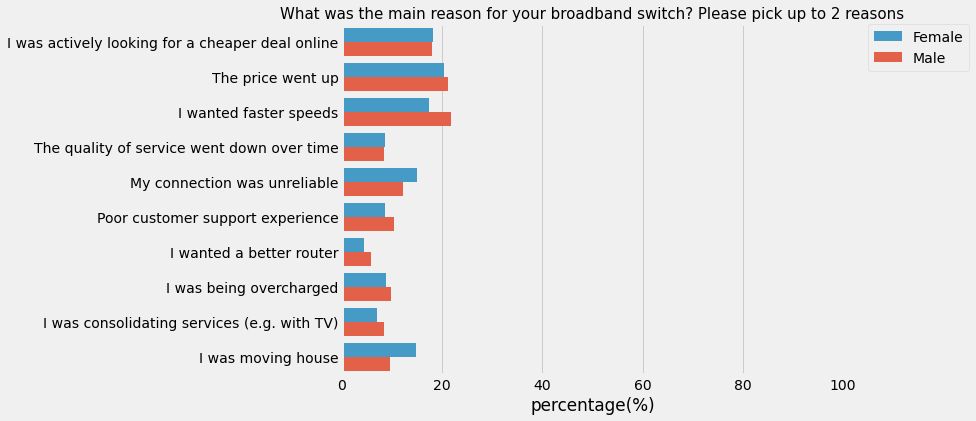

Number of answers in each group: 
£15-25k       1036
Under £15k     991
£25-35k        900
£35-50k        604
£50k+          503
Name: Q13, dtype: int64


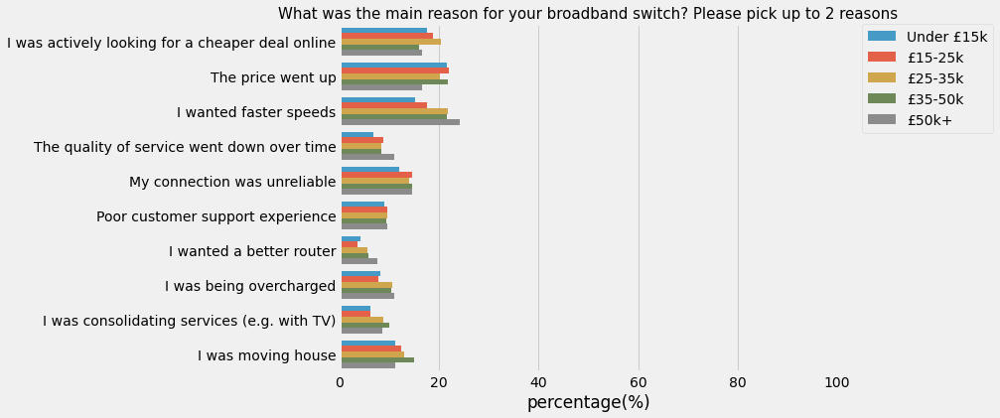

Number of answers in each group: 
Own     2689
Rent    1345
Name: Q15, dtype: int64


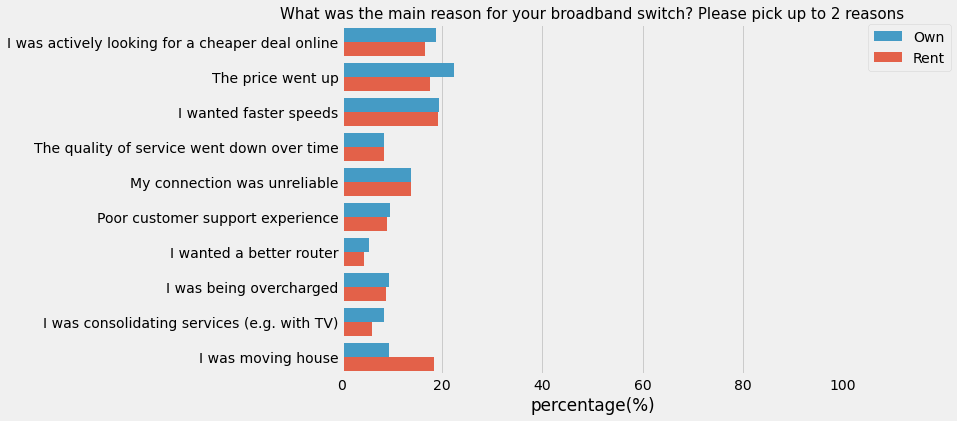

Number of answers in each group: 
2            1502
3             777
1             754
4             702
5 or more     299
Name: Q17, dtype: int64


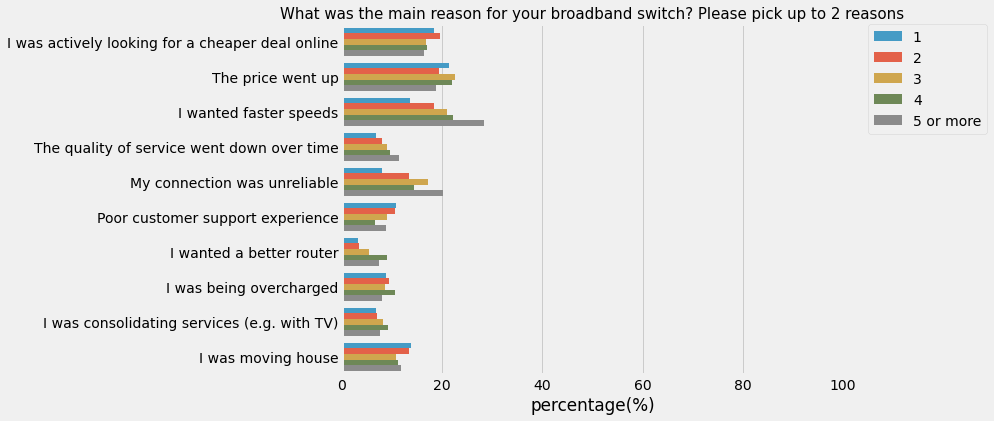

Number of answers in each group: 
17-35    1795
55-91    1158
35-55    1081
Name: Age_Band, dtype: int64


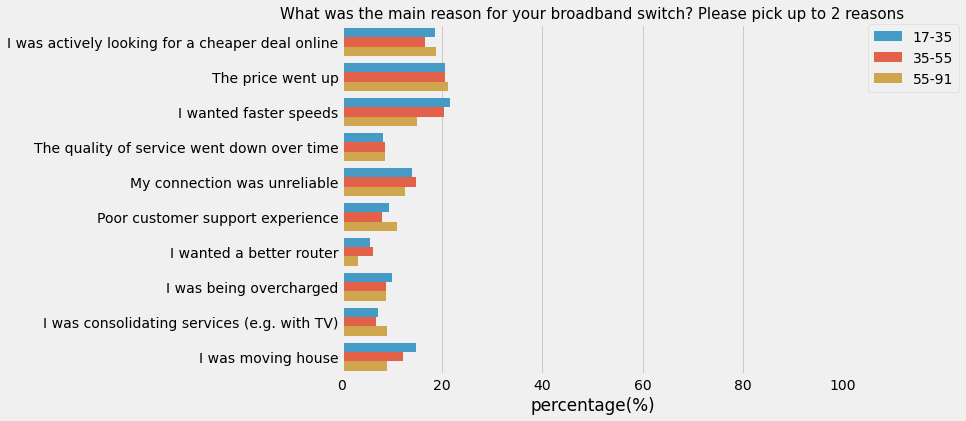

Number of answers in each group: 
Neither disagree nor agree    1448
Agree                         1219
Disagree                       585
Strongly agree                 400
Strongly disagree              382
Name: Q47, dtype: int64


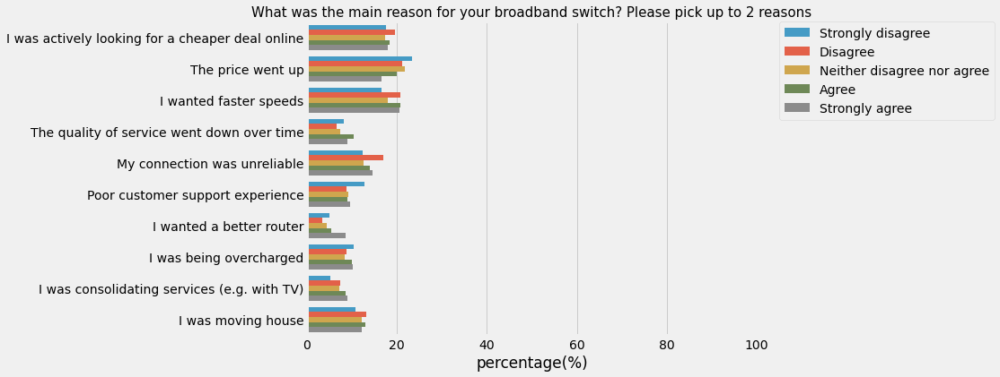

In [423]:
# BB switch: income of 50k+ switch due to faster speeds need
# Renter switch significantly due to house moving 
# family of 4+ switch due to faster speed and poor connection
# 
for q in ['Q11','Q13','Q15','Q17','Age_Band','Q47']:
    gen_chart_checkbox(tmp,range(103,113),q)

Number of answers in each group: 
Female    2217
Male      1817
Name: Q11, dtype: int64


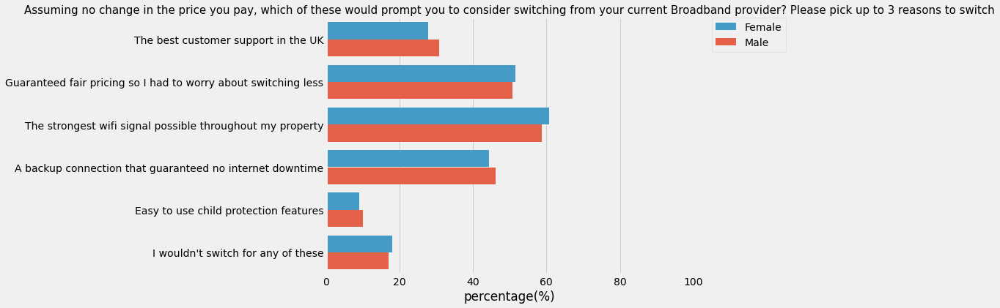

Number of answers in each group: 
£15-25k       1036
Under £15k     991
£25-35k        900
£35-50k        604
£50k+          503
Name: Q13, dtype: int64


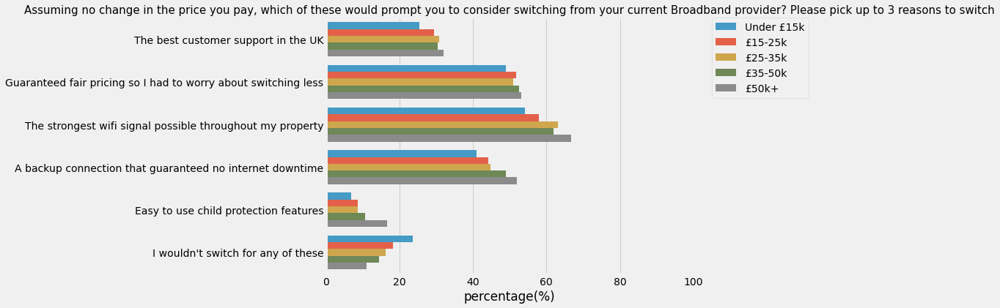

Number of answers in each group: 
Own     2689
Rent    1345
Name: Q15, dtype: int64


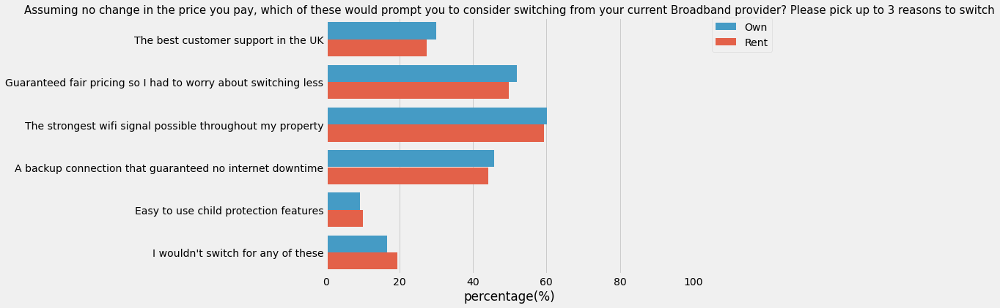

Number of answers in each group: 
2            1502
3             777
1             754
4             702
5 or more     299
Name: Q17, dtype: int64


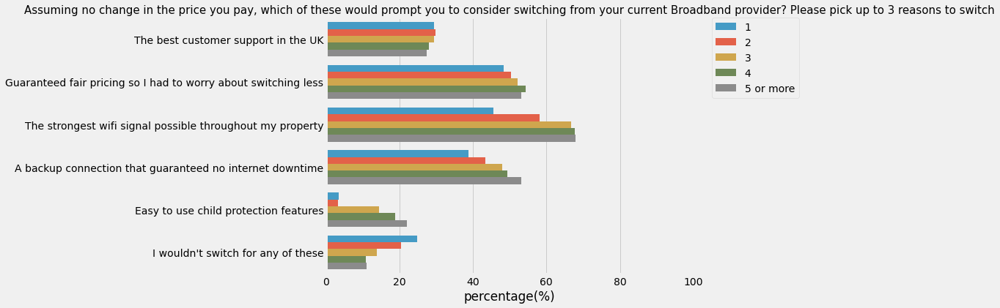

Number of answers in each group: 
17-35    1795
55-91    1158
35-55    1081
Name: Age_Band, dtype: int64


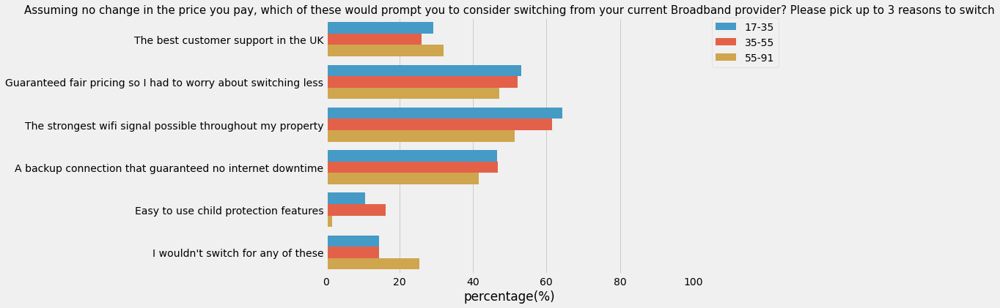

Number of answers in each group: 
Neither disagree nor agree    1448
Agree                         1219
Disagree                       585
Strongly agree                 400
Strongly disagree              382
Name: Q47, dtype: int64


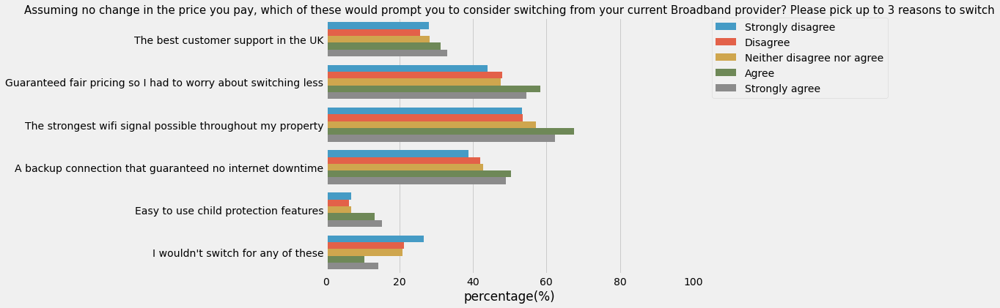

In [424]:
# BB: income of 50k+ want best signal and backup connection for internet down time
# Same does people who agree(or strongly agree)
for q in ['Q11','Q13','Q15','Q17','Age_Band','Q47']:
    gen_chart_checkbox(tmp,range(116,122),q)

Number of answers in each group: 
17-35    1795
55-91    1158
35-55    1081
Name: Age_Band, dtype: int64


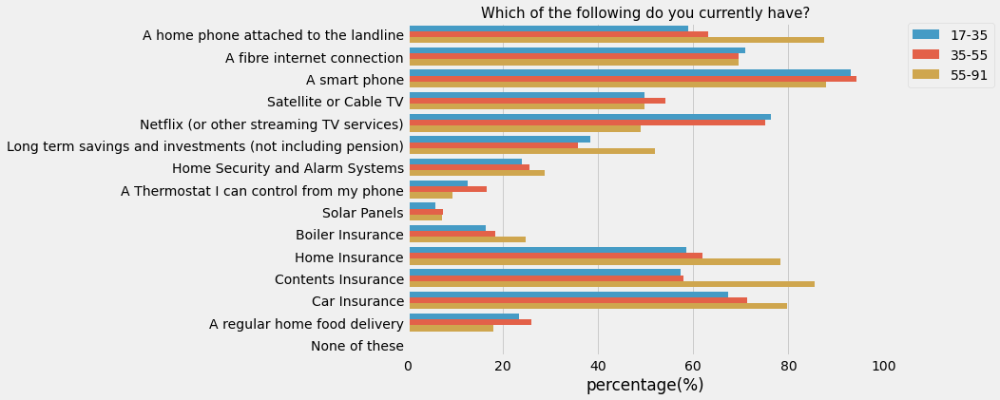

Number of answers in each group: 
17-35    1795
55-91    1158
35-55    1081
Name: Age_Band, dtype: int64


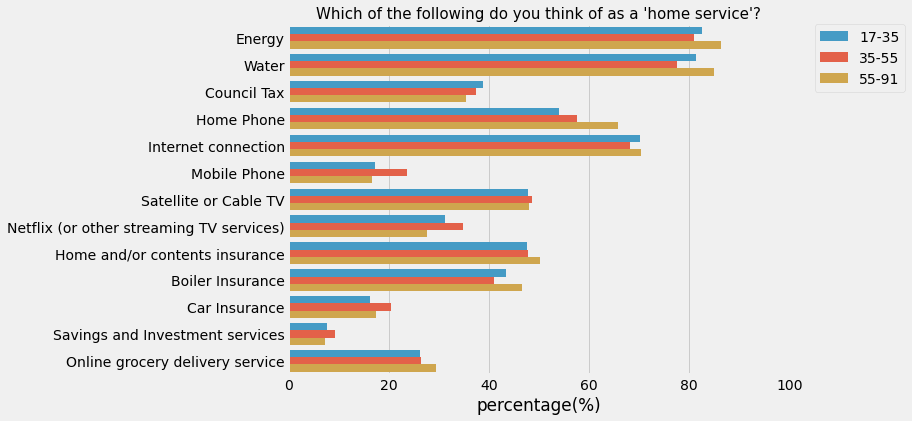

Number of answers in each group: 
17-35    1795
55-91    1158
35-55    1081
Name: Age_Band, dtype: int64


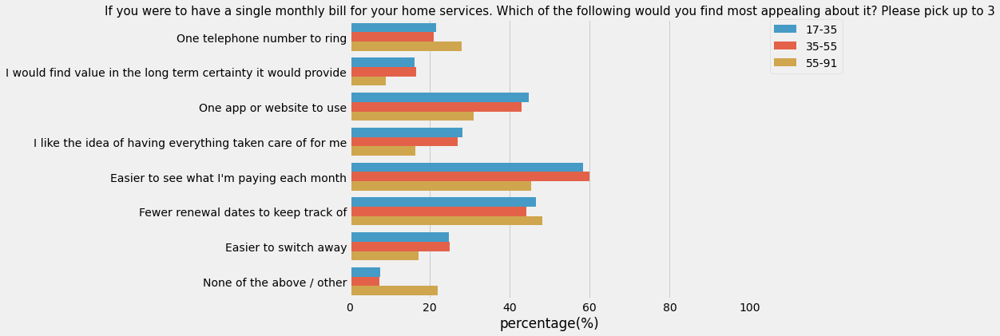

Number of answers in each group: 
17-35    1795
55-91    1158
35-55    1081
Name: Age_Band, dtype: int64


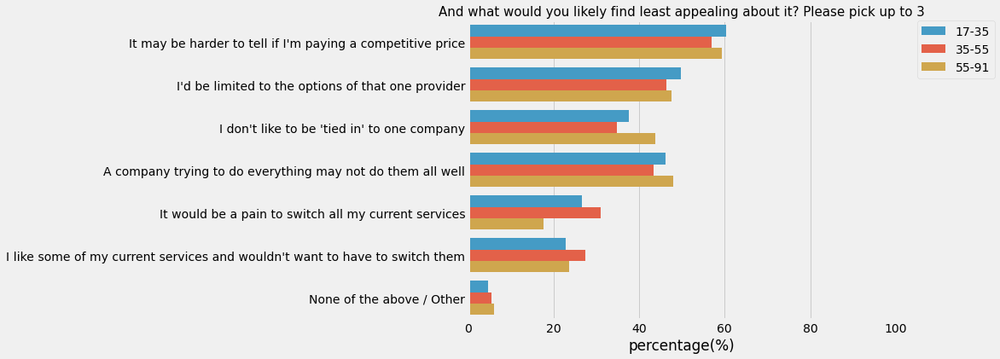

Number of answers in each group: 
17-35    1795
55-91    1158
35-55    1081
Name: Age_Band, dtype: int64


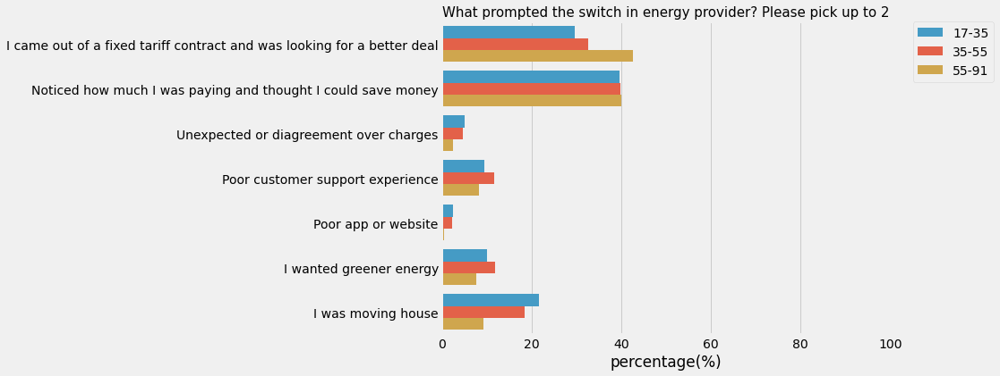

Number of answers in each group: 
17-35    1795
55-91    1158
35-55    1081
Name: Age_Band, dtype: int64


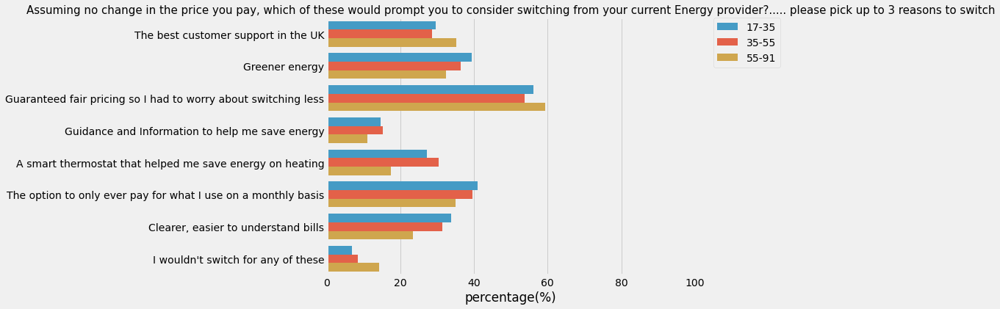

Number of answers in each group: 
17-35    1795
55-91    1158
35-55    1081
Name: Age_Band, dtype: int64


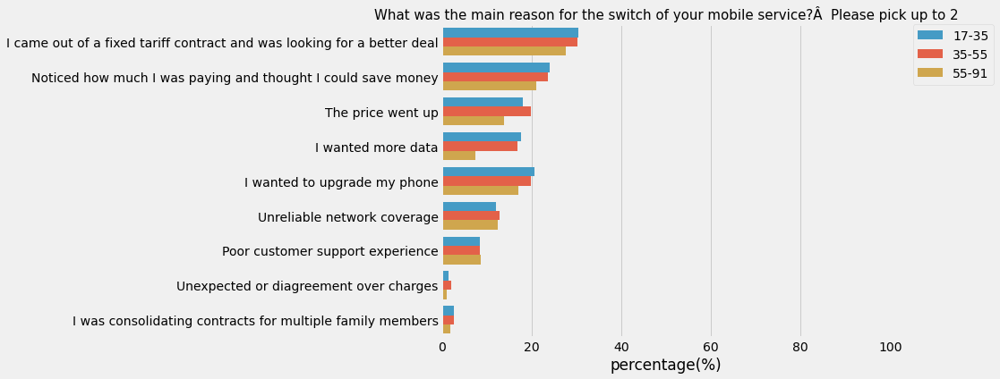

Number of answers in each group: 
17-35    1795
55-91    1158
35-55    1081
Name: Age_Band, dtype: int64


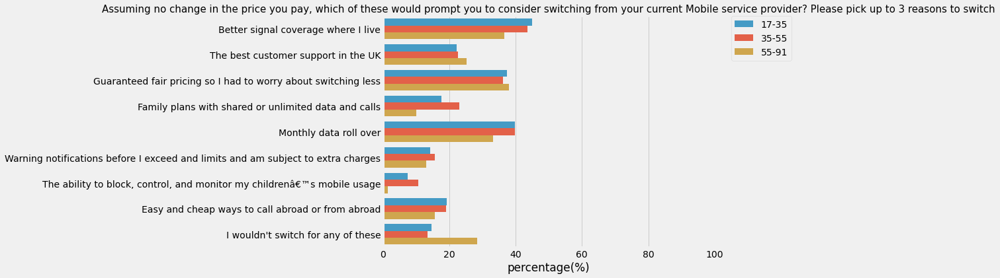

Number of answers in each group: 
17-35    1795
55-91    1158
35-55    1081
Name: Age_Band, dtype: int64


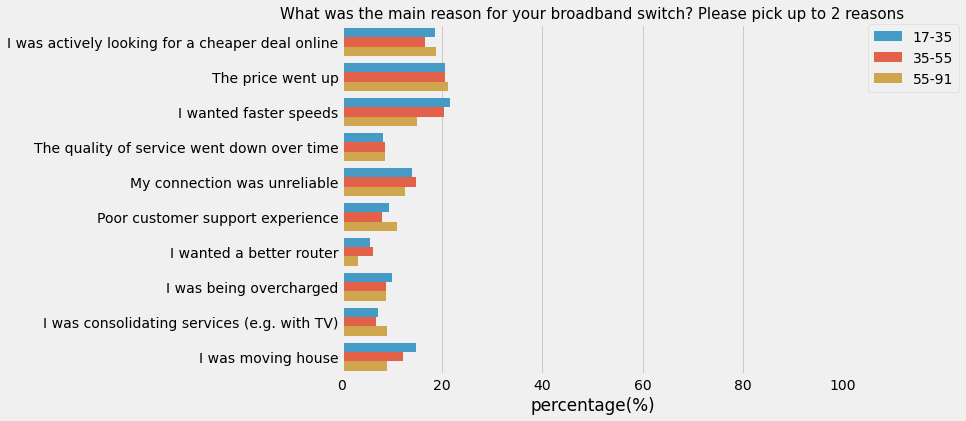

Number of answers in each group: 
17-35    1795
55-91    1158
35-55    1081
Name: Age_Band, dtype: int64


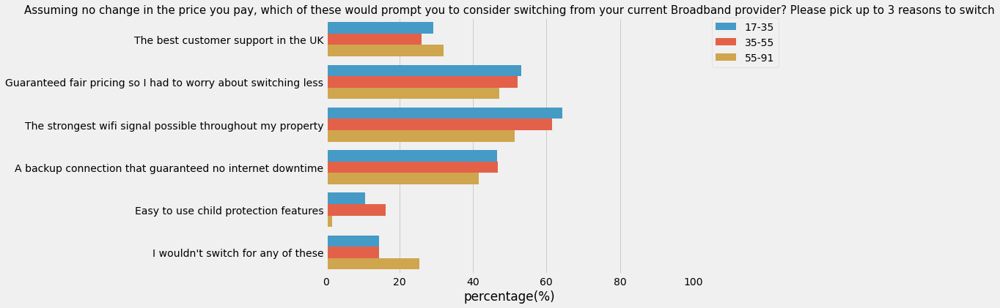

Number of answers in each group: 
17-35    1795
55-91    1158
35-55    1081
Name: Age_Band, dtype: int64


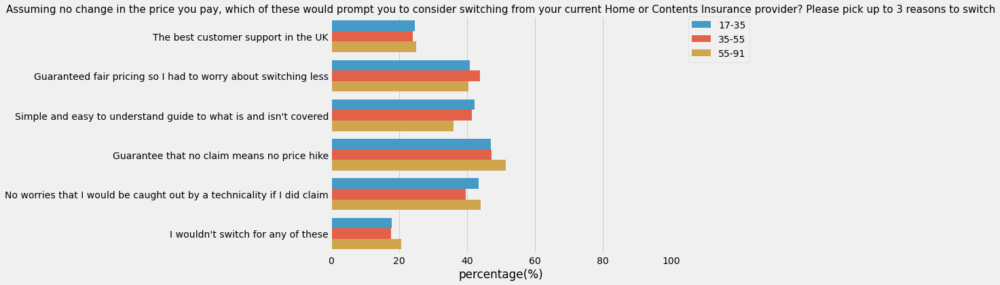

In [315]:
checkbox_list=[range(19,34),range(34,47),range(48,56),range(56,63),range(64,71),range(75,83),range(84,93),
               range(93,102),range(103,113),range(116,122),range(122,128)]

for col in checkbox_list:
    gen_chart_checkbox(tmp,col,'Age_Band')

Number of answers in each group: 
        Q128
Q11         
Female  2217
Male    1817


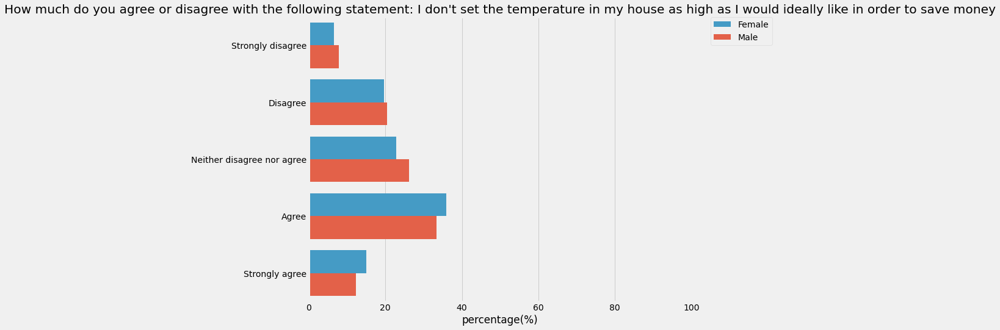

Number of answers in each group: 
            Q128
Q13             
Under £15k   991
£15-25k     1036
£25-35k      900
£35-50k      604
£50k+        503


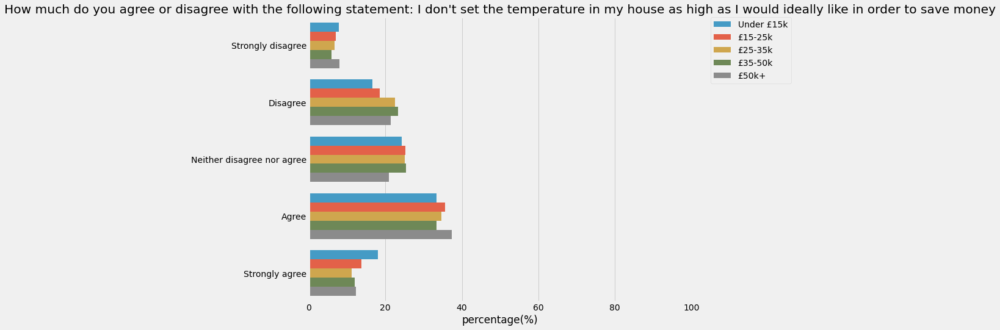

Number of answers in each group: 
      Q128
Q15       
Own   2689
Rent  1345


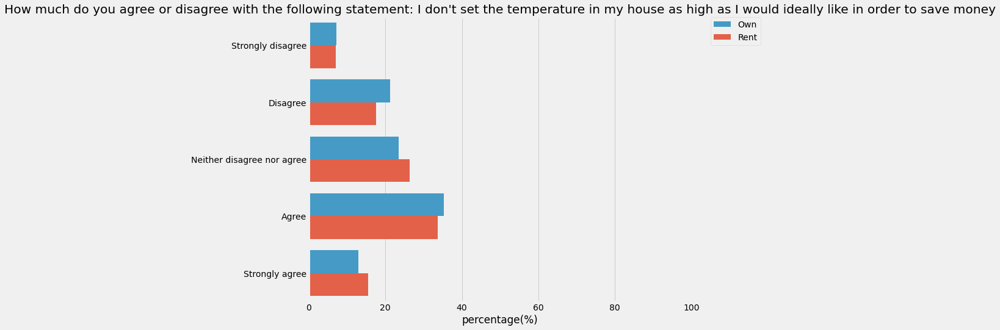

Number of answers in each group: 
           Q128
Q17            
1           754
2          1502
3           777
4           702
5 or more   299


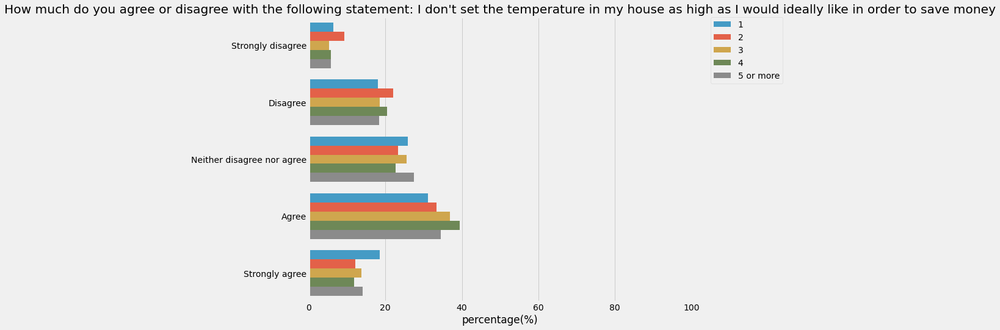

Number of answers in each group: 
          Q128
Age_Band      
17-35     1795
35-55     1081
55-91     1158


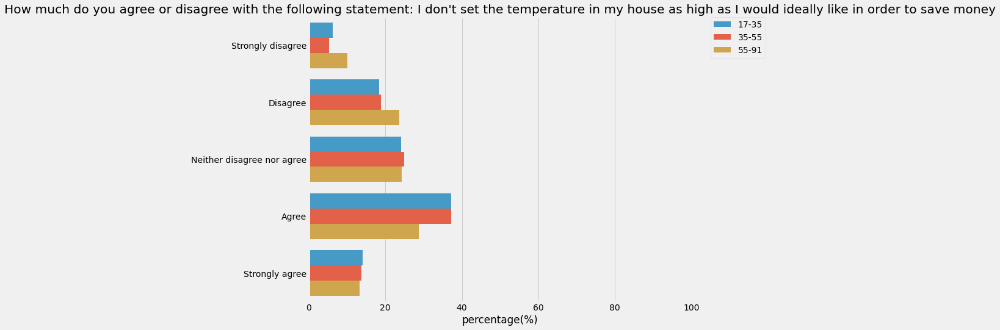

Number of answers in each group: 
                            Q128
Q47                             
Agree                       1219
Disagree                     585
Neither disagree nor agree  1448
Strongly agree               400
Strongly disagree            382


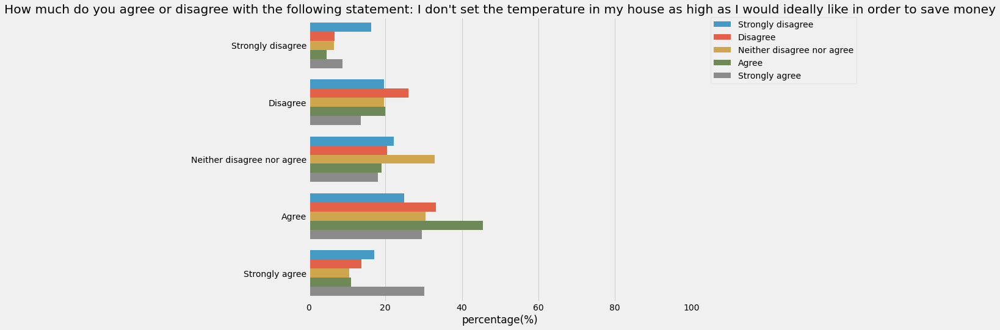

In [430]:
# Save money by low temperature: income of 50k+ agree much more with it
#People who agree( or strongly agree) significantly agree more with it
for q in ['Q11','Q13','Q15','Q17','Age_Band','Q47']:
    gen_chart_radiobutton(df,'Q128',index,q)

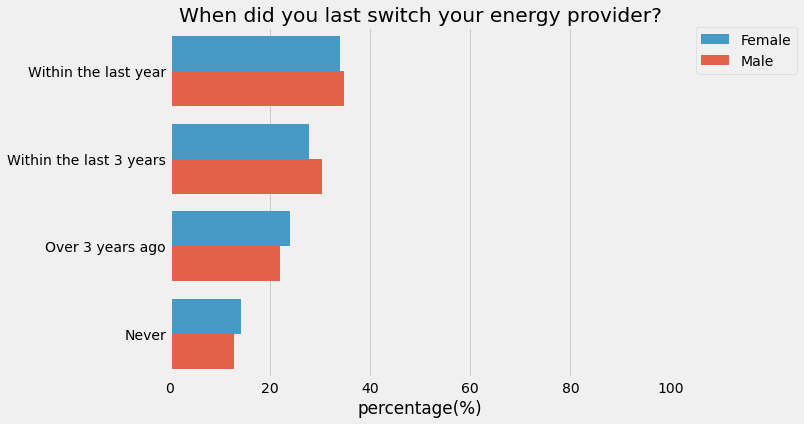

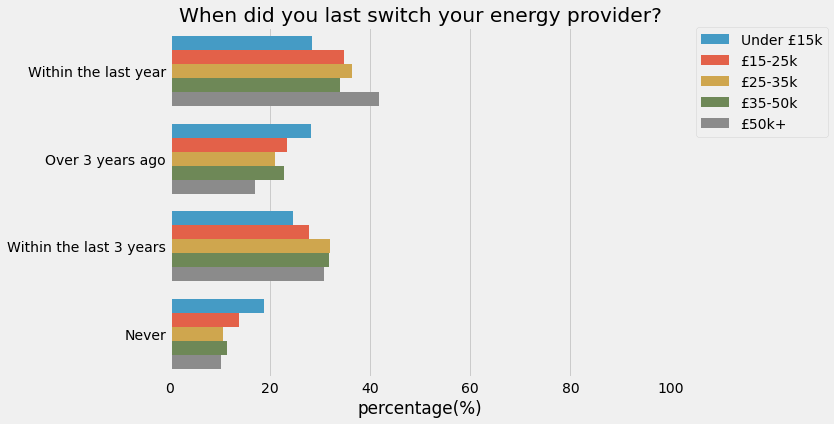

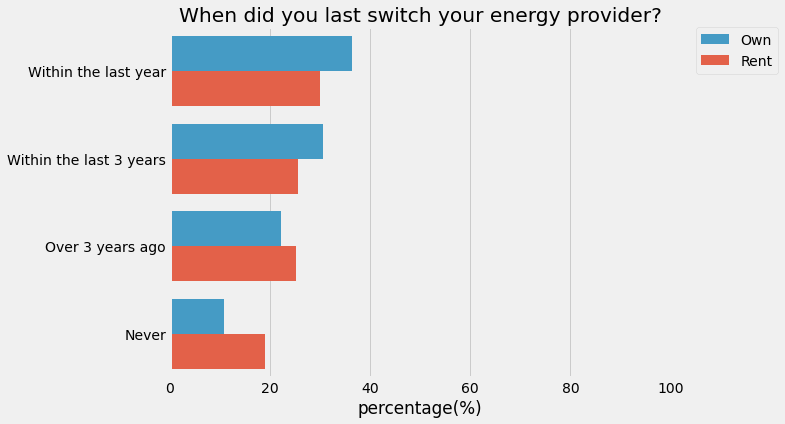

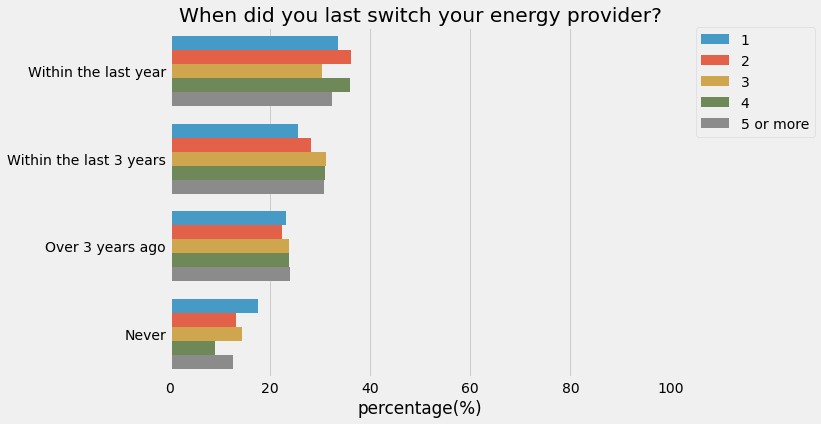

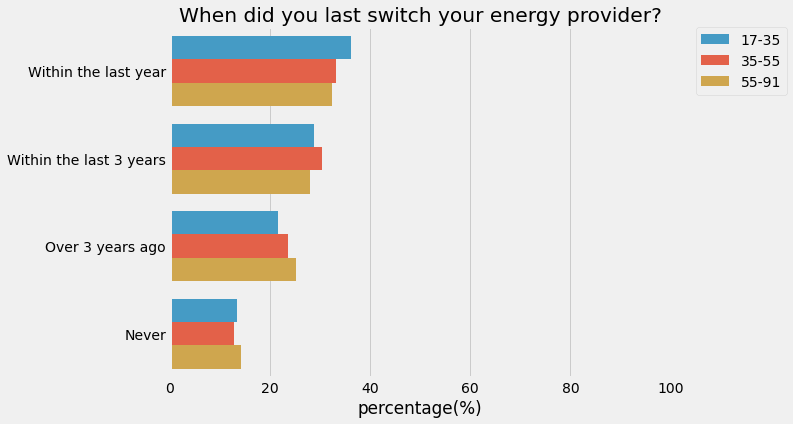

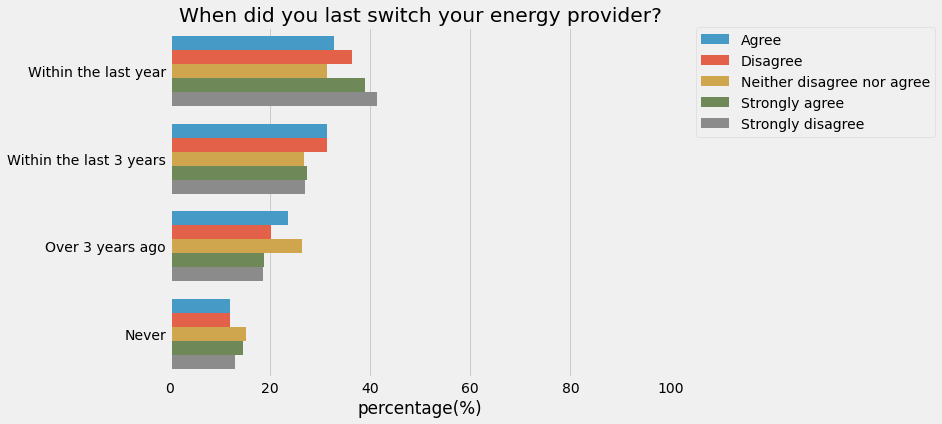

In [432]:
# Time for switch Energy: 50k+ significantly switch more within last year
# Renter tend to more never switch
for q in ['Q11','Q13','Q15','Q17','Age_Band','Q47']:
    plot_multiple_choices(tmp,q,'Q63')

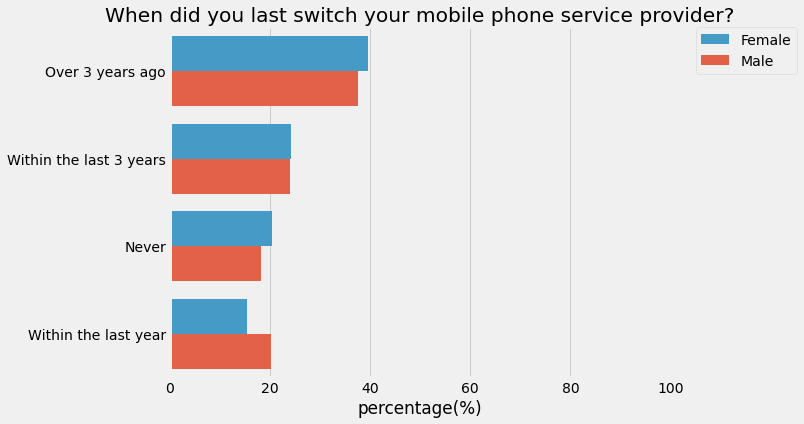

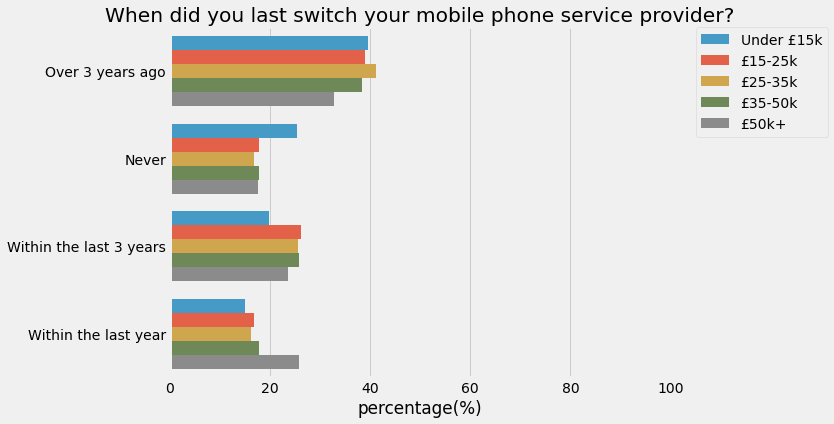

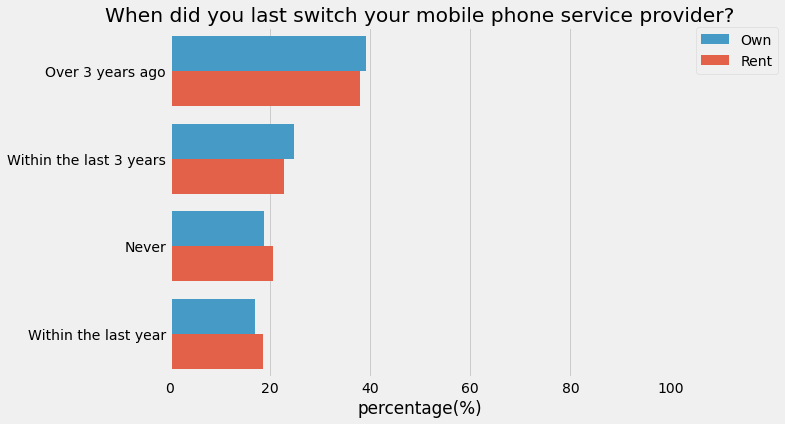

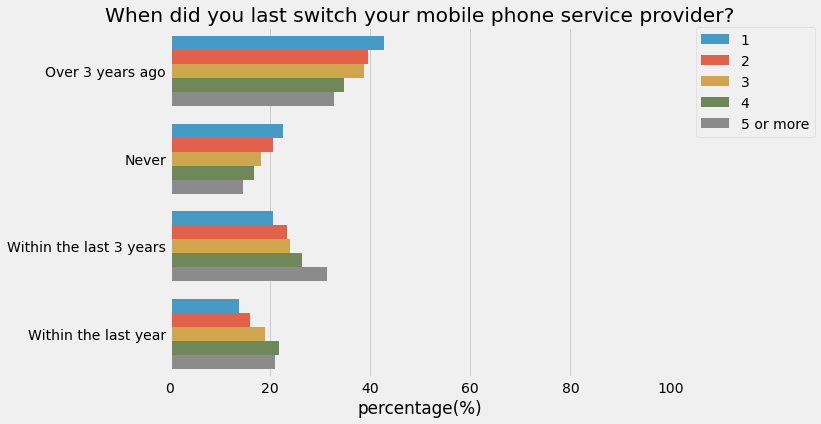

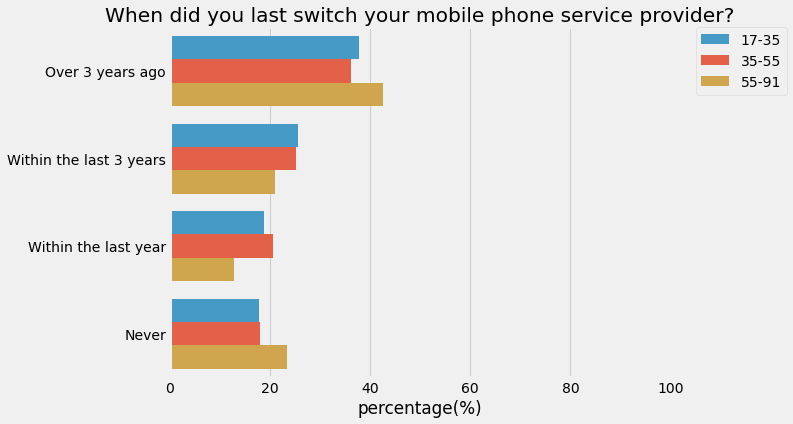

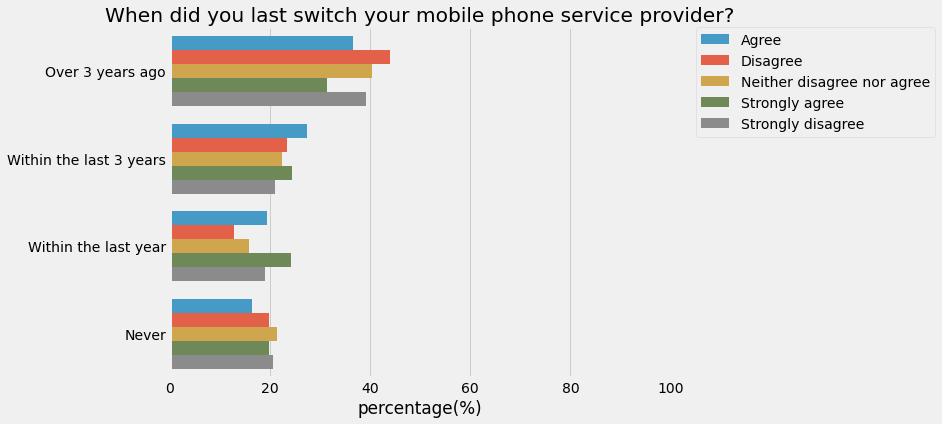

In [434]:
# Time for mobile switch: 50k+ significantly switch more within last year, same does BB switch
for q in ['Q11','Q13','Q15','Q17','Age_Band','Q47']:
    plot_multiple_choices(tmp,q,'Q83')

Number of answers in each group: 
£15-25k       1036
Under £15k     991
£25-35k        900
£35-50k        604
£50k+          503
Name: Q13, dtype: int64


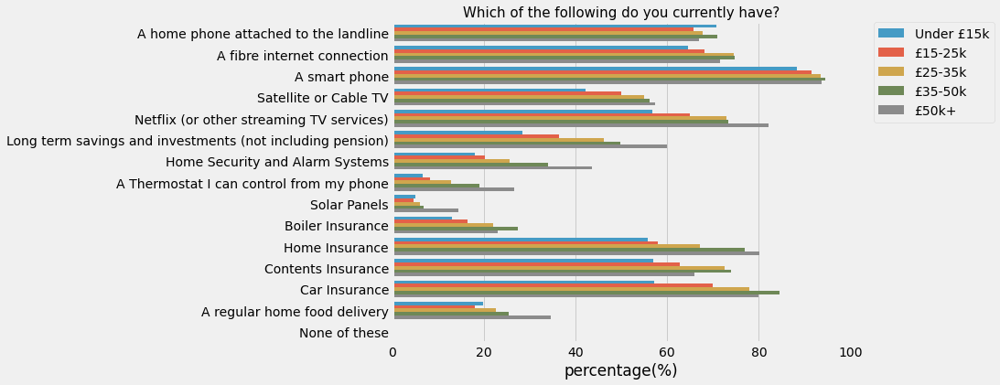

Number of answers in each group: 
£15-25k       1036
Under £15k     991
£25-35k        900
£35-50k        604
£50k+          503
Name: Q13, dtype: int64


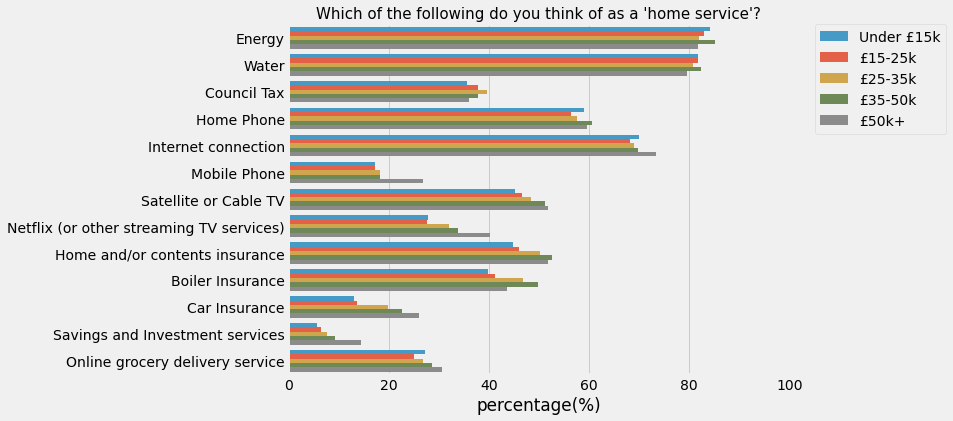

Number of answers in each group: 
£15-25k       1036
Under £15k     991
£25-35k        900
£35-50k        604
£50k+          503
Name: Q13, dtype: int64


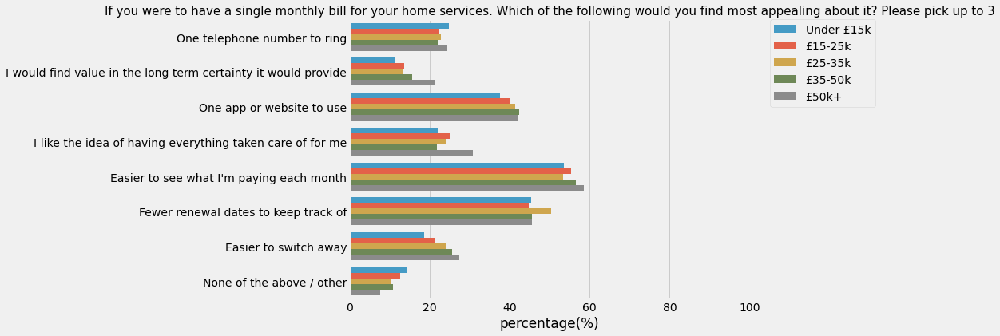

Number of answers in each group: 
£15-25k       1036
Under £15k     991
£25-35k        900
£35-50k        604
£50k+          503
Name: Q13, dtype: int64


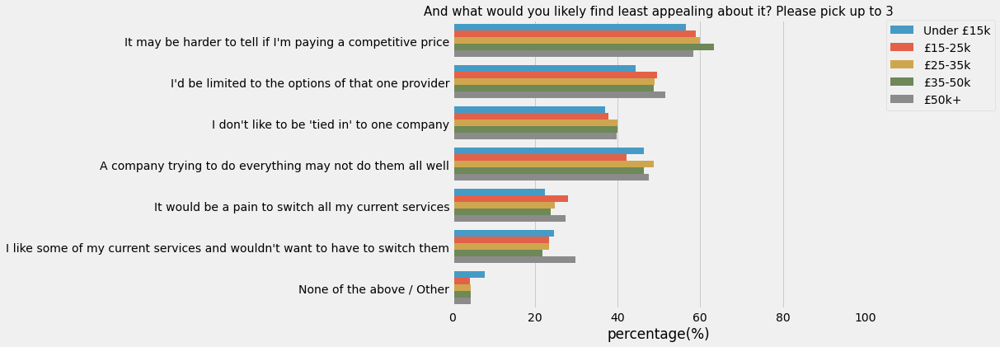

Number of answers in each group: 
£15-25k       1036
Under £15k     991
£25-35k        900
£35-50k        604
£50k+          503
Name: Q13, dtype: int64


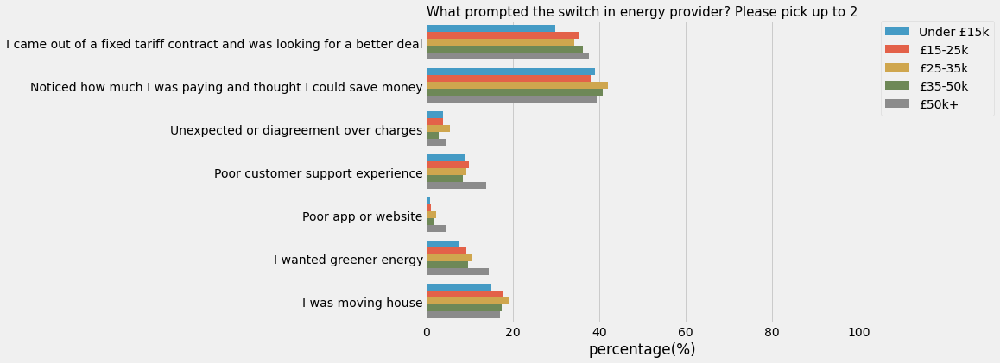

Number of answers in each group: 
£15-25k       1036
Under £15k     991
£25-35k        900
£35-50k        604
£50k+          503
Name: Q13, dtype: int64


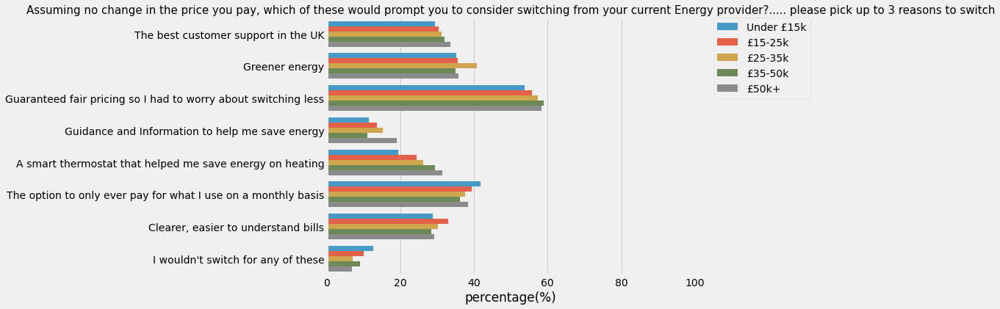

Number of answers in each group: 
£15-25k       1036
Under £15k     991
£25-35k        900
£35-50k        604
£50k+          503
Name: Q13, dtype: int64


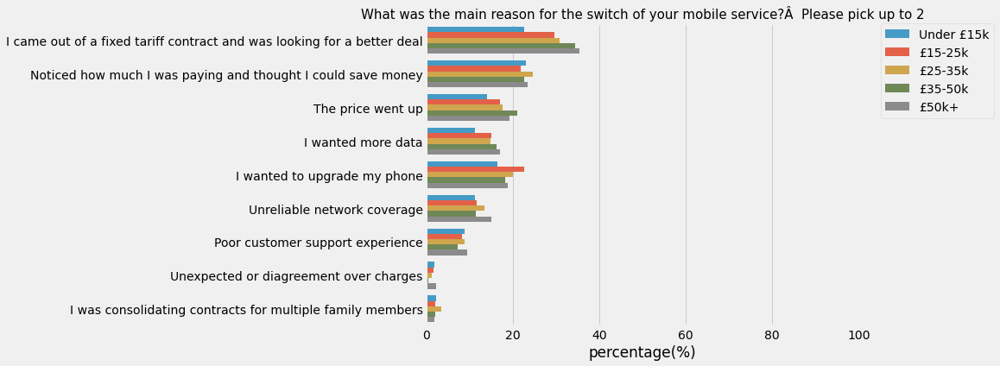

Number of answers in each group: 
£15-25k       1036
Under £15k     991
£25-35k        900
£35-50k        604
£50k+          503
Name: Q13, dtype: int64


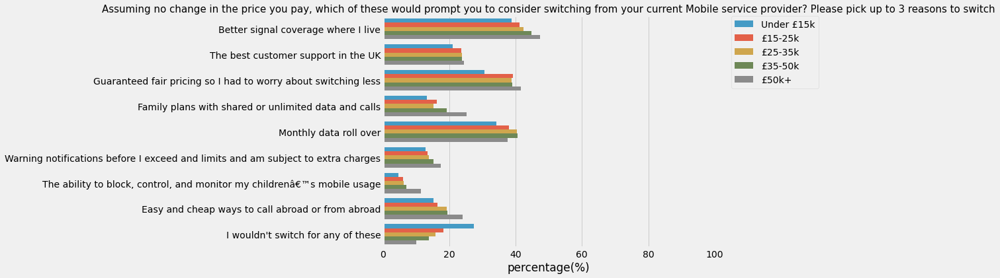

Number of answers in each group: 
£15-25k       1036
Under £15k     991
£25-35k        900
£35-50k        604
£50k+          503
Name: Q13, dtype: int64


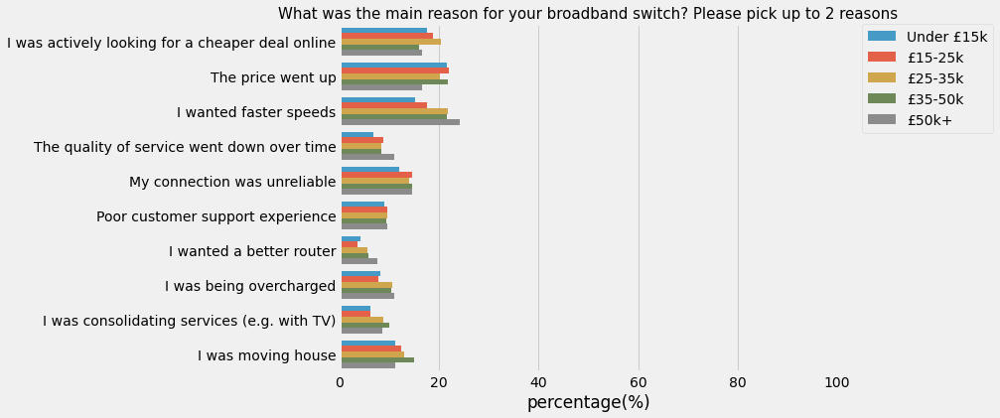

Number of answers in each group: 
£15-25k       1036
Under £15k     991
£25-35k        900
£35-50k        604
£50k+          503
Name: Q13, dtype: int64


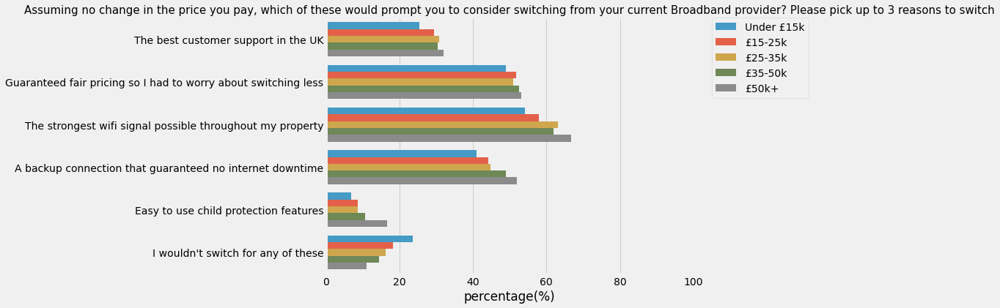

Number of answers in each group: 
£15-25k       1036
Under £15k     991
£25-35k        900
£35-50k        604
£50k+          503
Name: Q13, dtype: int64


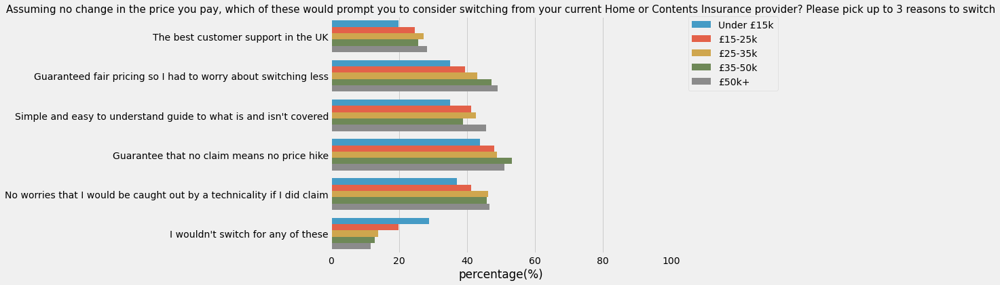

In [316]:
for col in checkbox_list:
    gen_chart_checkbox(tmp,col,'Q13')

Text(0.5, 1.0, 'Switch by Service Type')

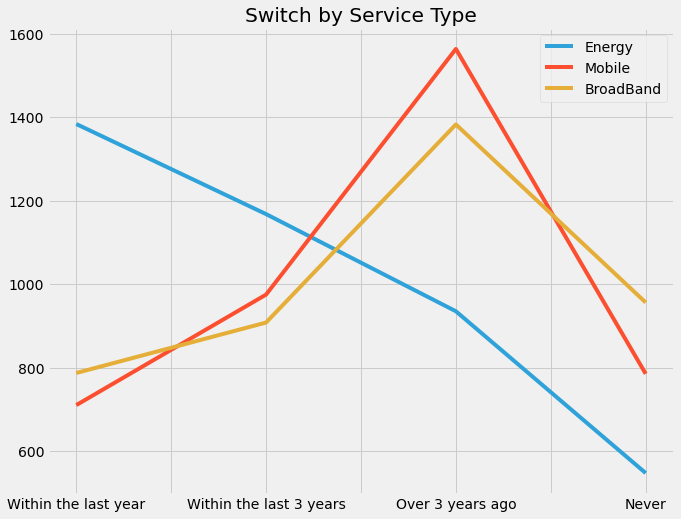

In [358]:
fig,ax=plt.subplots(figsize=(10,8))
pd.concat([pd.DataFrame(t.Energy_Switch.value_counts().rename('Energy')),pd.DataFrame(t.Mobile_Switch.value_counts().rename('Mobile')),pd.DataFrame(t.BroadBand_Switch.value_counts().rename('BroadBand'))],axis=1).plot(ax=ax)
plt.title('Switch by Service Type')

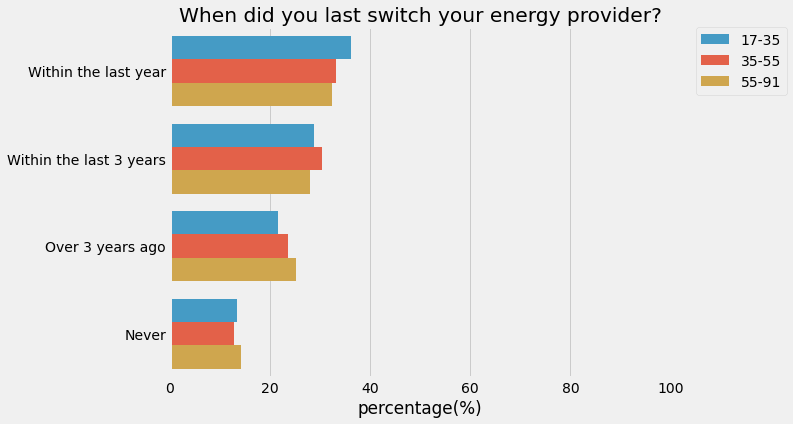

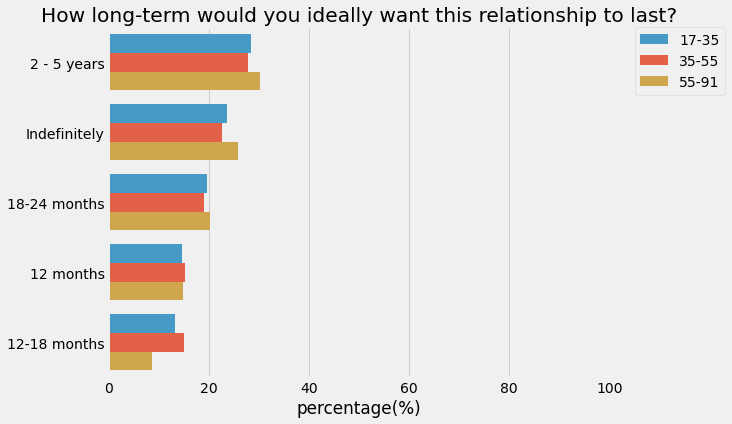

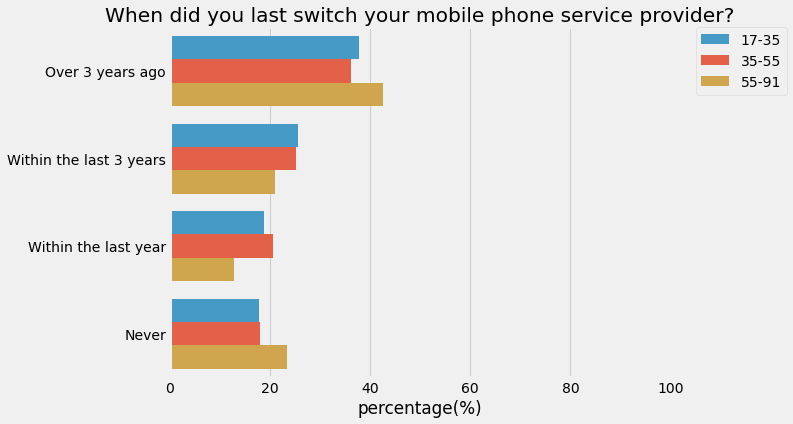

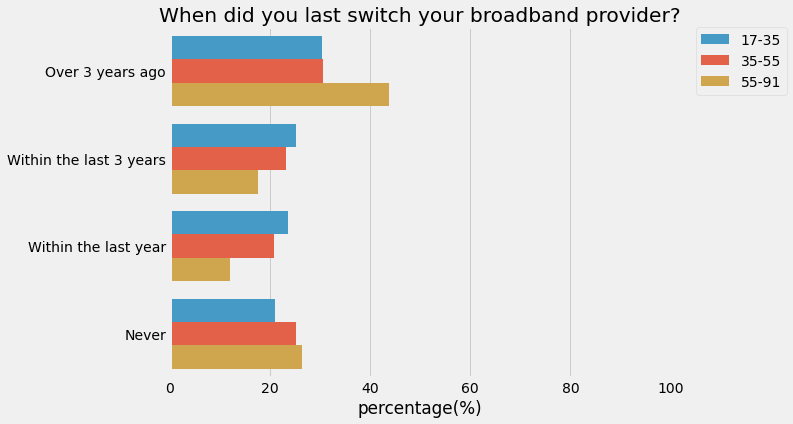

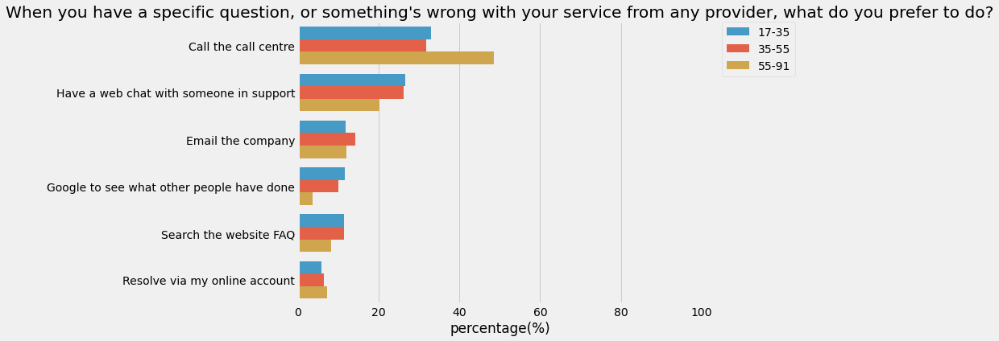

In [309]:
multiple_list=['Q63','Q72','Q83','Q102','Q129']
for q in multiple_list:
    plot_multiple_choices(tmp,'Age_Band',q)

Number of answers in each group: 
Own     2689
Rent    1345
Name: Q15, dtype: int64


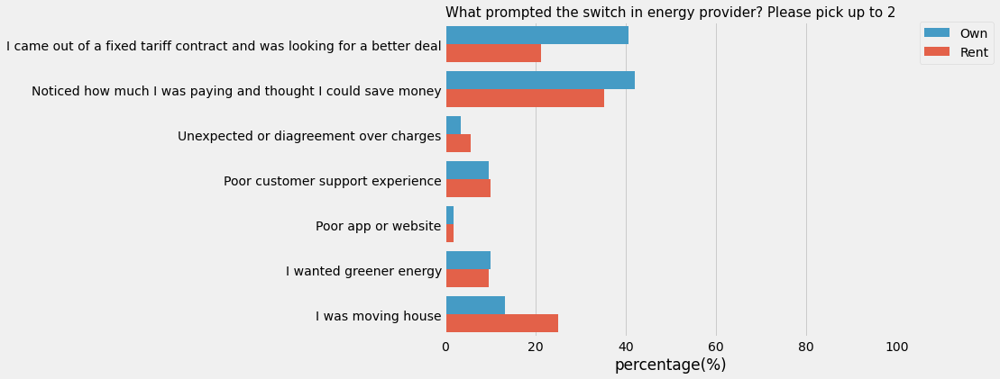

In [310]:
## Main reason for people to switch is money saving and looking for a better deal
gen_chart_checkbox(tmp, range(64,71),'Q15')

Number of answers in each group: 
Female    2217
Male      1817
Name: Q11, dtype: int64


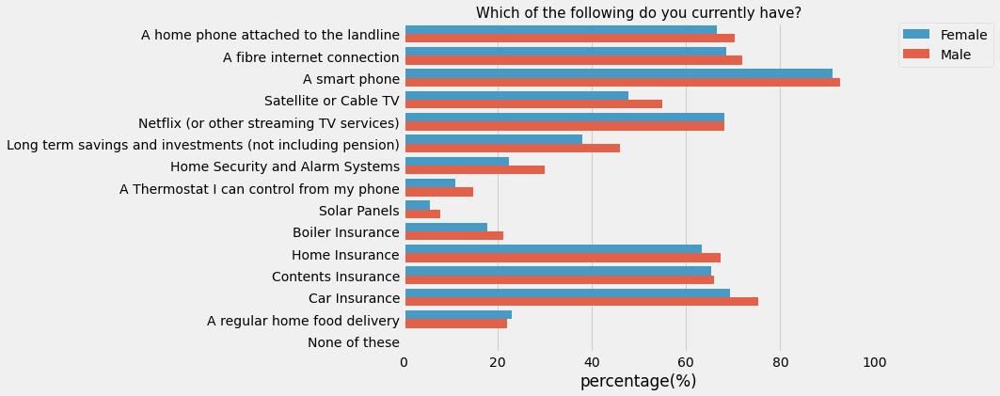

In [311]:
## Across the gender,smart phone is their most used service,followed by car insurance,fibre connection and Netflix 
gen_chart_checkbox(tmp, range(19,34),'Q11')